In [1]:
!pip install nibabel
!pip install einops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.5 MB/s eta 0:00:00


In [2]:
import nibabel as nib
from glob import glob
import torch
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange #pip install einops
from typing import List
import random
import math
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from timm.utils import ModelEmaV3 #pip install timm
from tqdm import tqdm #pip install tqdm
import matplotlib.pyplot as plt #pip install matplotlib
import torch.optim as optim
import numpy as np

In [3]:
import re

def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
    (See Toothy's implementation in the comments)
    '''
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]

In [4]:
img_path = glob("/kaggle/input/brats18/dataset/Train/BraTS18_Training_*/BraTS18_Training_*_flair.nii")
mask_path = glob("/kaggle/input/brats18/dataset/Train/BraTS18_Training_*/BraTS18_Training_*_seg.nii")
# mask_path = glob("/kaggle/input/liver-tumor-segmentation/segmentations/segmentation-*.nii")

# mask_path = mask_path[:11]
print("Number of images :", len(mask_path))

Number of images : 285


In [5]:
img_path.sort(key=natural_keys)
mask_path.sort(key=natural_keys)

In [6]:
18*8

144

In [7]:
import numpy as np
def downsample_volume(volume, factor=2):
    # Check if the volume dimensions are divisible by the factor
    volume = volume[:,:,4:148]
    assert all(dim % factor == 0 for dim in volume.shape), "Volume dimensions must be divisible by the factor."
    
    # Reshape and downsample
    downsampled = volume.reshape(
        volume.shape[0] // factor, factor,
        volume.shape[1] // factor, factor,
        volume.shape[2] // factor ,factor
    ).mean(axis=(1, 3, 5))
    
    downsampled = downsampled[:,:,:]
    return downsampled

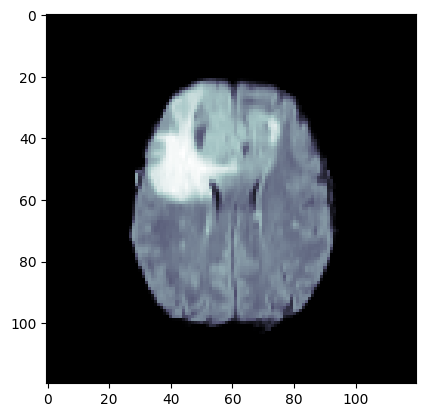

(120, 120, 72)


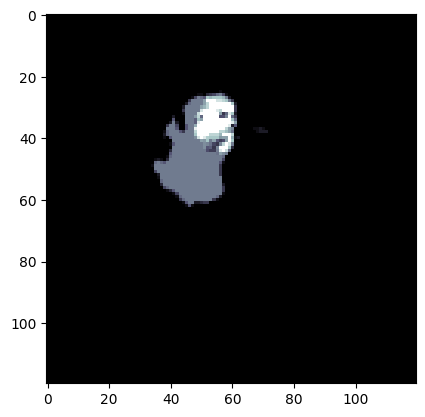

379.71875


In [8]:
img_ex = nib.load(img_path[0]).get_fdata()
img_ex = downsample_volume(img_ex)
# print(img_ex.shape)
plt.imshow(np.rot90(img_ex[:,:,45]/np.max(img_ex[:,:,45]), 3), cmap = 'bone')
plt.show()
print(img_ex.shape)

img_ex = nib.load(mask_path[0]).get_fdata()
img_ex = downsample_volume(img_ex)
# print(img_ex.shape)
plt.imshow(np.rot90(img_ex[:,:,50]/np.max(img_ex[:,:,50]), 3), cmap = 'bone')
plt.show()
print(np.sum(img_ex[:,:,50]/np.max(img_ex[:,:,50])))

In [9]:
def slice_to_patch(slice, patch_ratio):
  
  slice[slice == 1] = 0
  slice[slice == 2] = 1
  
  patch_list = []
  
  for x_bin in range(2, len(patch_ratio)):
    for y_bin in range(2, len(patch_ratio)):
      patch = slice[patch_ratio[x_bin-2] : patch_ratio[x_bin], patch_ratio[y_bin - 2] : patch_ratio[y_bin]]
      patch = patch.reshape(patch.shape + (1,))
      patch_list.append(patch)
  
  return np.array(patch_list)

In [10]:
def patch_to_slice(patch, patch_ratio, input_shape, conf_threshold):
  
  slice = np.zeros((512, 512, 1))
  row_idx = 0
  col_idx = 0
  
  for i in range(len(patch)):
    
    slice[patch_ratio[row_idx]:patch_ratio[row_idx + 2], patch_ratio[col_idx]:patch_ratio[col_idx + 2]][patch[i] > conf_threshold] = 1
    
    col_idx += 1
    
    if i != 0 and (i+1) % 15 == 0:
      row_idx += 1
      col_idx = 0
  
  return slice

In [11]:
total_data = 0
total_patch = []
# img_path = img_path[:125]
for i in range(len(img_path)):
  
  img_3D = nib.load(img_path[i]).get_fdata()
  patch = torch.tensor(downsample_volume(img_3D), dtype=torch.float32)
  img_3D_mask = nib.load(mask_path[i]).get_fdata()
  patch_mask = torch.tensor(downsample_volume(img_3D_mask), dtype=torch.float32)
  # patch = patch_sampling(img_3D,patch_ratio)
  # print(patch.shape)
  for k in range(patch.shape[2]):
      m = patch[:,:,k]/(torch.max(patch[:,:,k]+0.000001))
      m_mask = patch_mask[:,:,k]/(torch.max(patch_mask[:,:,k]+0.000001))
      
      # print(m)
      if torch.sum(m_mask)<=0:
          total_patch.append(m)
      # print(m.shape,torch.max(m),torch.min(m))
      # break
  

  print("======= Step [{0} / {1}] : # of patches = {2} | # of total training images = {3} =======".
        format(format(i+1, '>2'), len(img_path),format(len(patch)), format(len(total_patch), '>5')))

======= Step [ 1 / 285] : # of patches = 120 | # of total training images =    31 =======
======= Step [ 2 / 285] : # of patches = 120 | # of total training images =    78 =======
======= Step [ 3 / 285] : # of patches = 120 | # of total training images =   124 =======
======= Step [ 4 / 285] : # of patches = 120 | # of total training images =   150 =======
======= Step [ 5 / 285] : # of patches = 120 | # of total training images =   204 =======
======= Step [ 6 / 285] : # of patches = 120 | # of total training images =   239 =======
======= Step [ 7 / 285] : # of patches = 120 | # of total training images =   271 =======
======= Step [ 8 / 285] : # of patches = 120 | # of total training images =   312 =======
======= Step [ 9 / 285] : # of patches = 120 | # of total training images =   355 =======
======= Step [10 / 285] : # of patches = 120 | # of total training images =   400 =======
======= Step [11 / 285] : # of patches = 120 | # of total training images =   438 =======
======= St

In [12]:
 20520//64*64

20480

In [13]:
total_patch =total_patch[:5000]

In [14]:
len(total_patch)

5000

In [15]:
12825//32

400

In [16]:
# Imports


class SinusoidalEmbeddings(nn.Module):
    def __init__(self, time_steps:int, embed_dim: int):
        super().__init__()
        position = torch.arange(time_steps).unsqueeze(1).float()  #creat position value
        div = torch.exp(torch.arange(0, embed_dim, 2).float() * -(math.log(10000.0) / embed_dim))
        embeddings = torch.zeros(time_steps, embed_dim, requires_grad=False)
        embeddings[:, 0::2] = torch.sin(position * div)
        embeddings[:, 1::2] = torch.cos(position * div)
        self.embeddings = embeddings

    def forward(self, x, t):
        embeds = self.embeddings[t].to(x.device)

        return embeds[:, :, None, None]

In [17]:
class ResBlock(nn.Module):
    def __init__(self, C: int, num_groups: int, dropout_prob: float):
        super().__init__()
        self.relu = nn.ReLU(inplace=True)
        self.gnorm1 = nn.GroupNorm(num_groups=num_groups, num_channels=C)
        self.gnorm2 = nn.GroupNorm(num_groups=num_groups, num_channels=C)
        self.conv1 = nn.Conv2d(C, C, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(C, C, kernel_size=3, padding=1)
        self.dropout = nn.Dropout(p=dropout_prob, inplace=True)

    def forward(self, x, embeddings):
        x = x + embeddings[:, :x.shape[1], :, :]
        r = self.conv1(self.relu(self.gnorm1(x)))
        r = self.dropout(r)
        r = self.conv2(self.relu(self.gnorm2(r)))
        return r + x

In [18]:
class Attention(nn.Module):
    def __init__(self, C: int, num_heads:int , dropout_prob: float):
        super().__init__()
        self.proj1 = nn.Linear(C, C*3)
        self.proj2 = nn.Linear(C, C)
        self.num_heads = num_heads
        self.dropout_prob = dropout_prob

    def forward(self, x):
        h, w = x.shape[2:]
        x = rearrange(x, 'b c h w -> b (h w) c')
        x = self.proj1(x)
        x = rearrange(x, 'b L (C H K) -> K b H L C', K=3, H=self.num_heads)
        q,k,v = x[0], x[1], x[2]
        x = F.scaled_dot_product_attention(q,k,v, is_causal=False, dropout_p=self.dropout_prob)
        x = rearrange(x, 'b H (h w) C -> b h w (C H)', h=h, w=w)
        x = self.proj2(x)
        return rearrange(x, 'b h w C -> b C h w')


In [19]:

class UnetLayer(nn.Module):
    def __init__(self,
            upscale: bool,
            attention: bool,
            num_groups: int,
            dropout_prob: float,
            num_heads: int,
            C: int):
        super().__init__()
        self.ResBlock1 = ResBlock(C=C, num_groups=num_groups, dropout_prob=dropout_prob)
        self.ResBlock2 = ResBlock(C=C, num_groups=num_groups, dropout_prob=dropout_prob)
        if upscale:
            self.conv = nn.ConvTranspose2d(C, C//2, kernel_size=4, stride=2, padding=1)
        else:
            self.conv = nn.Conv2d(C, C*2, kernel_size=3, stride=2, padding=1)
        if attention:
            self.attention_layer = Attention(C, num_heads=num_heads, dropout_prob=dropout_prob)

    def forward(self, x, embeddings):
        x = self.ResBlock1(x, embeddings)
        if hasattr(self, 'attention_layer'):
            x = self.attention_layer(x)
        x = self.ResBlock2(x, embeddings)
        return self.conv(x), x

In [20]:
class UNET(nn.Module):
    def __init__(self,
            Channels: List = [64, 128, 256,512,512, 384],
            # Channels: List = [64,128,256,512,1024,1024,768, 512],
            Attentions: List = [False, True, False, False, False, True],
            Upscales: List = [False, False, False, True, True, True],
            num_groups: int = 32,
            dropout_prob: float = 0.1,
            num_heads: int = 8,
            input_channels: int = 1,
            output_channels: int = 1,
            time_steps: int = 1000):
        super().__init__()
        self.num_layers = len(Channels)
        self.shallow_conv = nn.Conv2d(input_channels, Channels[0], kernel_size=3, padding=1)
        out_channels = (Channels[-1]//2)+Channels[0]
        self.late_conv = nn.Conv2d(out_channels, out_channels//2, kernel_size=3, padding=1)
        self.output_conv = nn.Conv2d(out_channels//2, output_channels, kernel_size=1)
        self.relu = nn.ReLU(inplace=True)
        self.embeddings = SinusoidalEmbeddings(time_steps=time_steps, embed_dim=max(Channels))
        for i in range(self.num_layers):
            layer = UnetLayer(
                upscale=Upscales[i],
                attention=Attentions[i],
                num_groups=num_groups,
                dropout_prob=dropout_prob,
                C=Channels[i],
                num_heads=num_heads
            )
            setattr(self, f'Layer{i+1}', layer)

    def forward(self, x, t):
        
        x = self.shallow_conv(x)
        residuals = []
        for i in range(self.num_layers//2):
            layer = getattr(self, f'Layer{i+1}')
            embeddings = self.embeddings(x, t)
            x, r = layer(x, embeddings)
            residuals.append(r)
        for i in range(self.num_layers//2, self.num_layers):
            layer = getattr(self, f'Layer{i+1}')
            x = torch.concat((layer(x, embeddings)[0], residuals[self.num_layers-i-1]), dim=1)
        return self.output_conv(self.relu(self.late_conv(x)))

In [21]:
class DDPM_Scheduler(nn.Module):
    def __init__(self, num_time_steps: int=1000):
        super().__init__()
        self.beta = torch.linspace(1e-4, 0.02, num_time_steps, requires_grad=False)
        alpha = 1 - self.beta
        self.alpha = torch.cumprod(alpha, dim=0).requires_grad_(False)

    def forward(self, t):
        return self.beta[t], self.alpha[t]

In [22]:
def set_seed(seed: int = 42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)

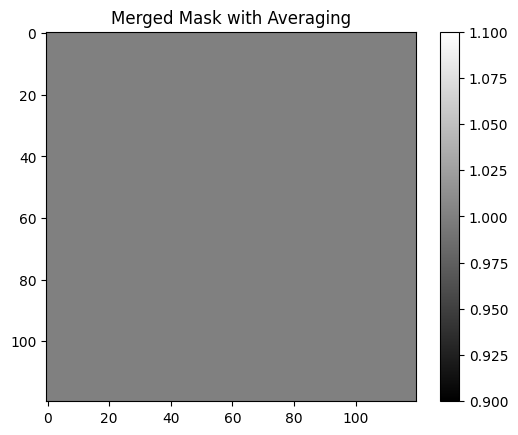

In [23]:
base_mask = torch.zeros((2, 1, 120, 120), requires_grad=False)
device = 'cuda'
# Clone the base mask to create four different masks
mask1 = base_mask.clone().to(device)
# mask2 = base_mask.clone().to(device)
# mask3 = base_mask.clone().to(device)
# mask4 = base_mask.clone().to(device)

# Modify specific regions in each mask
# mask1[:,:,0:60, 0:60] = 1       # Top-left region
# mask2[:,:,0:60, 60:120] = 1     # Top-right region
# mask3[:,:,60:120, 0:60] = 1     # Bottom-left region
# mask4[:,:,60:120, 60:120] = 1   # Bottom-right region
# plt.imshow(mask2.squeeze(0).squeeze(0),cmap='gray')
mask = []
patch = [0,30,60,90,120]
for i in range(len(patch)-2):
    for j in range(len(patch)-2):
        mask1 = base_mask.clone().to(device)
        mask1[:,:,patch[i]:patch[i+2], patch[j]:patch[j+2]] = 1
        new = mask1
        mask.append(new)
        
import torch
import matplotlib.pyplot as plt

# Initialize base mask and device
base_mask = torch.zeros((1, 1, 120, 120), requires_grad=False)
device = 'cuda'

# Patch sizes and positions
patch = [0, 30, 60, 90, 120]
mask = []

# Generate masks for patches
for i in range(len(patch) - 2):
    for j in range(len(patch) - 2):
        mask1 = base_mask.clone().to(device)
        mask1[:, :, patch[i]:patch[i+2], patch[j]:patch[j+2]] = 1
        mask.append(mask1)

# Initialize accumulators for summing masks and counting overlaps
merged_mask_sum = torch.zeros_like(base_mask).to(device)  # Sum of all masks
merged_mask_count = torch.zeros_like(base_mask).to(device)  # Count contributions

# Add each mask to the accumulators
for m in mask:
    merged_mask_sum += m
    merged_mask_count += (m > 0).float()  # Increment count where mask > 0

# Avoid division by zero
merged_mask_count = torch.where(merged_mask_count == 0, torch.tensor(1.0).to(device), merged_mask_count)

# Compute the averaged mask
merged_mask_avg = merged_mask_sum / merged_mask_count

# Visualize the averaged mask (for first channel, first batch)
plt.imshow(merged_mask_avg[0, 0].cpu().detach().numpy(), cmap='gray')
plt.title("Merged Mask with Averaging")
plt.colorbar()
plt.show()



In [24]:
def train(batch_size: int=2,
          num_time_steps: int=1000,
          num_epochs: int=15,
          seed: int=-1,
          ema_decay: float=0.9999,
          lr=1e-5,
          checkpoint_path: str=None):
    set_seed(random.randint(0, 2**32-1)) if seed == -1 else set_seed(seed)

    # train_dataset = datasets.MNIST(root='./data', train=True, download=True,transform=transforms.ToTensor())
    # train_dataset =TensorDataset(torch.tensor(total_patch).float())
    # train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True, num_workers=4)
    # train_dataset = datasets.MNIST(root='./data', train=True, download=True,transform=transforms.ToTensor())
    train_loader = DataLoader(total_patch, batch_size=2, shuffle=True, drop_last=True, num_workers=4)
    scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
    model = UNET().cuda()
    # print(model)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    ema = ModelEmaV3(model, decay=ema_decay)
    if checkpoint_path is not None:
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['weights'])
        ema.load_state_dict(checkpoint['ema'])
        optimizer.load_state_dict(checkpoint['optimizer'])
    criterion = nn.MSELoss(reduction='mean')

    for i in range(num_epochs):
        total_loss = 0
        for index,x in enumerate(tqdm( train_loader, desc=f"Epoch {i+1}/{num_epochs}")):
            
                
            x = x.unsqueeze(1) 
            # print(x.shape)
            x = x.cuda()
            # print(x.shape,torch.max(x),torch.min(x))
            # break
            # x = F.pad(x, (1,1,1,1))
            # print(x.shape,torch.max(x),torch.min(x))
            # break
            t = torch.randint(0,num_time_steps,(batch_size,))
            e = torch.randn_like(x, requires_grad=False)
            a = scheduler.alpha[t].view(batch_size,1,1,1).cuda()
            x_out = (torch.sqrt(a)*x) + (torch.sqrt(1-a)*e)
            for k in range(len(mask)):
                x_out_k = x*(1-mask[k]) + x_out*mask[k]
                # print(x.shape,mask[i].shape,x_out.shape)
                output = model(x_out_k, t)
                optimizer.zero_grad()
                loss = criterion(output*mask[k], x*mask[k])
                total_loss += loss.item()
                loss.backward()
                optimizer.step()
                ema.update(model)
        print(f'Epoch {i+1} | Loss {total_loss/batch_size/4:.5f}')

        checkpoint = {
            'weights': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'ema': ema.state_dict()
        }
        torch.save(checkpoint, '/kaggle/working/ddpm')

In [25]:
# import torch
# import numpy as np
# from einops import rearrange
# from typing import List
# import matplotlib.pyplot as plt

# # Display function remains unchanged
# def display_reverse(images: List):
#     fig, axes = plt.subplots(1, 10, figsize=(10, 1))
#     for i, ax in enumerate(axes.flat):
#         x = images[i].squeeze(0)
#         x = rearrange(x, 'c h w -> h w c')
#         x = x.numpy()
#         ax.imshow(x)
#         ax.axis('off')
#     plt.show()

# # Patch extraction function
# def extract_patches(image, patch_size):
#     patches = []
#     h, w = image.shape[-2:]
#     for i in range(0, h, patch_size[0]):
#         for j in range(0, w, patch_size[1]):
#             patch = image[:, :, i:i+patch_size[0], j:j+patch_size[1]]
#             patches.append(patch)
#     return patches

# # Patch reconstruction function
# def reconstruct_image(patches, image_shape, patch_size):
#     reconstructed = torch.zeros(image_shape)
#     h, w = image_shape[-2:]
#     idx = 0
#     for i in range(0, h, patch_size[0]):
#         for j in range(0, w, patch_size[1]):
#             reconstructed[:, :, i:i+patch_size[0], j:j+patch_size[1]] = patches[idx]
#             idx += 1
#     return reconstructed

# # Updated inference function
# def inference_whole_image(checkpoint_path: str = None,
#                           num_time_steps: int = 1000,
#                           ema_decay: float = 0.9999,
#                           image_size=(240, 240),
#                           patch_size=(24, 24)):
#     checkpoint = torch.load(checkpoint_path)
#     model = UNET().cuda()
#     model.load_state_dict(checkpoint['weights'])
#     ema = ModelEmaV3(model, decay=ema_decay)
#     ema.load_state_dict(checkpoint['ema'])
#     scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
#     times = [0, 15, 50, 100, 200, 300, 400, 550, 700, 999]
#     final_images = []

#     with torch.no_grad():
#         model = ema.module.eval()

#         # Generate noise for the entire image
#         z_whole = torch.randn(1, 1, *image_size)
#         patches = extract_patches(z_whole, patch_size)
#         denoised_patches = []

#         for patch in patches:
#             images = []
#             z = patch.clone()
#             for t in reversed(range(1, num_time_steps)):
#                 t = [t]
#                 temp = (scheduler.beta[t] / ((torch.sqrt(1 - scheduler.alpha[t])) * (torch.sqrt(1 - scheduler.beta[t]))))
#                 z = (1 / (torch.sqrt(1 - scheduler.beta[t]))) * z - (temp * model(z.cuda(), t).cpu())
#                 if t[0] in times:
#                     images.append(z)
#                 e = torch.randn_like(z)
#                 z = z + (e * torch.sqrt(scheduler.beta[t]))

#             temp = scheduler.beta[0] / ((torch.sqrt(1 - scheduler.alpha[0])) * (torch.sqrt(1 - scheduler.beta[0])))
#             x = (1 / (torch.sqrt(1 - scheduler.beta[0]))) * z - (temp * model(z.cuda(), [0]).cpu())
#             denoised_patches.append(x)

#         # Reconstruct the whole image from patches
#         final_image = reconstruct_image(denoised_patches, (1, 1, *image_size), patch_size)

#         # Visualize and return
#         x = rearrange(final_image.squeeze(0), 'c h w -> h w c').detach()
#         x = x.numpy()
#         plt.imshow(x)
#         plt.show()

#         return final_image


In [26]:
train(checkpoint_path=None, lr=1e-5, num_epochs=6)

Epoch 1/6: 100%|██████████| 2500/2500 [1:20:42<00:00,  1.94s/it]


Epoch 1 | Loss 22.14016


Epoch 2/6: 100%|██████████| 2500/2500 [1:20:52<00:00,  1.94s/it]


Epoch 2 | Loss 10.50447


Epoch 3/6: 100%|██████████| 2500/2500 [1:21:11<00:00,  1.95s/it]


Epoch 3 | Loss 7.65819


Epoch 4/6: 100%|██████████| 2500/2500 [1:21:29<00:00,  1.96s/it]


Epoch 4 | Loss 6.55113


Epoch 5/6: 100%|██████████| 2500/2500 [1:21:40<00:00,  1.96s/it]


Epoch 5 | Loss 6.06865


Epoch 6/6: 100%|██████████| 2500/2500 [1:21:49<00:00,  1.96s/it]


Epoch 6 | Loss 5.81496


In [27]:
base_mask = torch.zeros((1, 1, 120, 120), requires_grad=False)
device = 'cpu'

# Patch sizes and positions
patch = [0, 30, 60, 90, 120]
mask = []

# Generate masks for patches
for i in range(len(patch) - 2):
    for j in range(len(patch) - 2):
        mask1 = base_mask.clone().to(device)
        mask1[:, :, patch[i]:patch[i+2], patch[j]:patch[j+2]] = 1
        mask.append(mask1)

# Initialize accumulators for summing masks and counting overlaps
def maskk(base_mask,mask):
    device = 'cpu'
    merged_mask_sum = torch.zeros_like(base_mask).to(device)  # Sum of all masks
    merged_mask_count = torch.zeros_like(base_mask).to(device)  # Count contributions
    
    # Add each mask to the accumulators
    for m in mask:
        merged_mask_sum += m
        merged_mask_count += (m > 0).float()  # Increment count where mask > 0
    
    # Avoid division by zero
    merged_mask_count = torch.where(merged_mask_count == 0, torch.tensor(1.0).to(device), merged_mask_count)
    
    # Compute the averaged mask
    merged_mask_avg = merged_mask_sum / merged_mask_count
    
    # Visualize the averaged mask (for first channel, first batch)
    return merged_mask_avg.cpu()[0,0].detach().numpy()



/tmp/ipykernel_23/2550445856.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


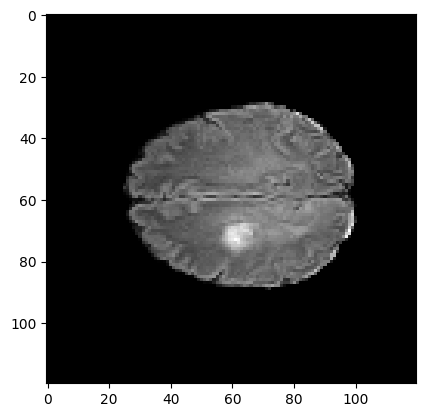

torch.Size([1, 1, 120, 120])


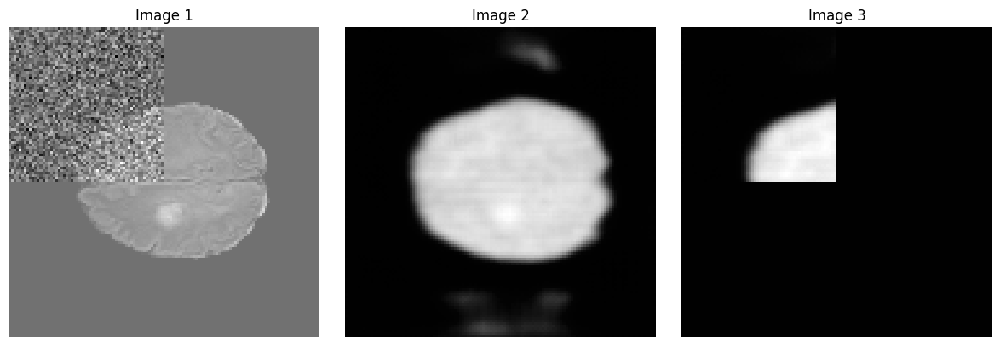

next


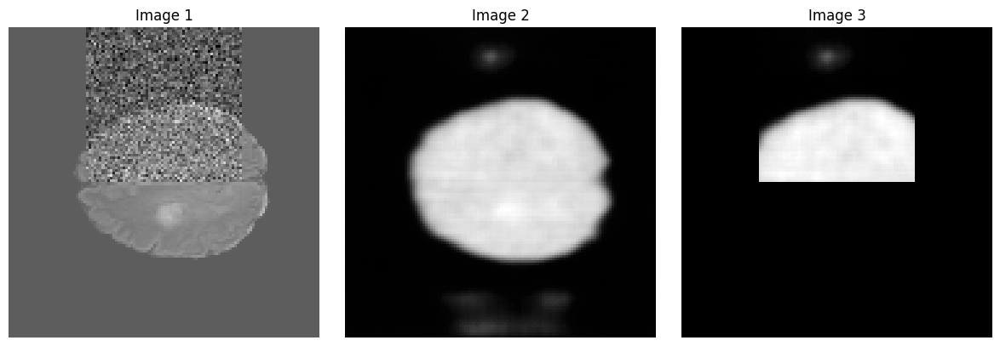

next


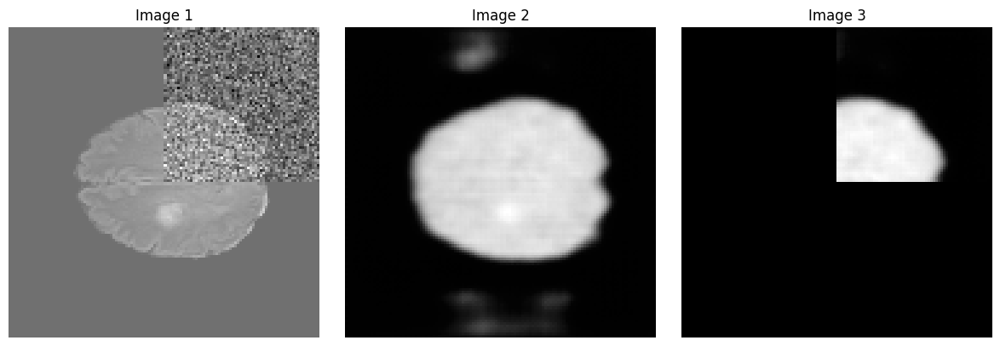

next


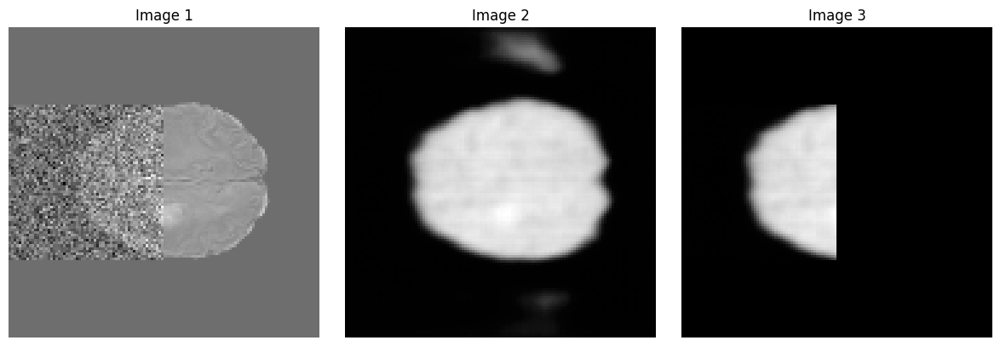

next


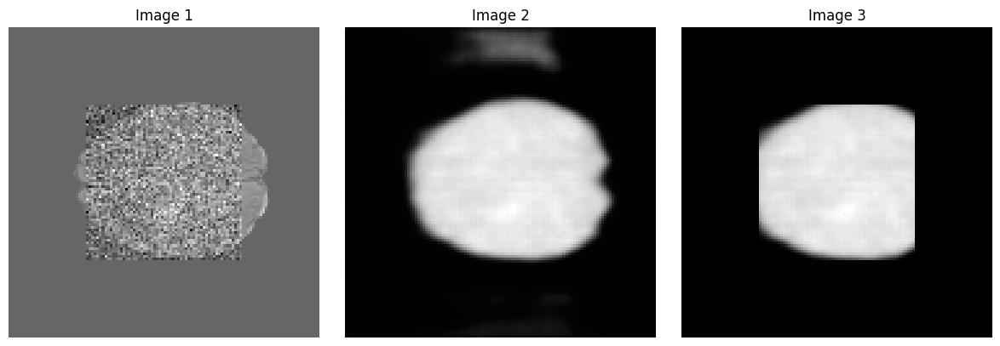

next


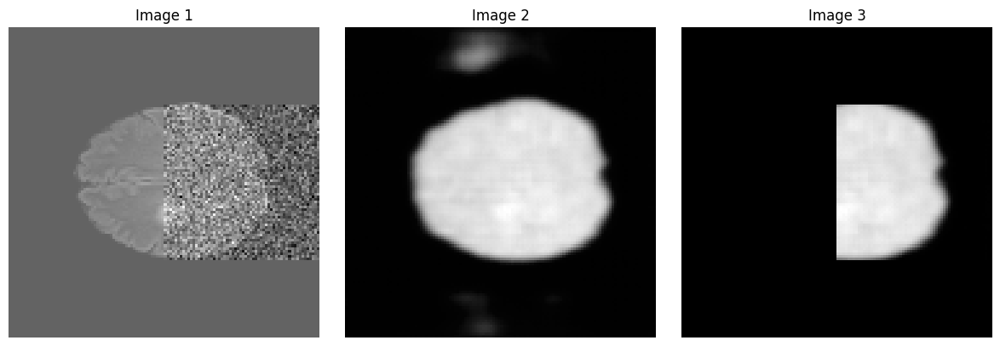

next


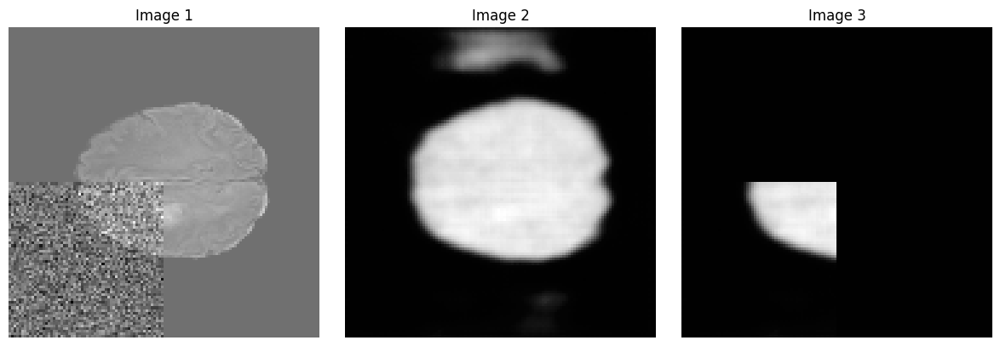

next


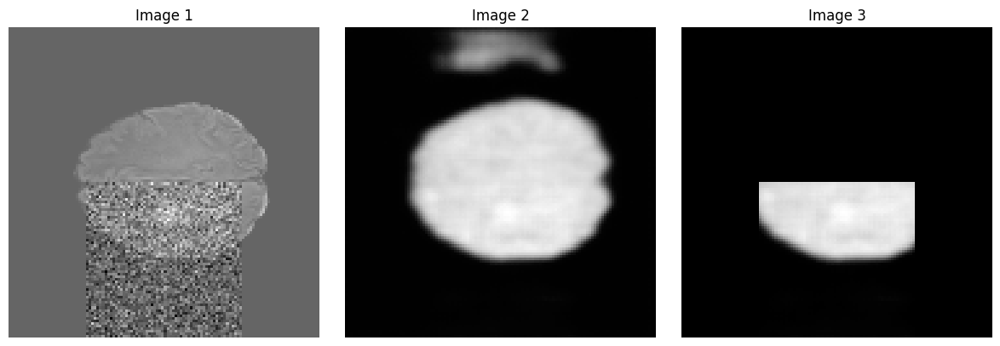

next


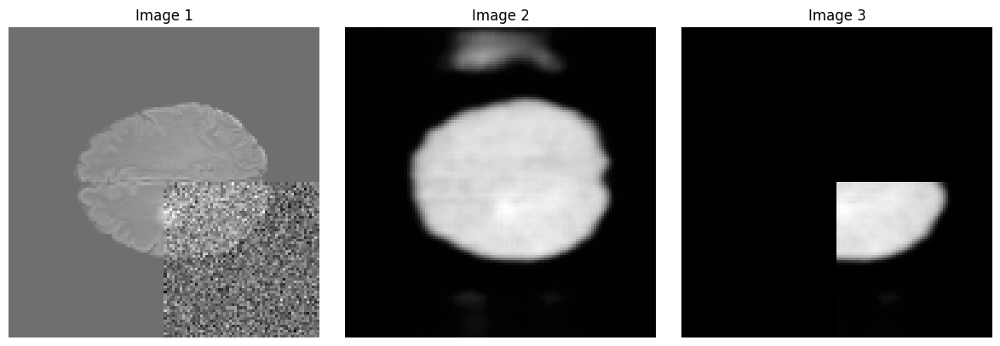

next


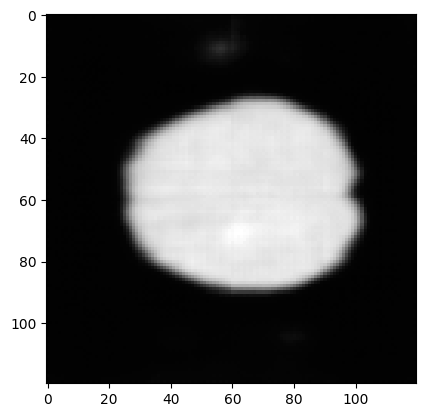

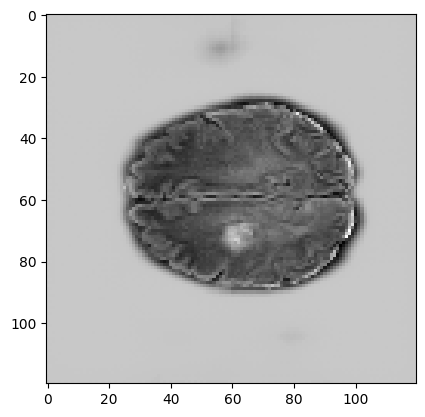

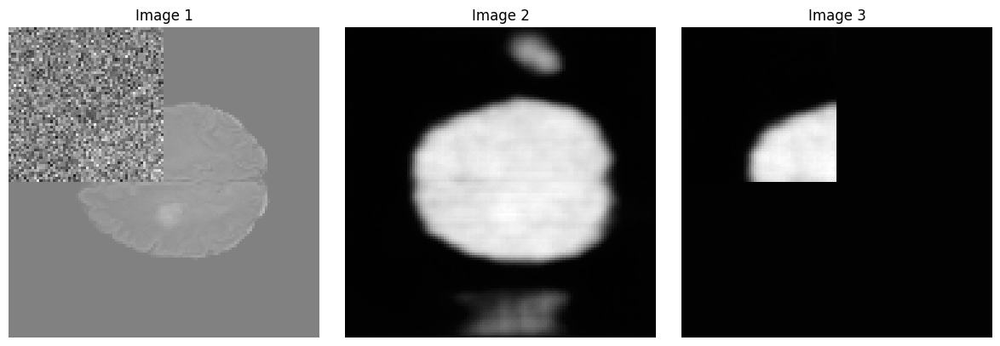

next


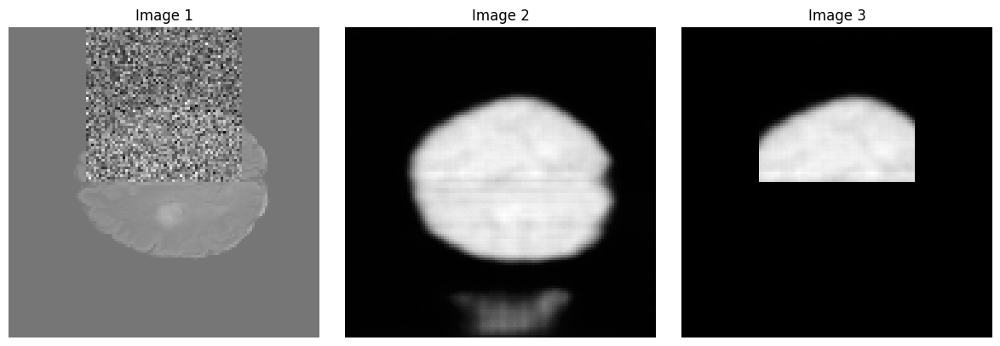

next


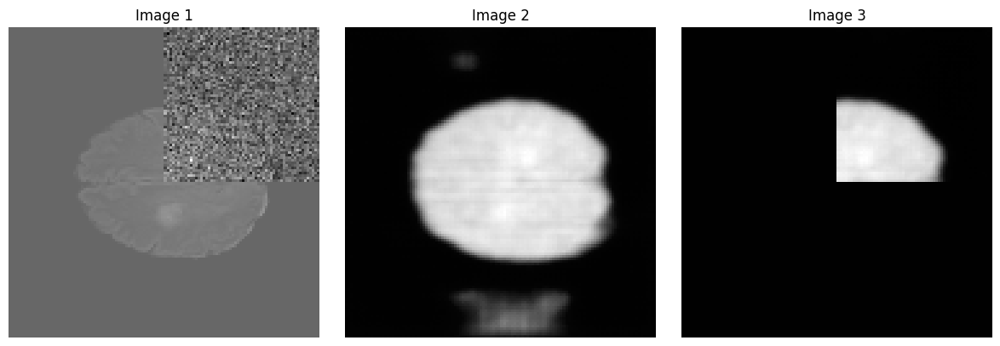

next


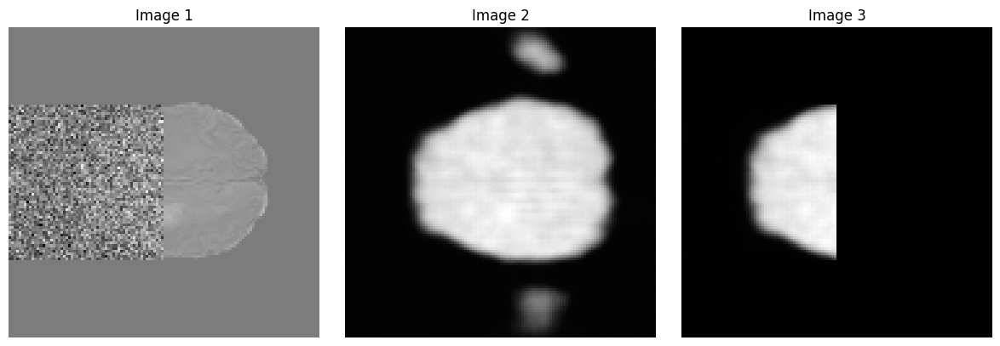

next


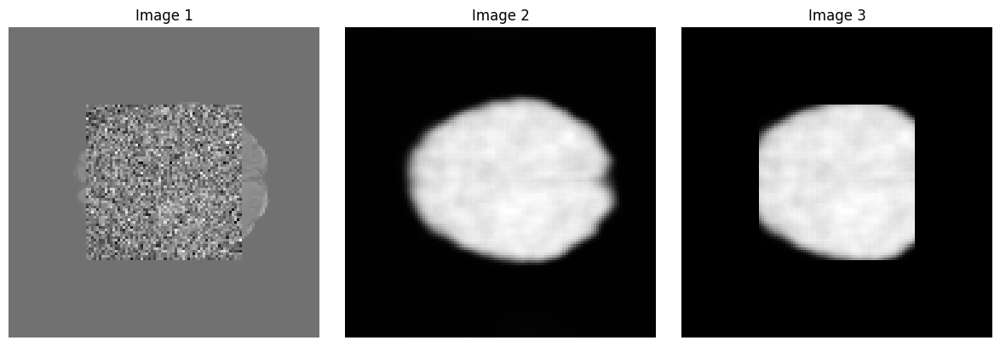

next


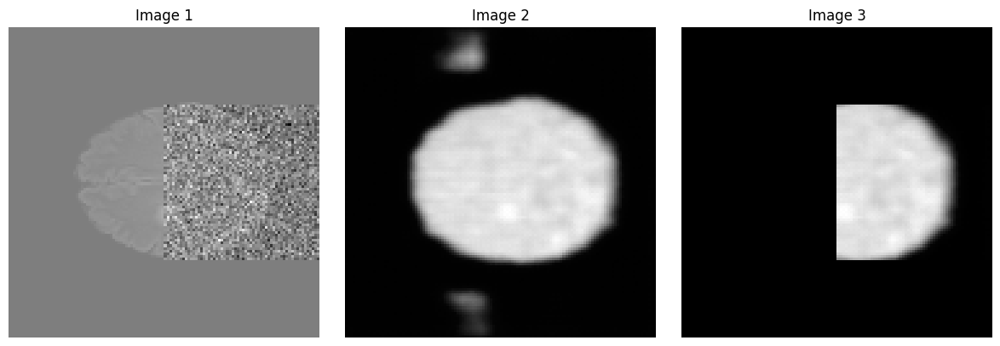

next


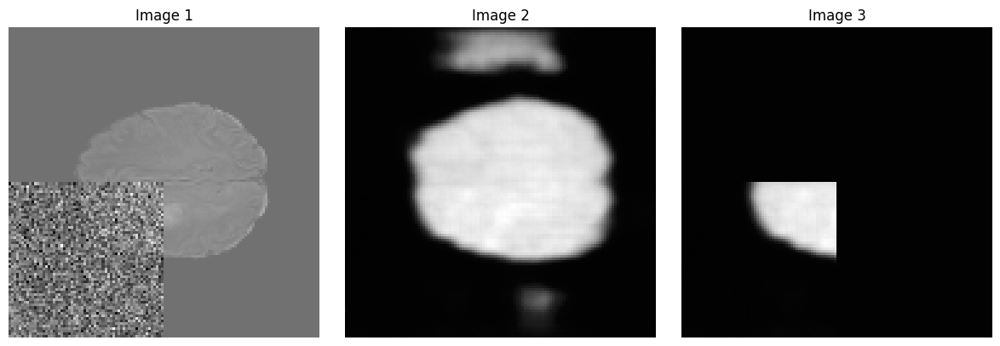

next


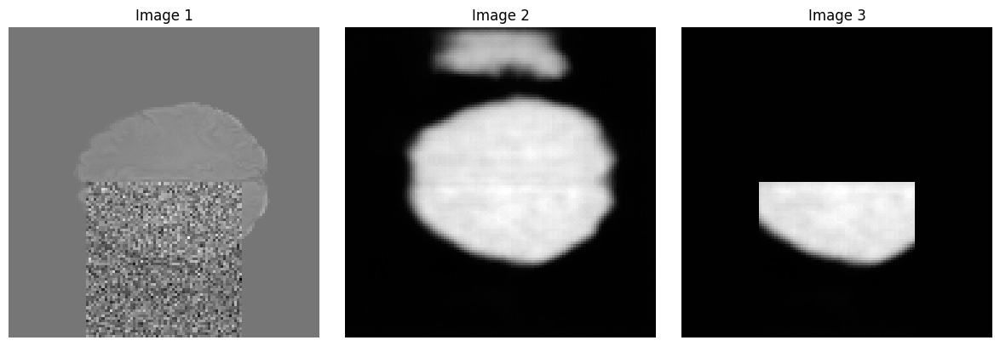

next


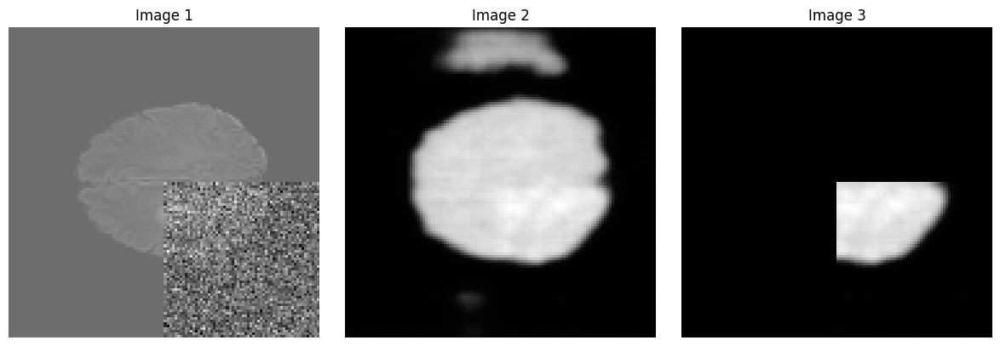

next


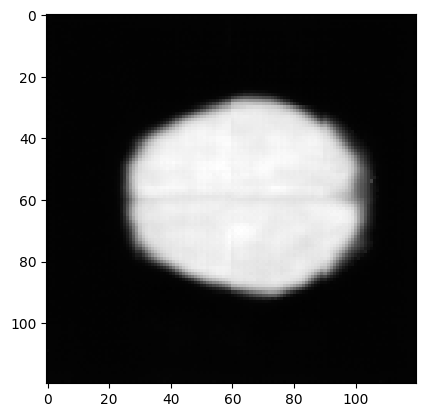

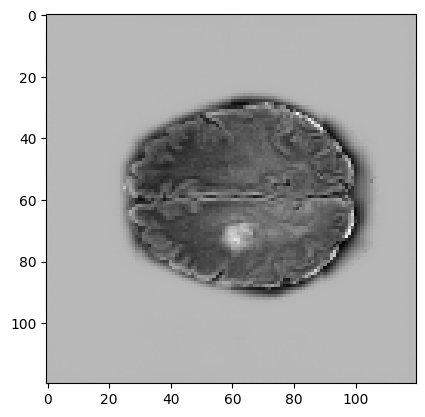

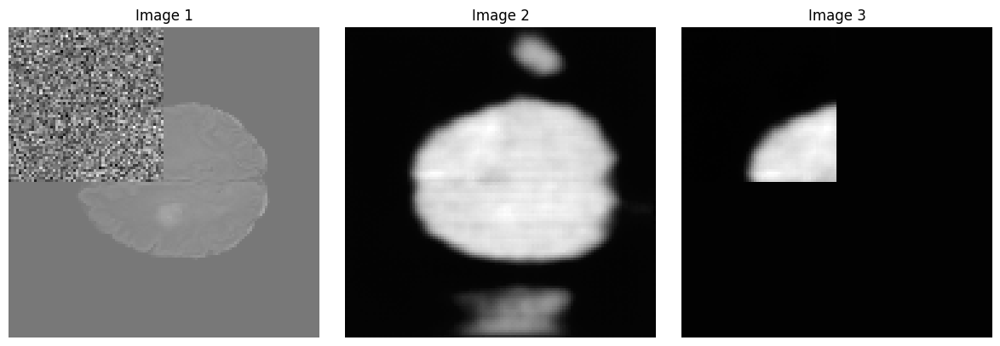

next


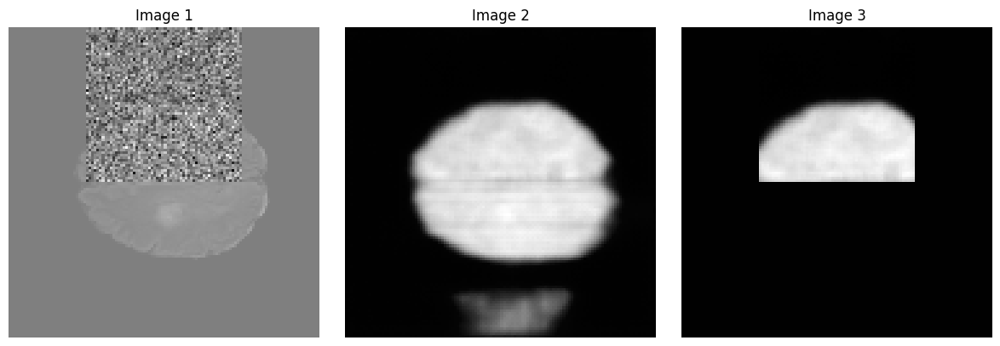

next


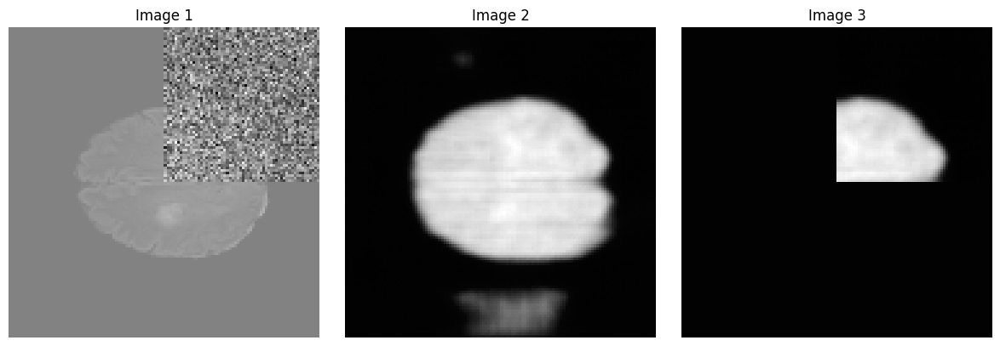

next


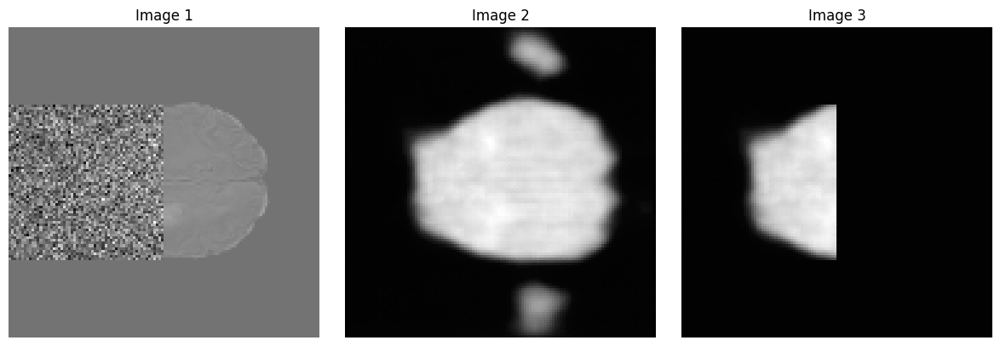

next


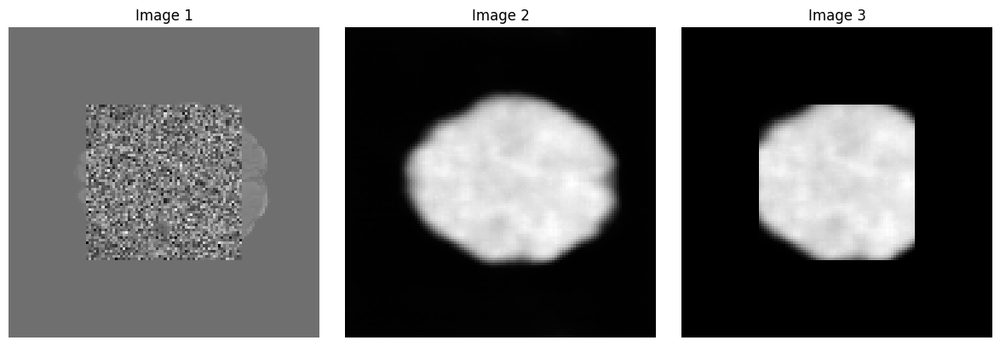

next


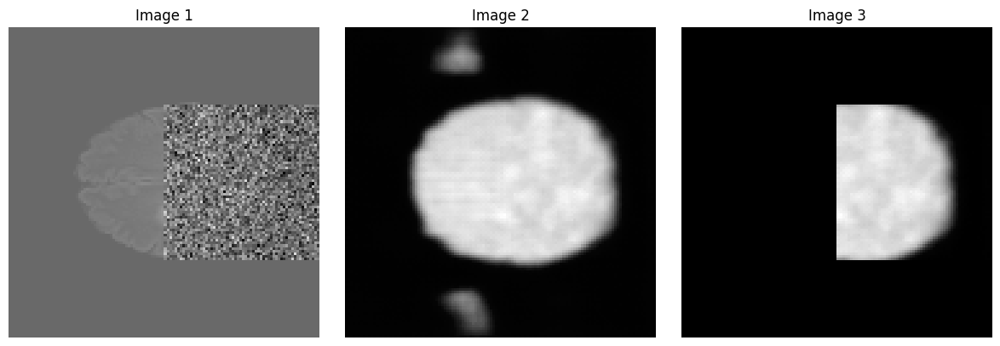

next


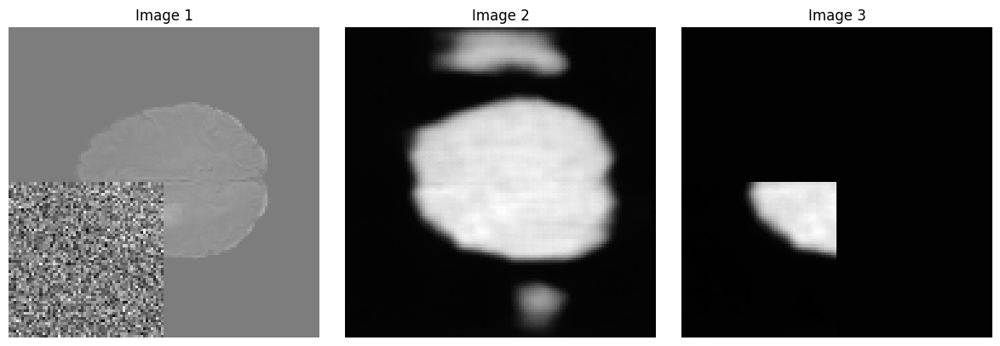

next


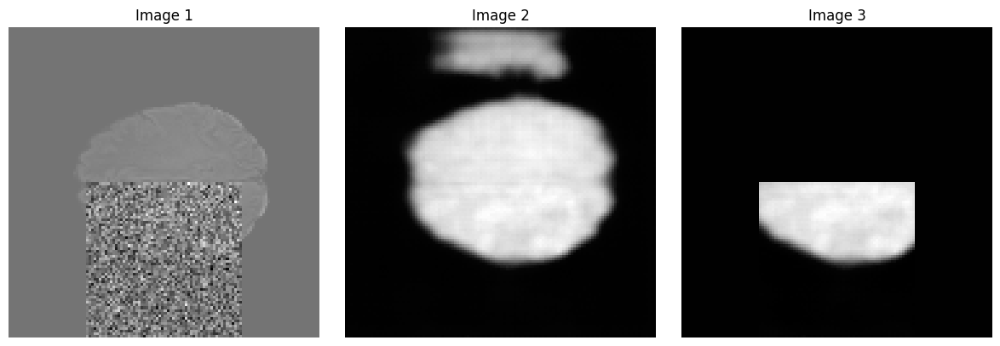

next


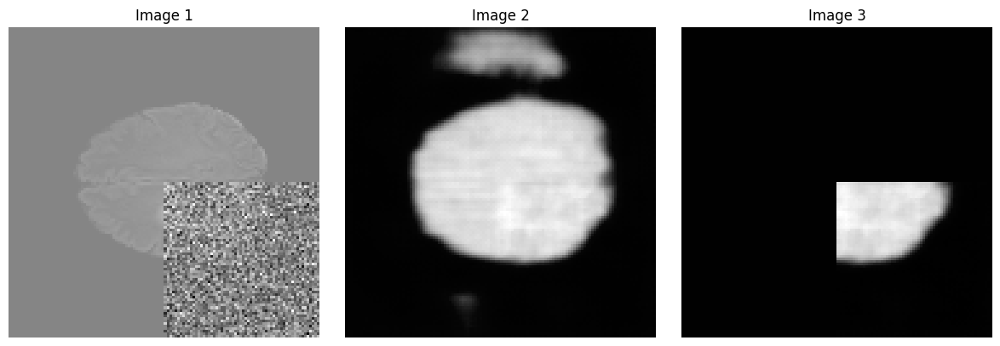

next


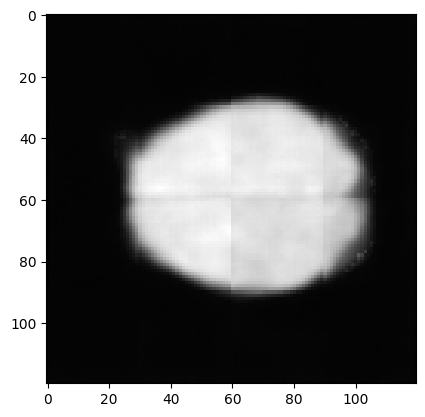

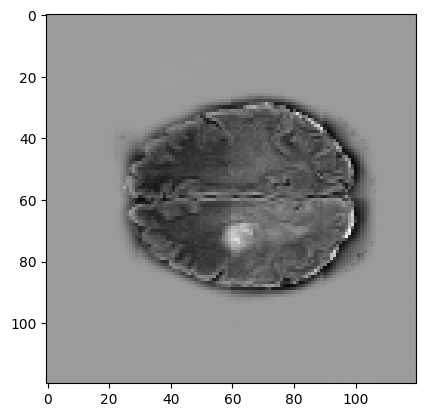

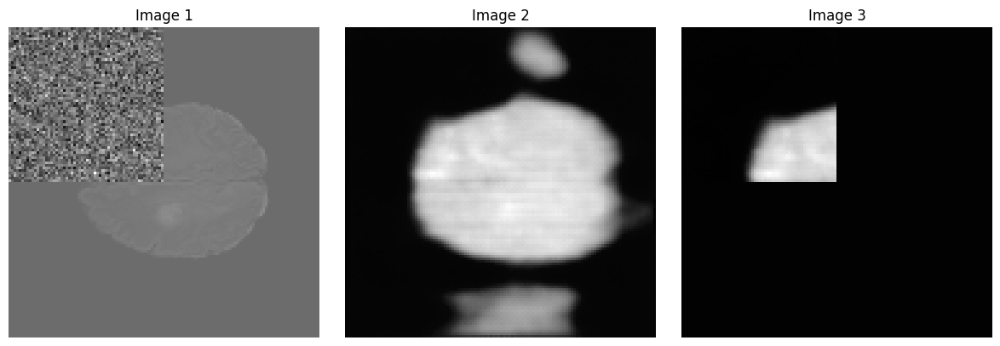

next


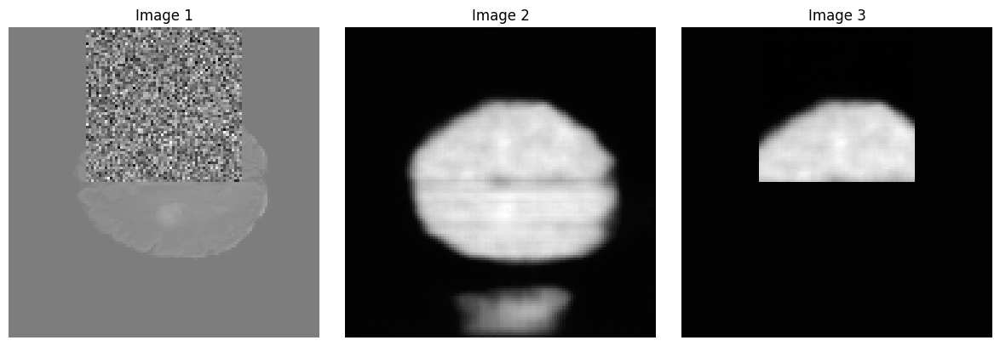

next


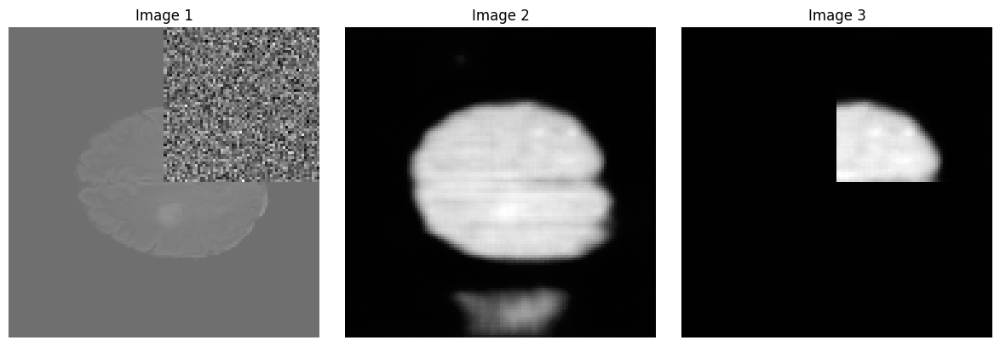

next


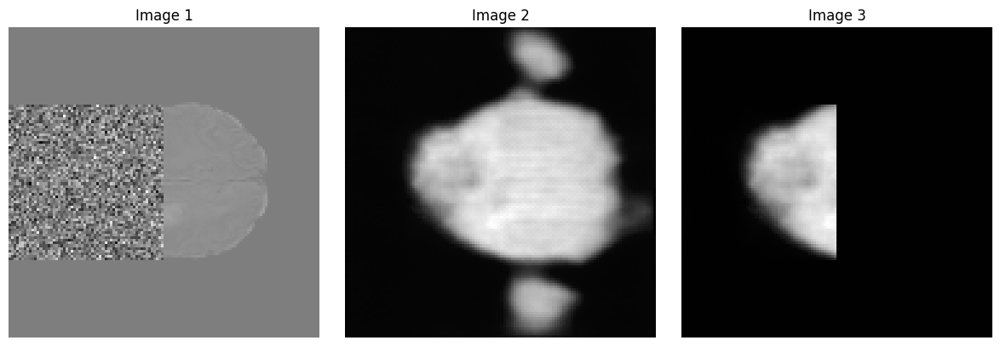

next


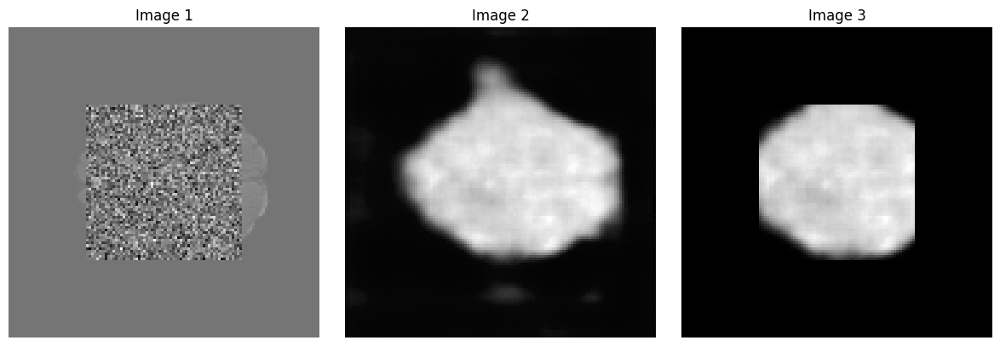

next


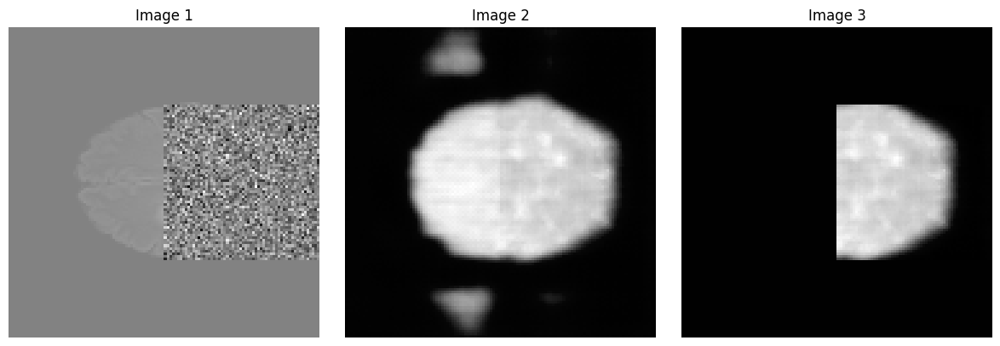

next


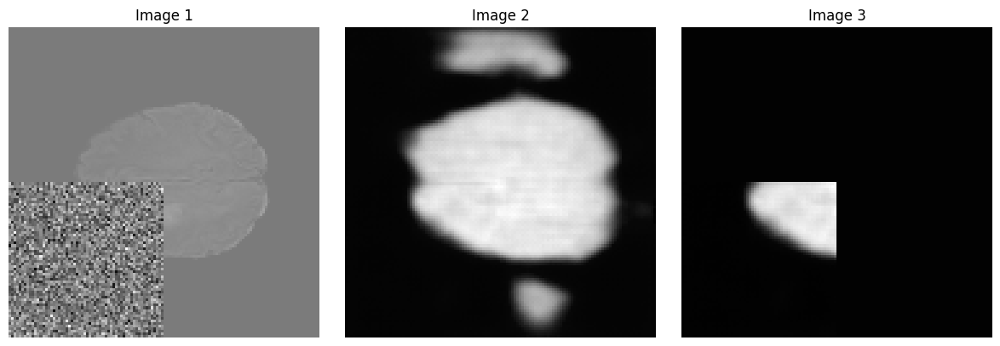

next


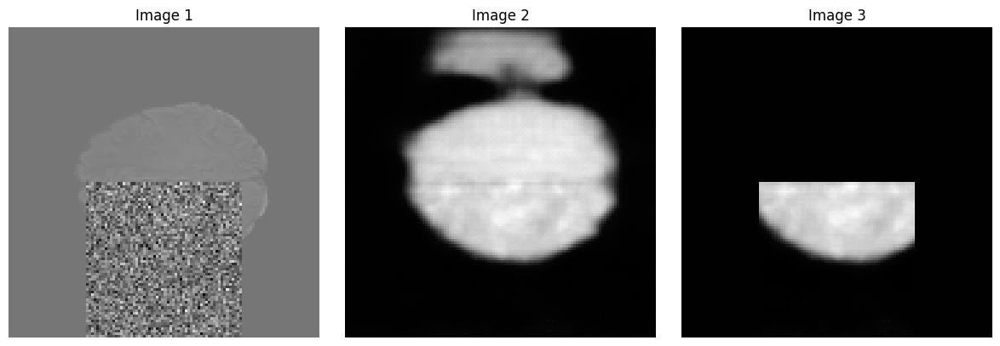

next


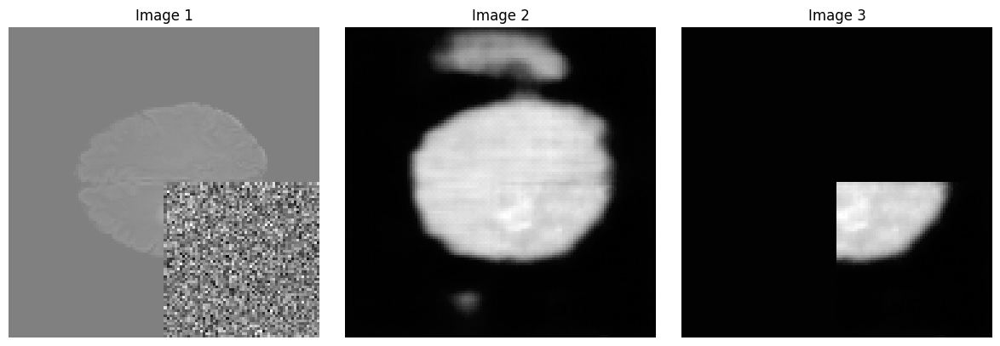

next


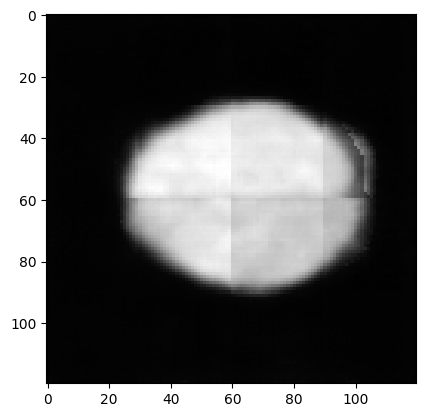

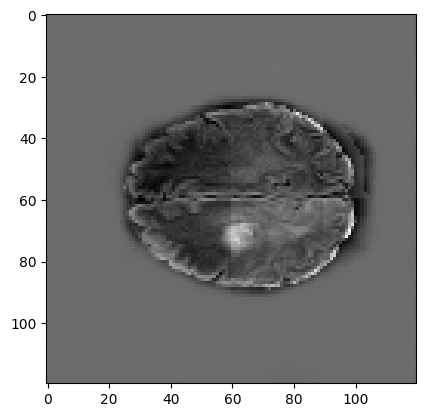

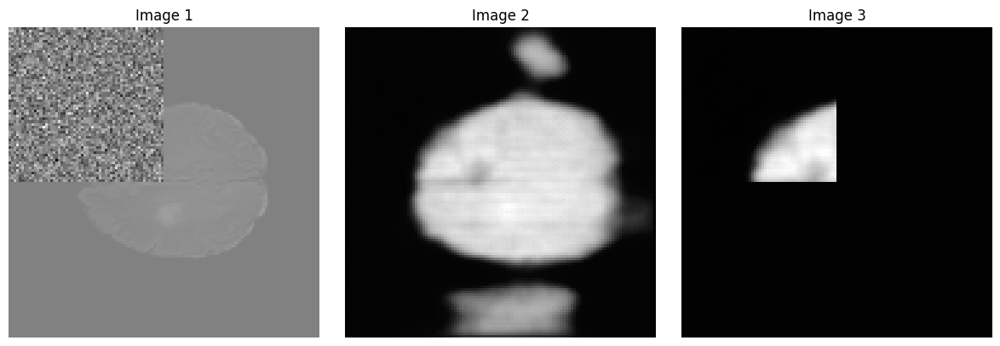

next


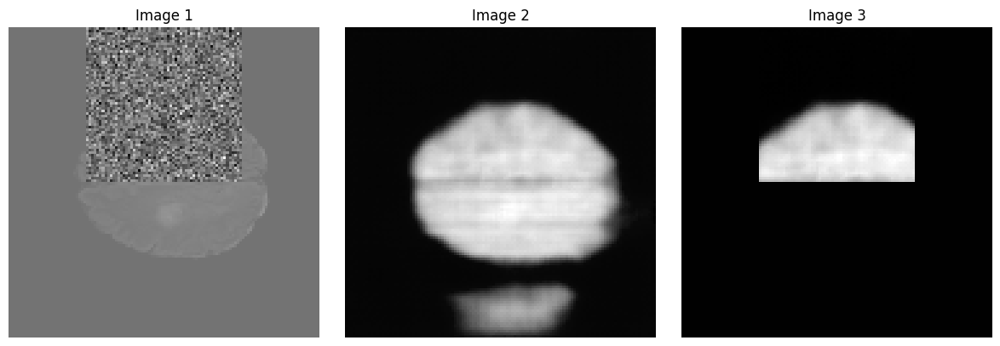

next


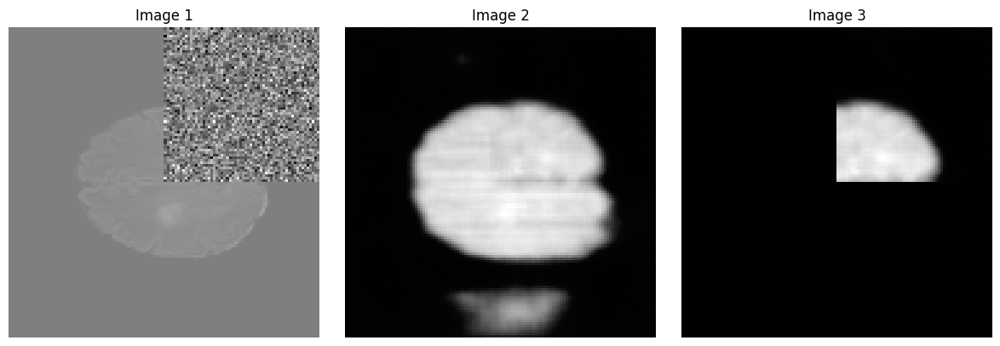

next


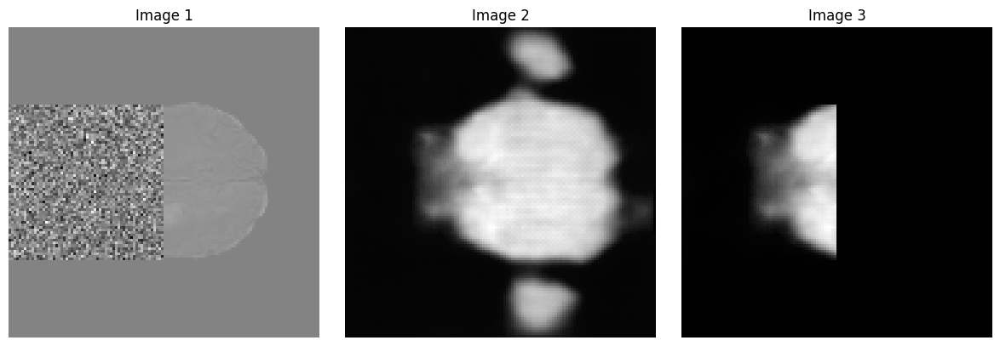

next


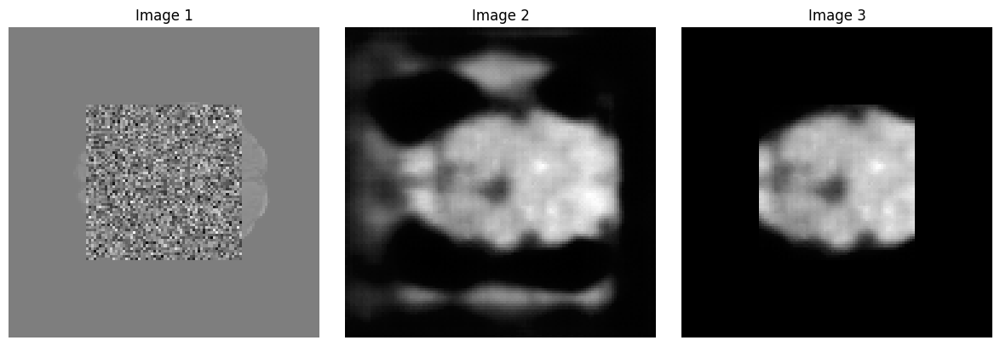

next


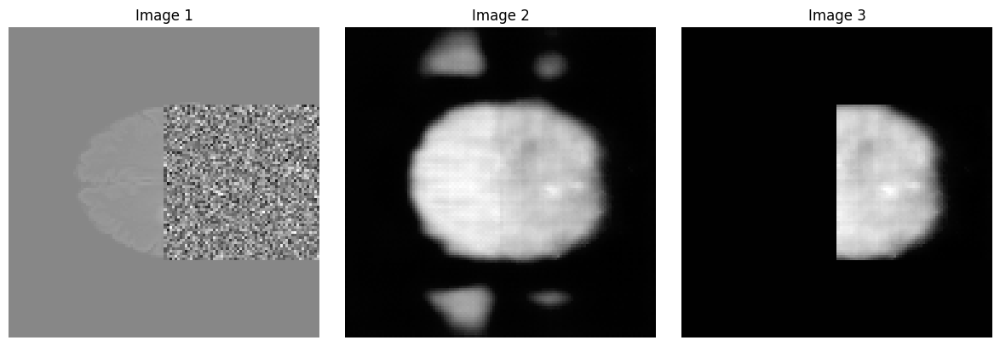

next


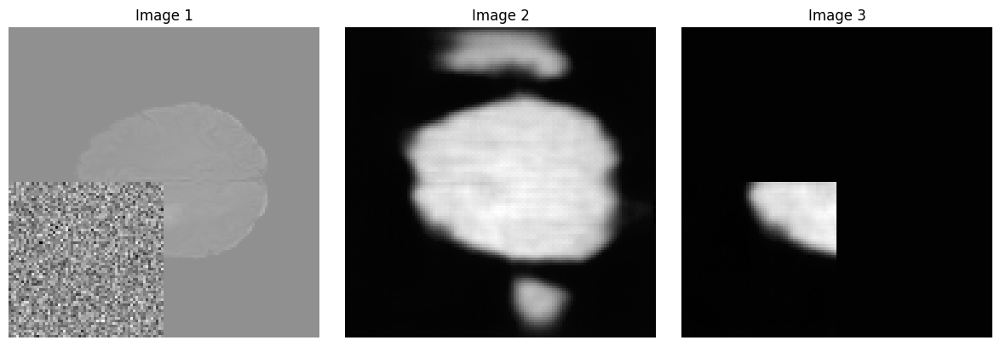

next


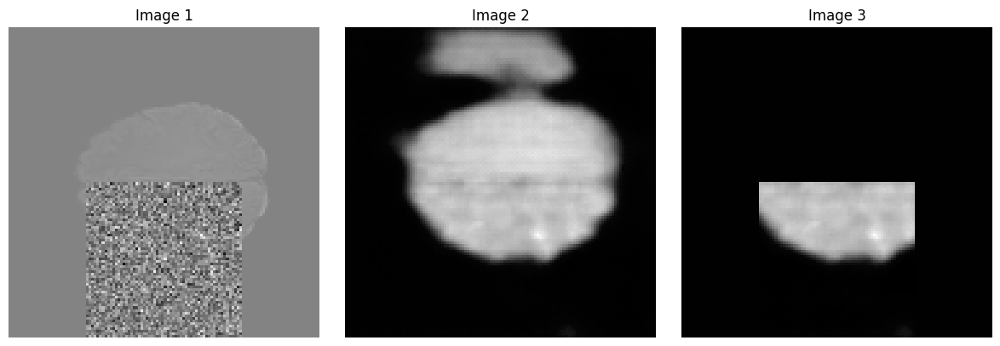

next


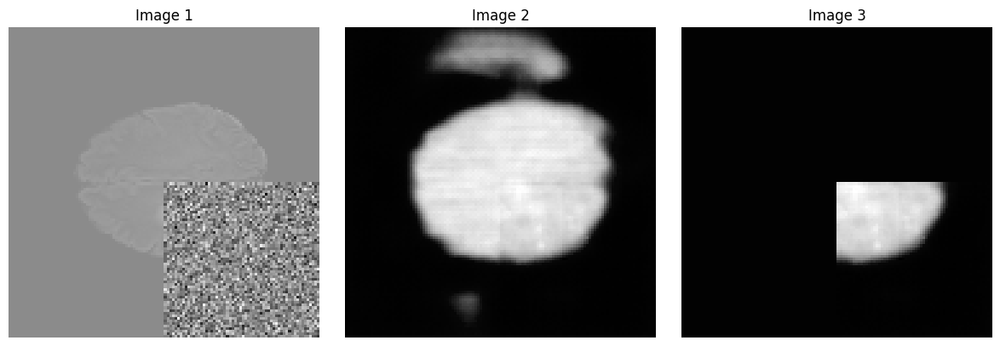

next


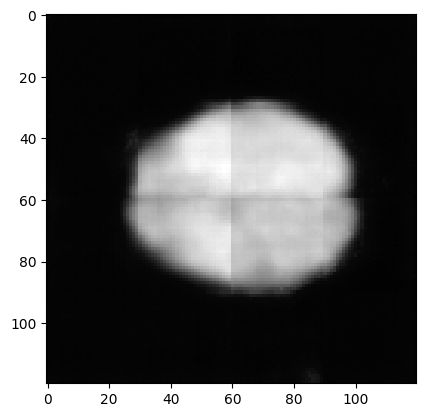

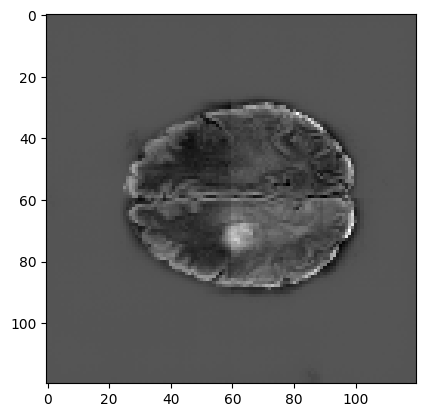

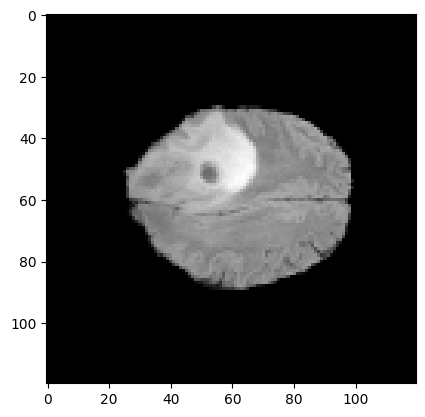

torch.Size([1, 1, 120, 120])


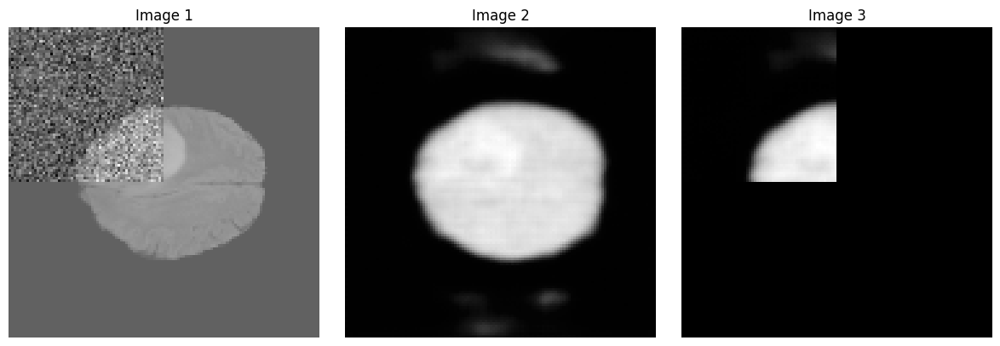

next


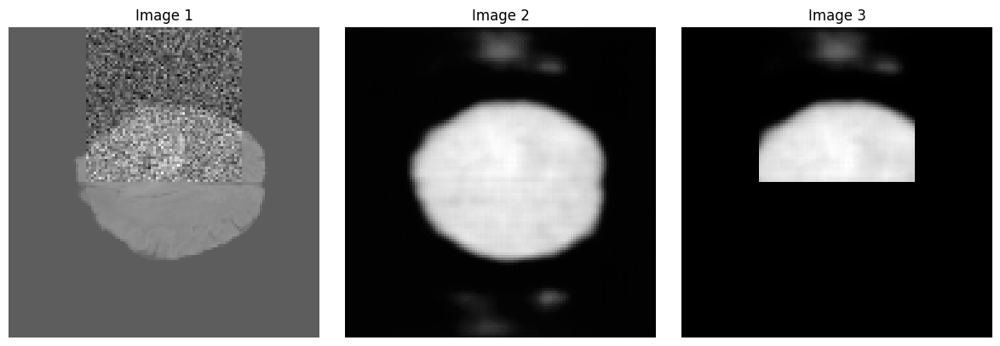

next


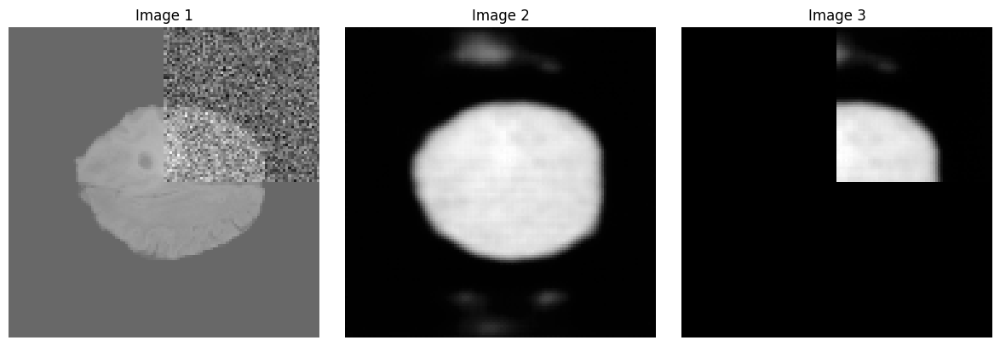

next


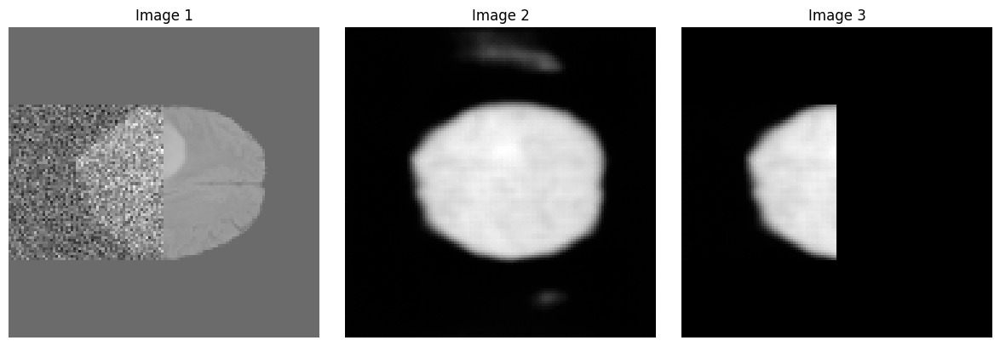

next


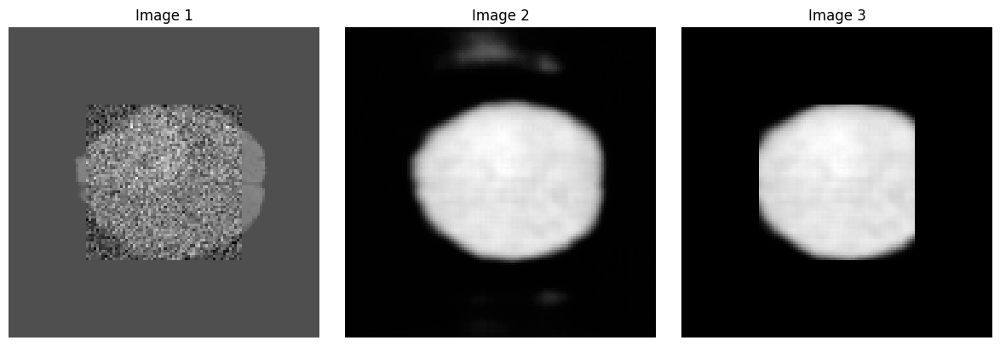

next


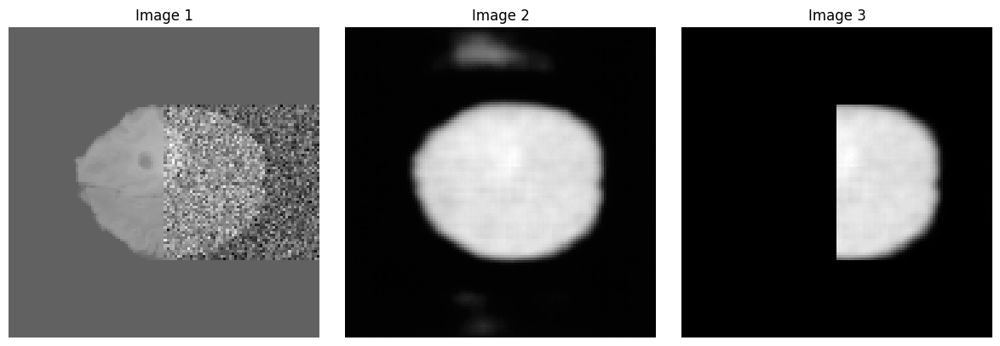

next


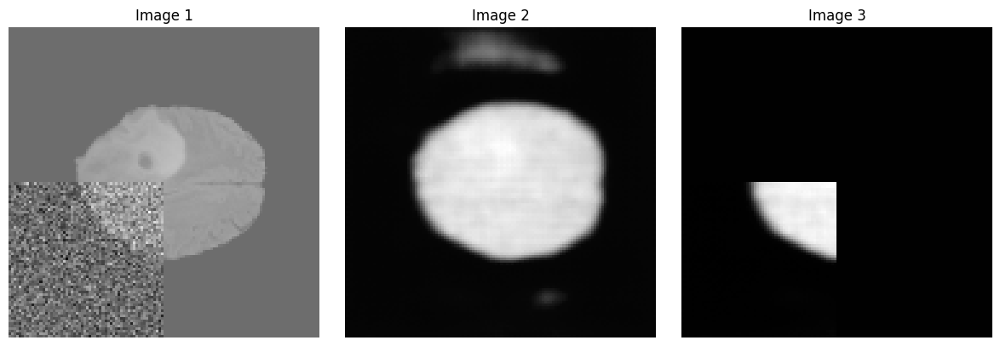

next


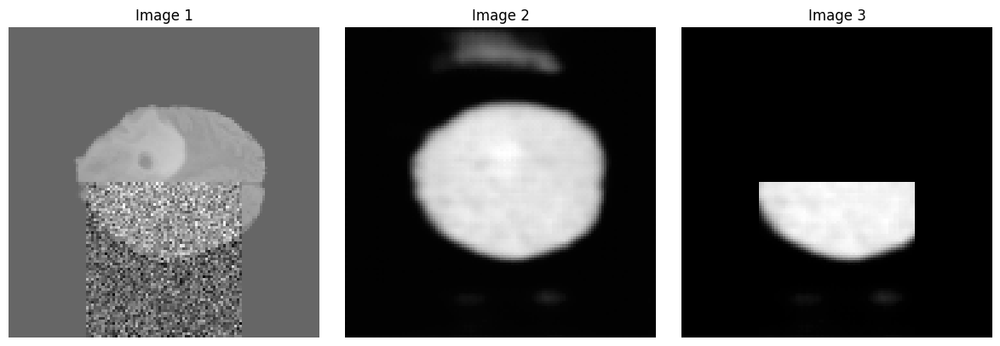

next


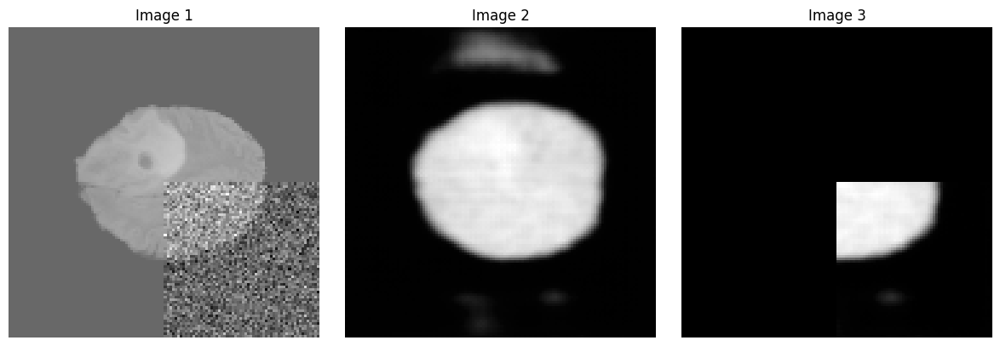

next


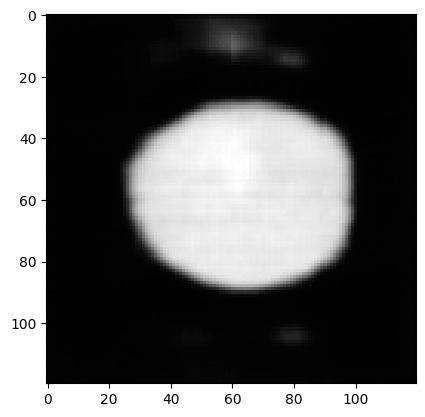

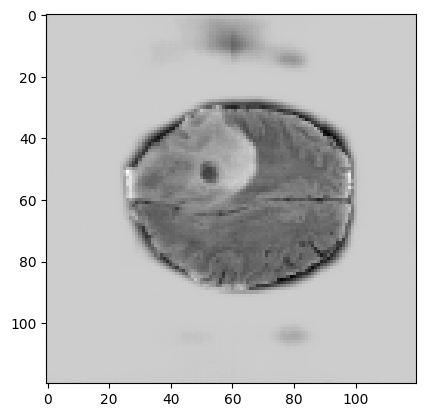

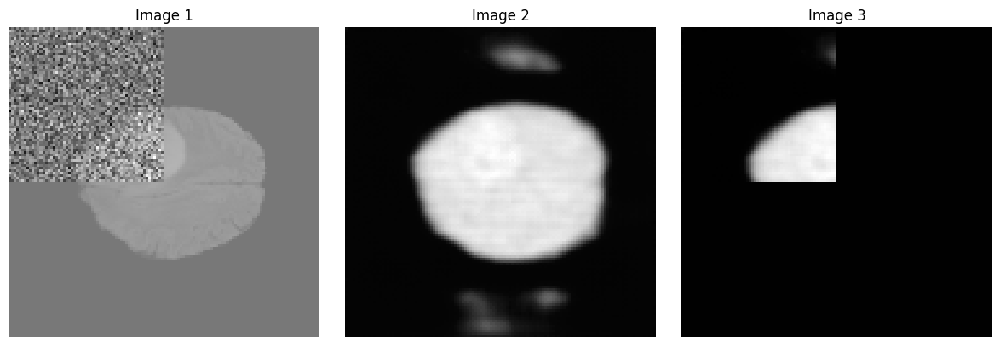

next


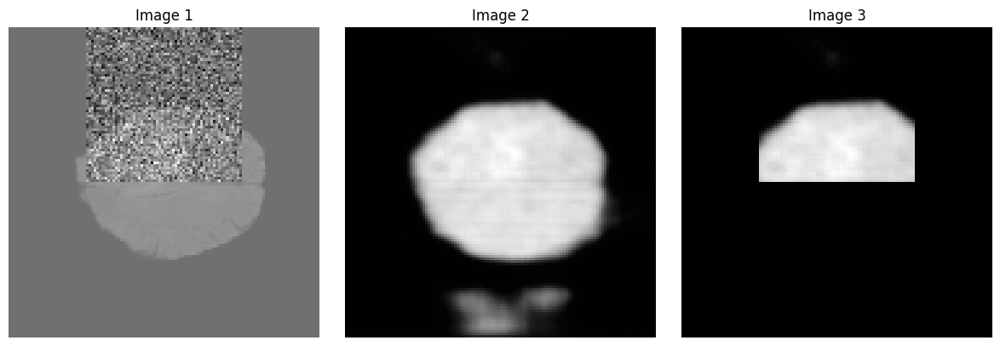

next


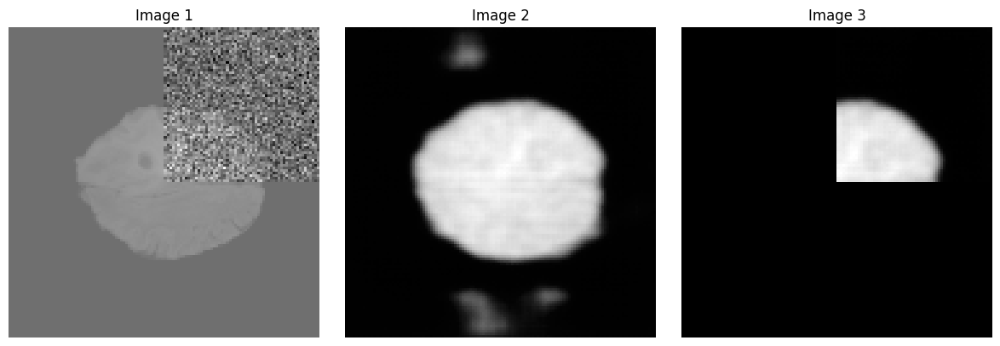

next


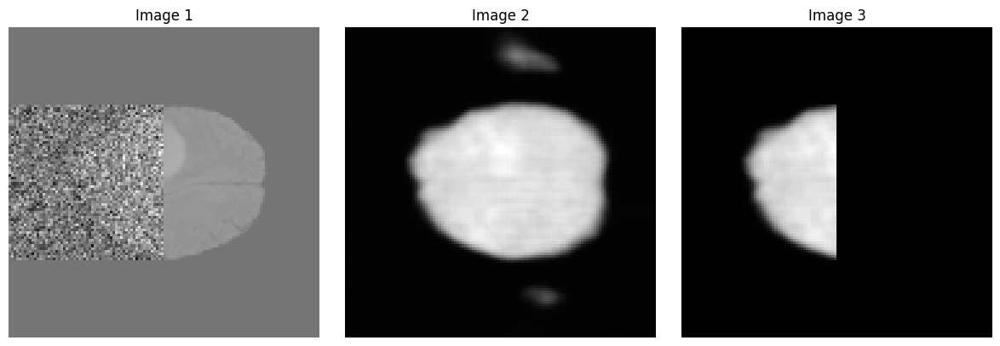

next


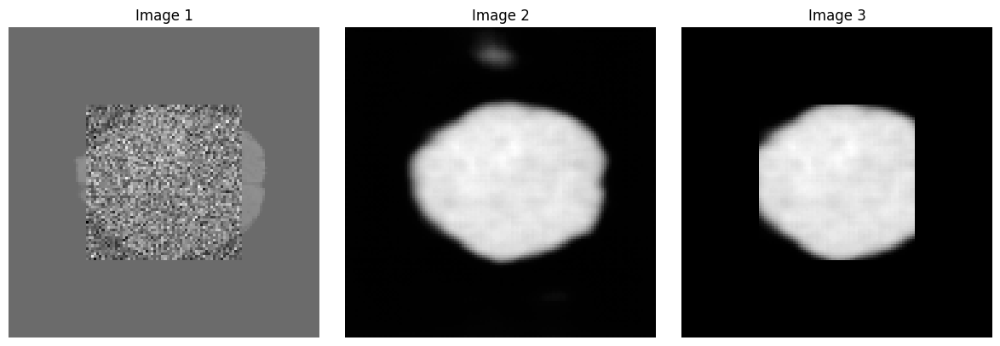

next


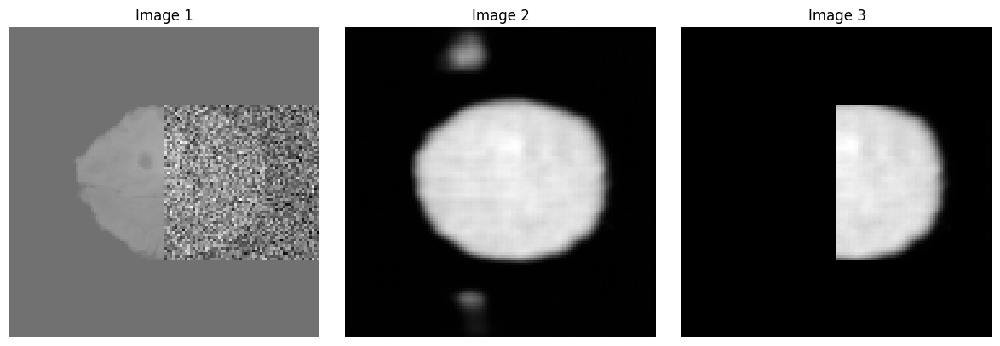

next


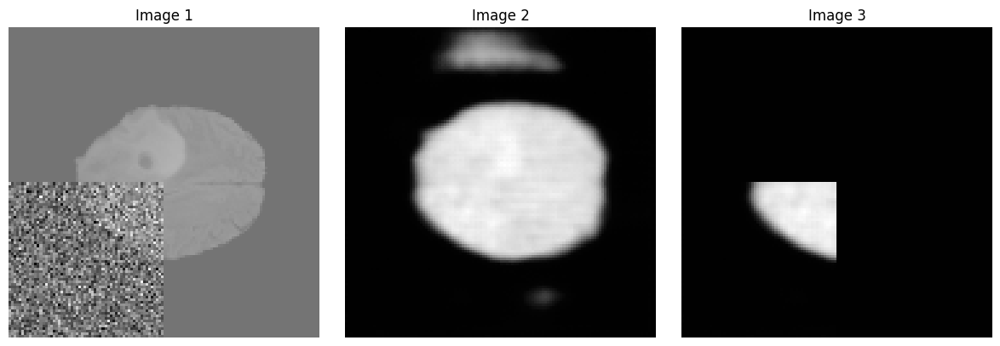

next


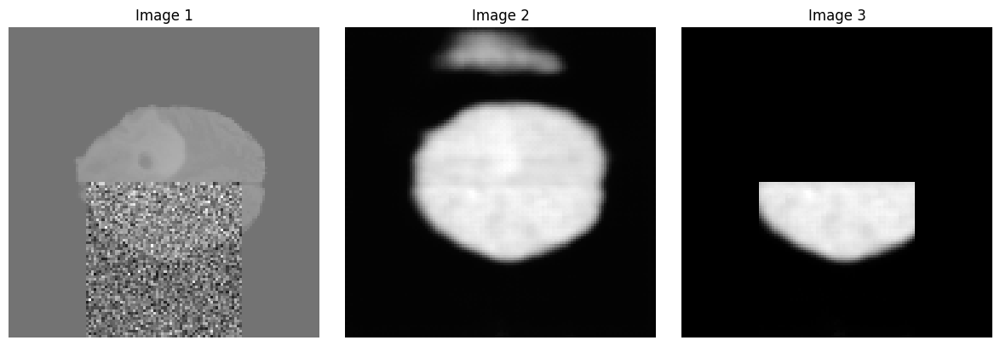

next


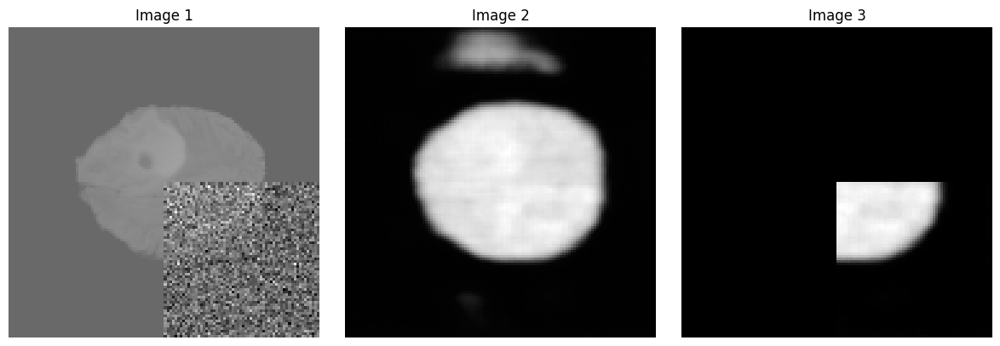

next


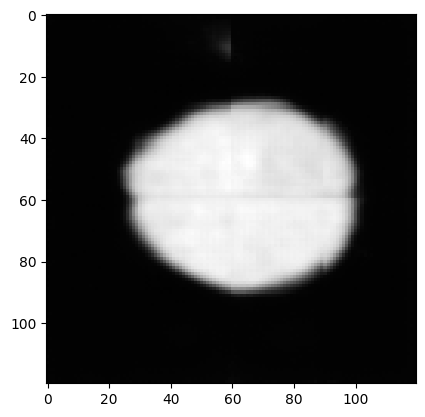

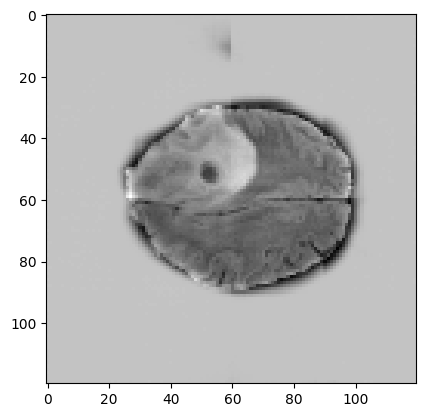

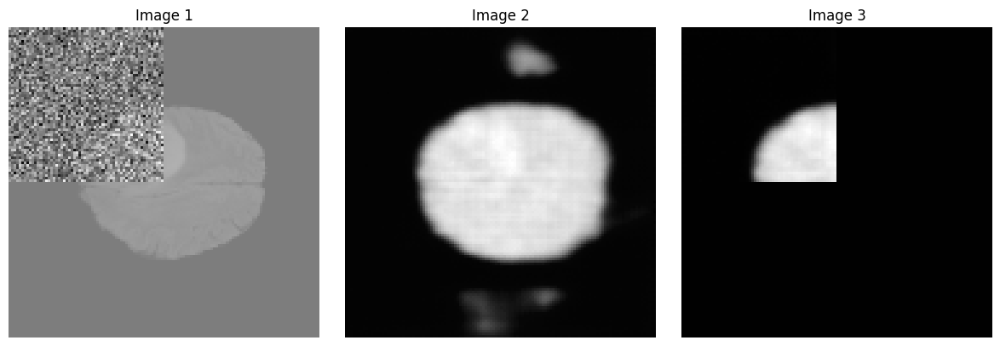

next


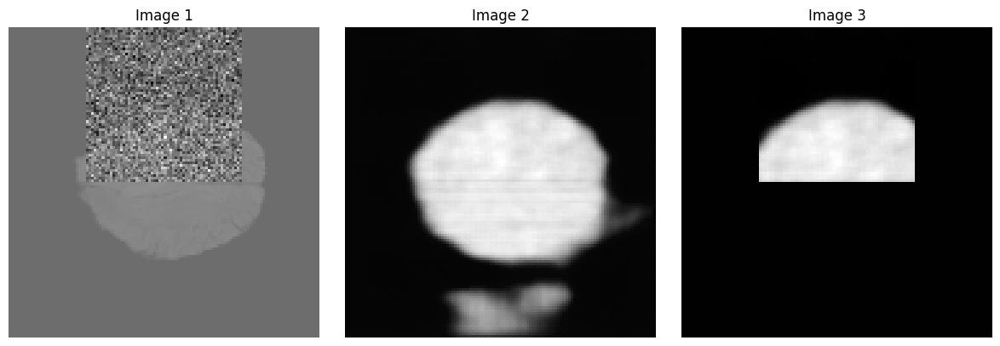

next


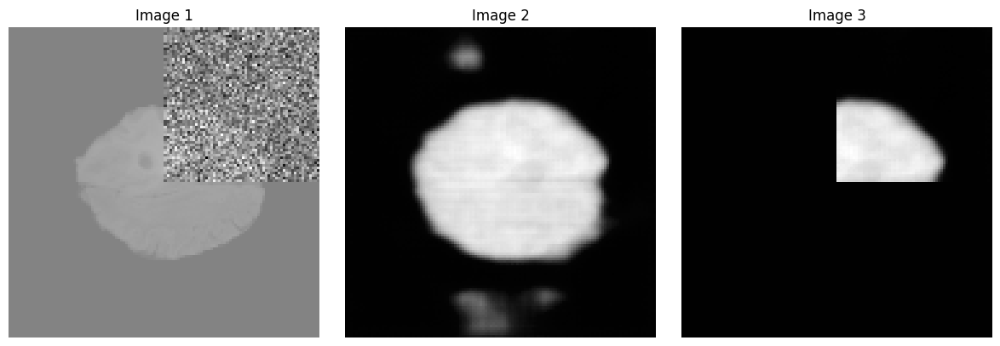

next


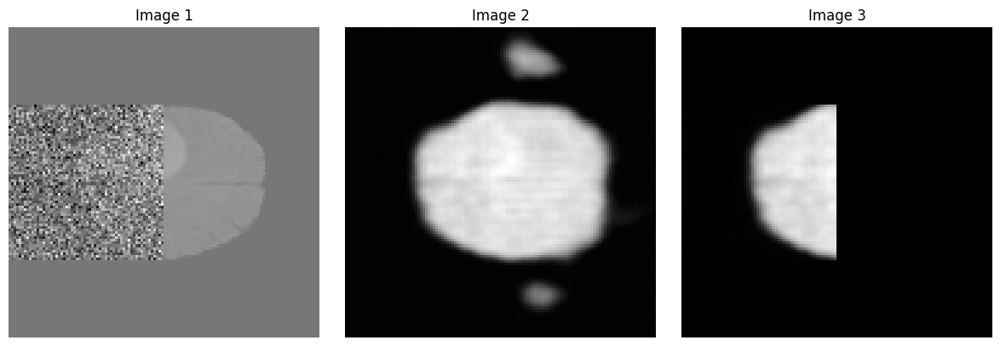

next


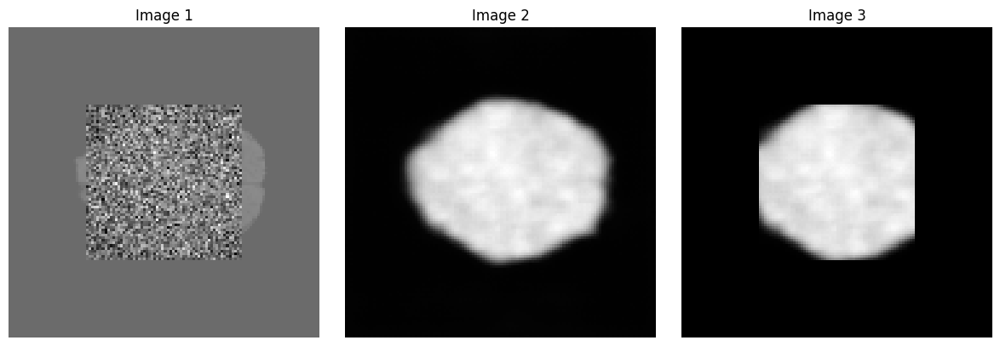

next


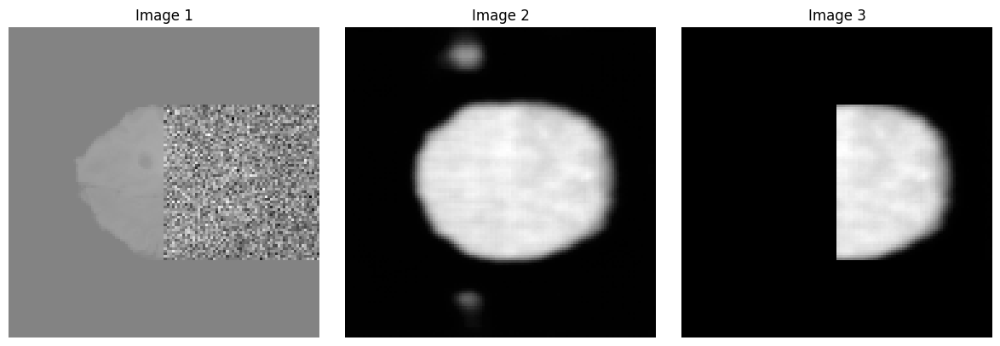

next


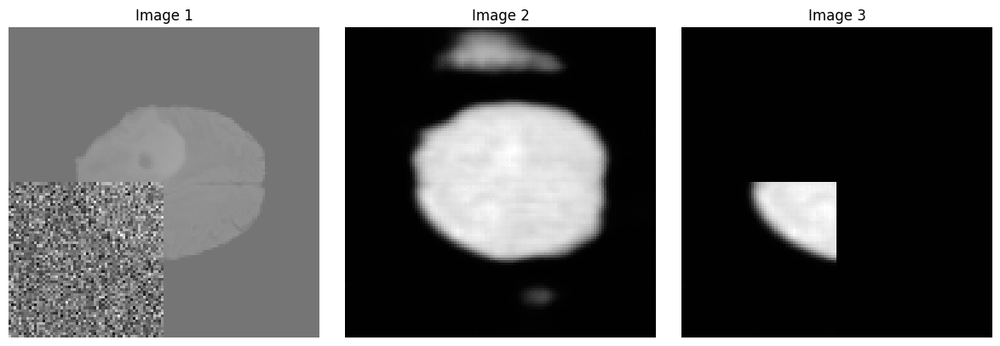

next


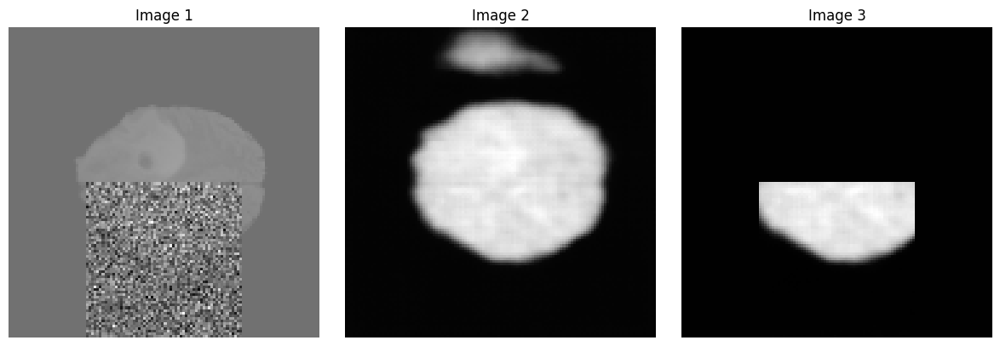

next


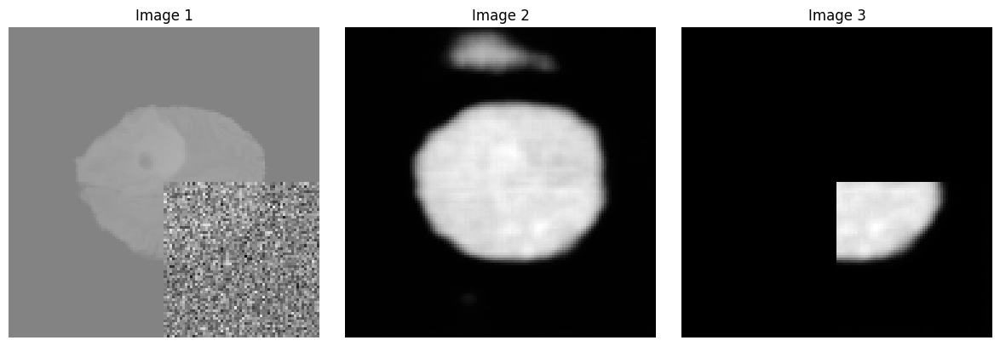

next


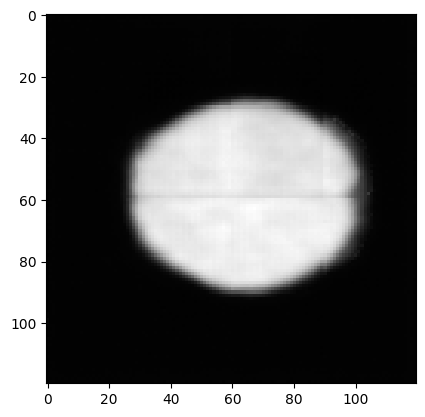

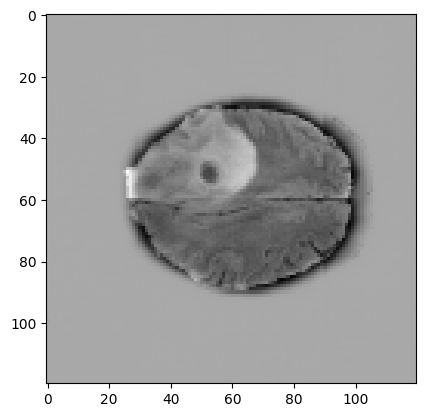

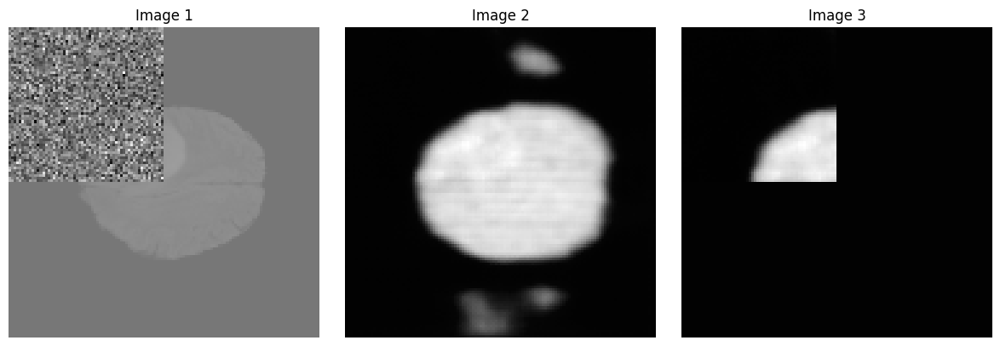

next


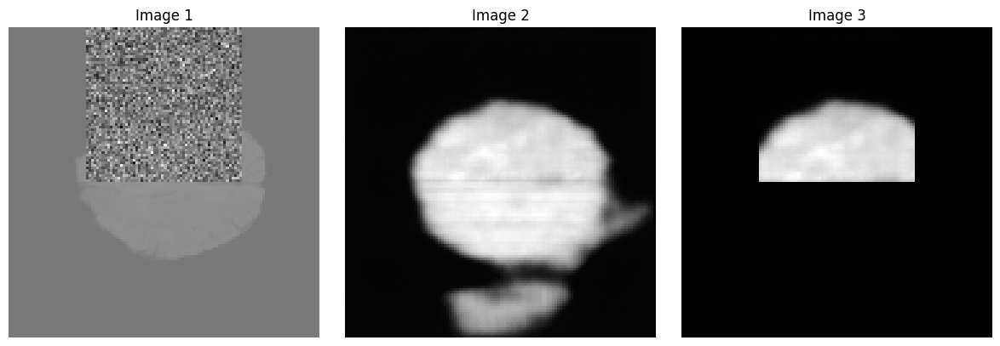

next


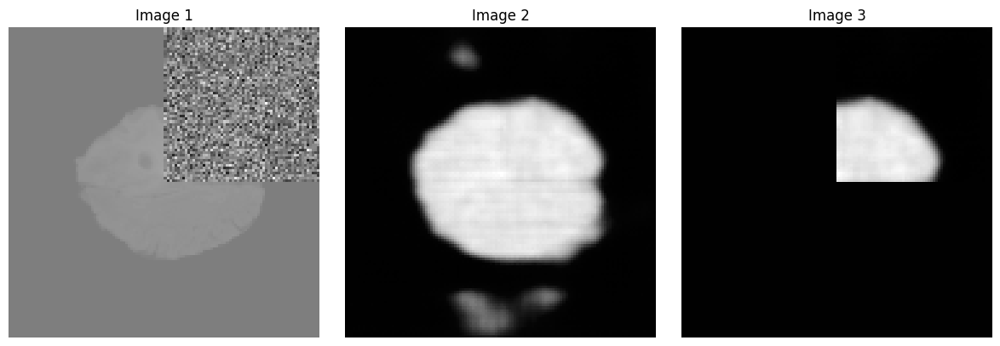

next


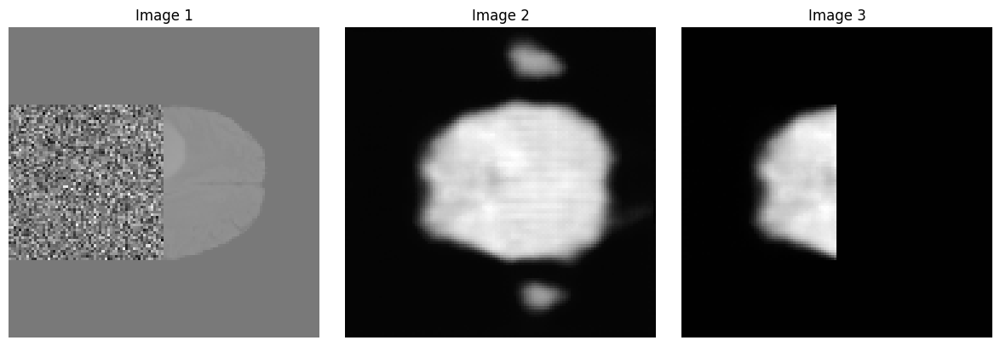

next


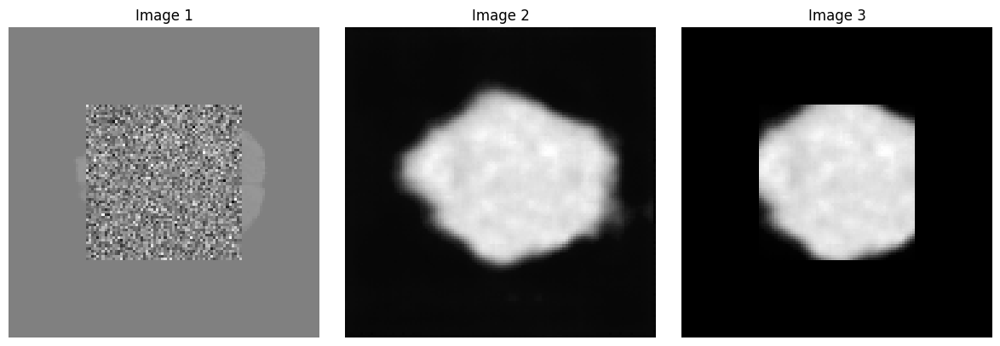

next


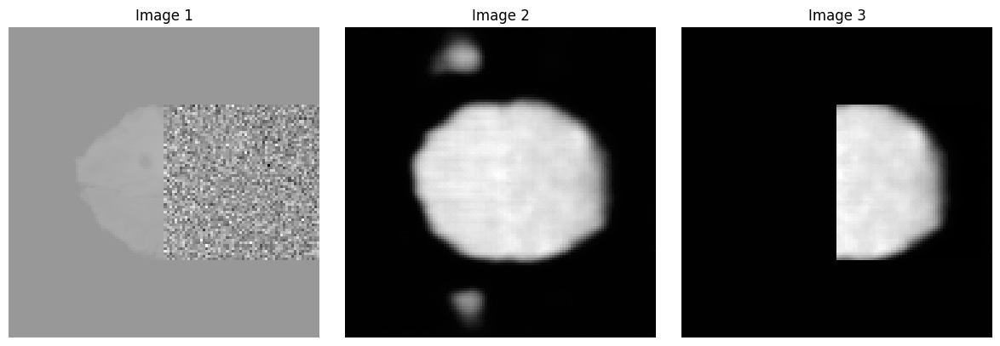

next


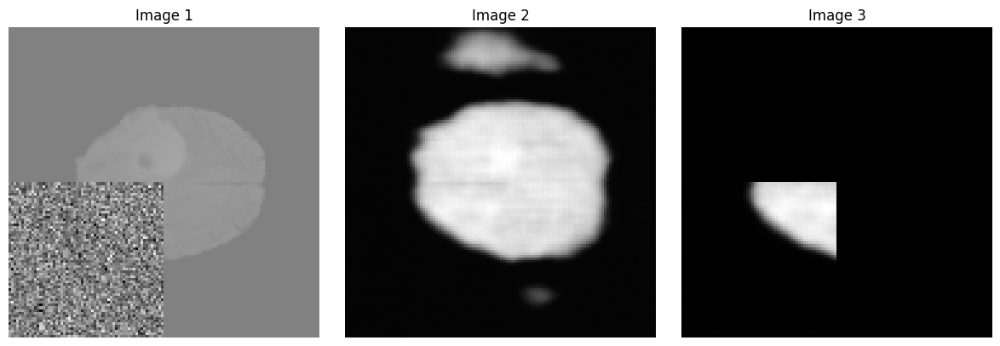

next


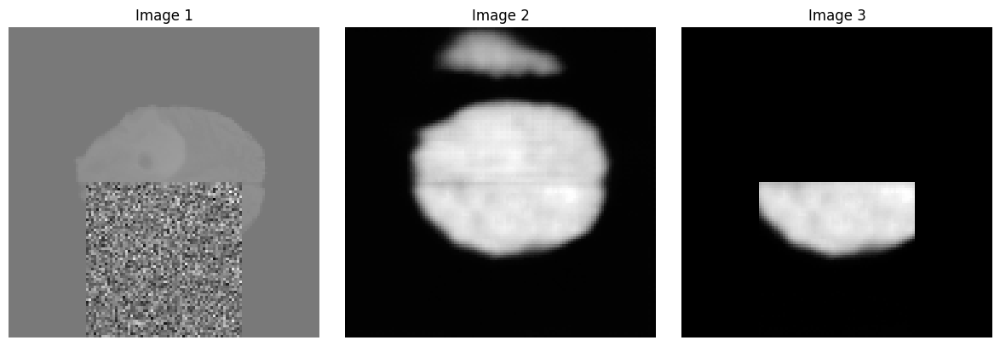

next


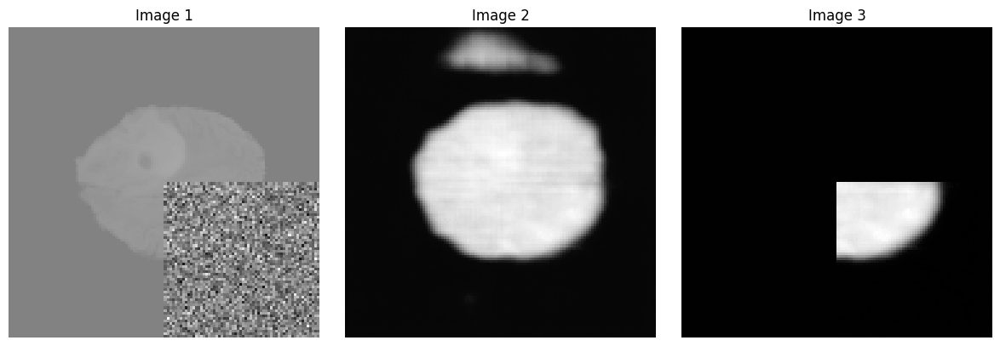

next


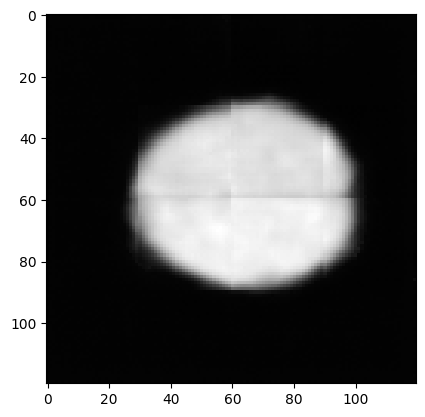

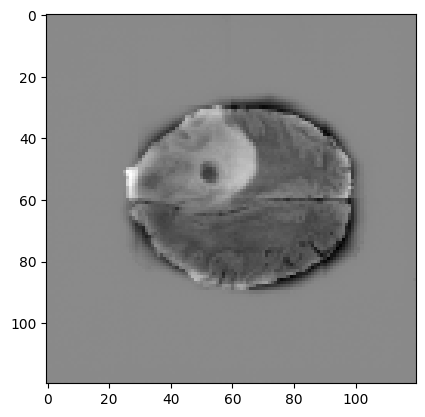

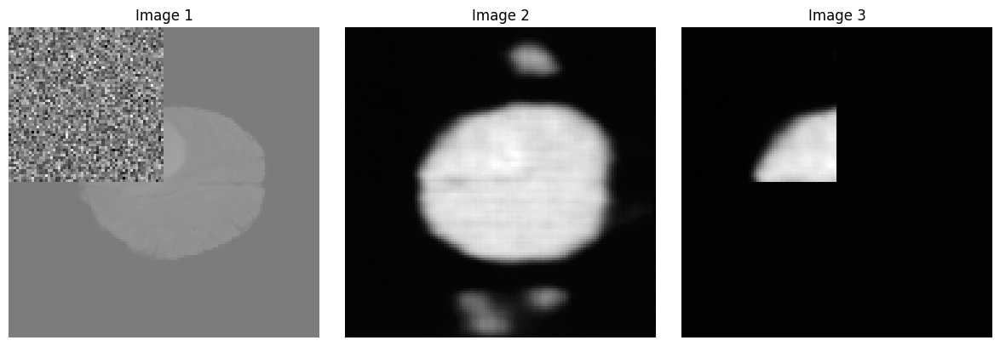

next


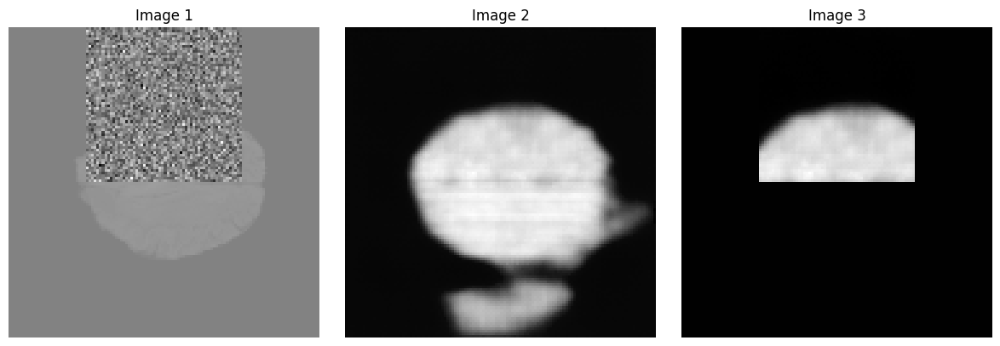

next


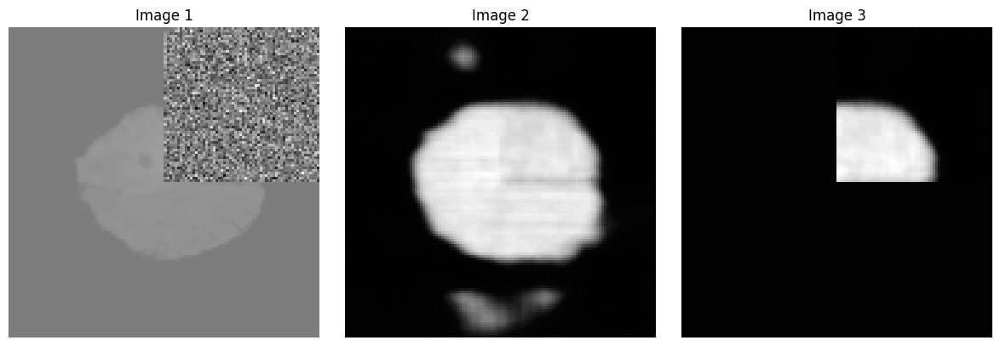

next


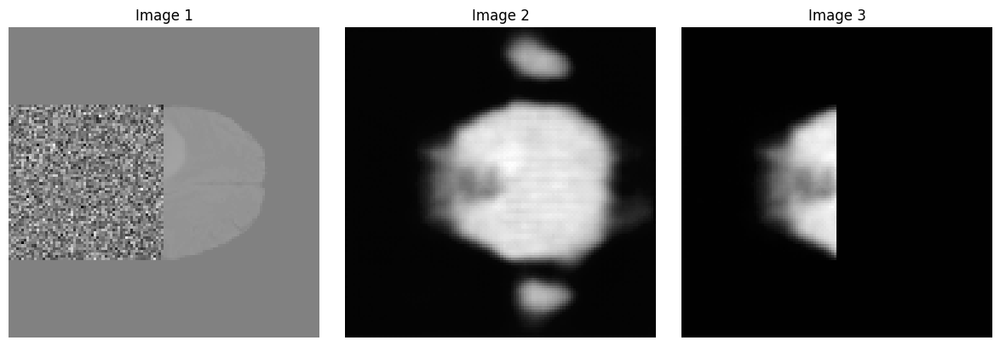

next


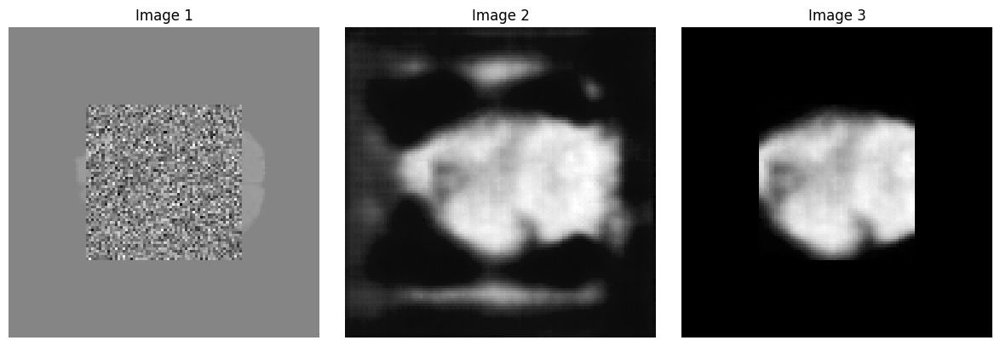

next


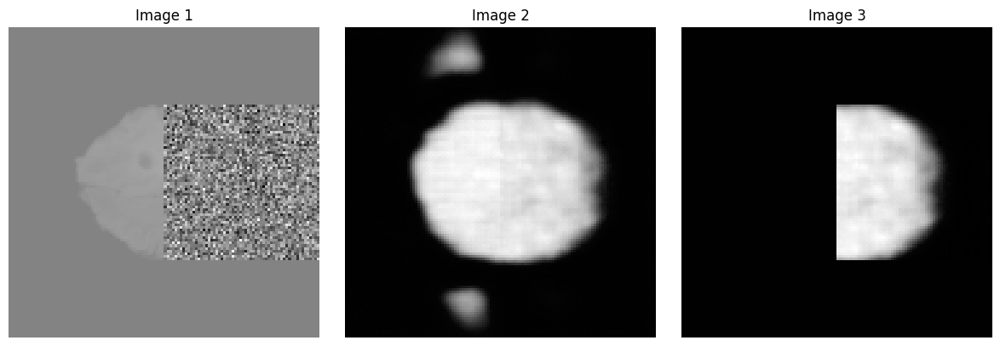

next


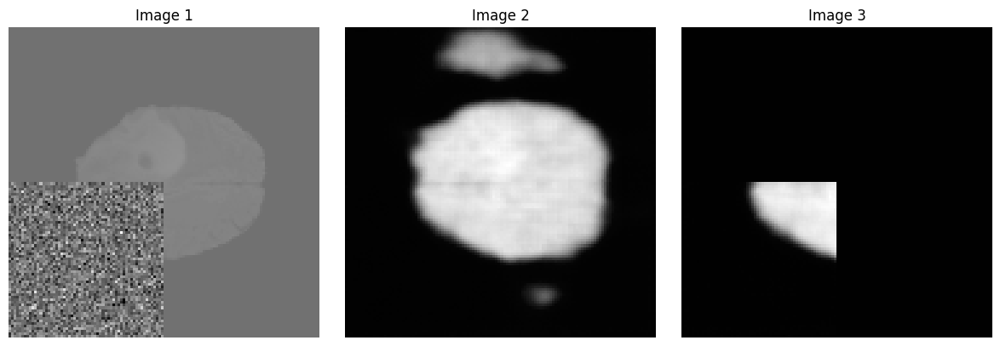

next


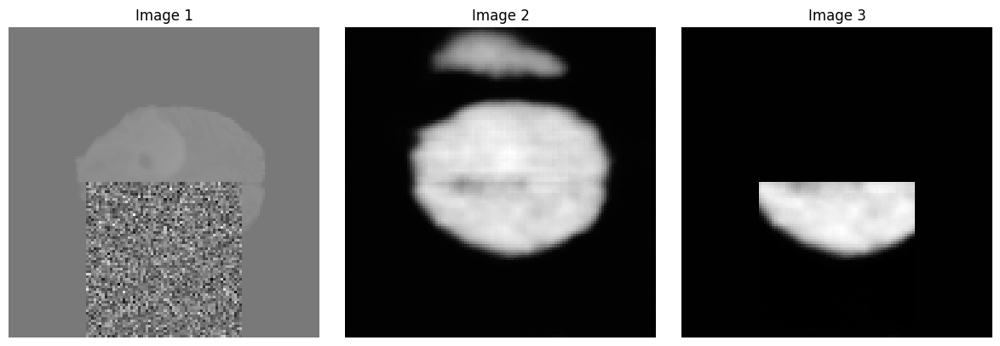

next


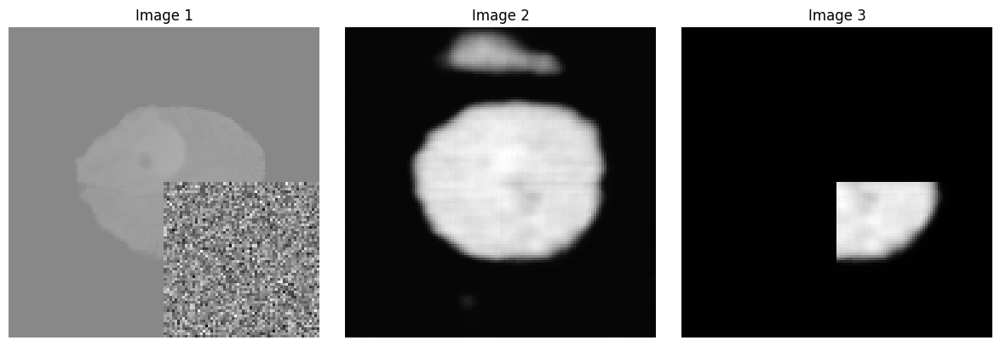

next


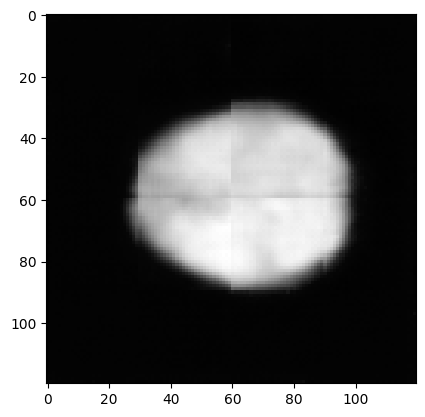

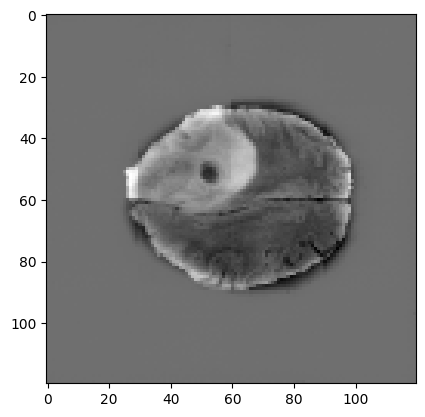

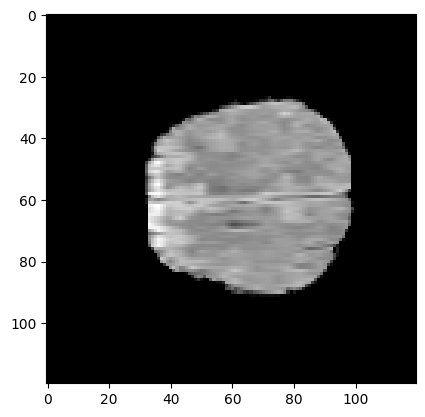

torch.Size([1, 1, 120, 120])


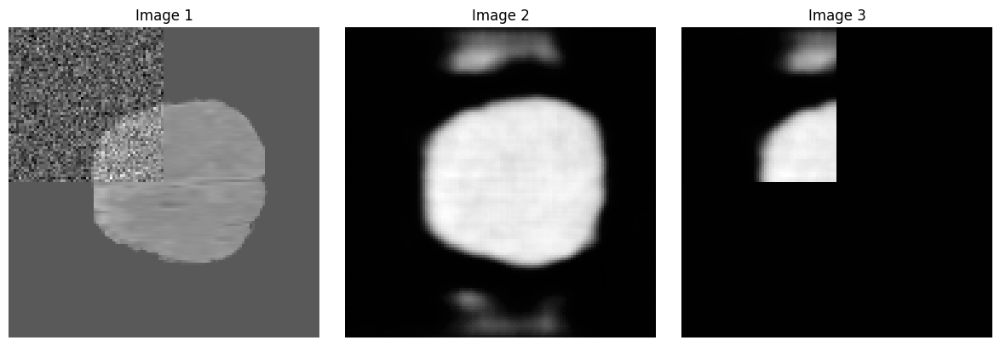

next


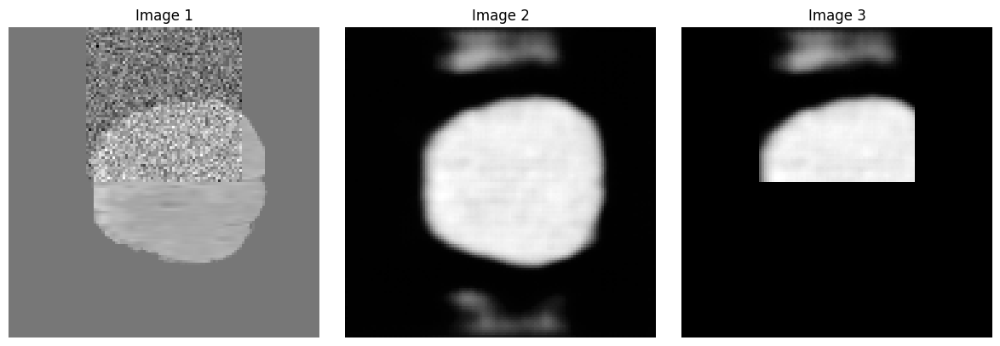

next


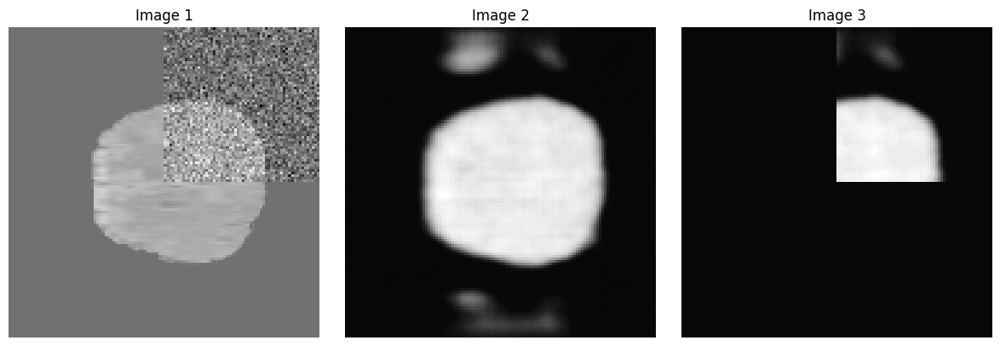

next


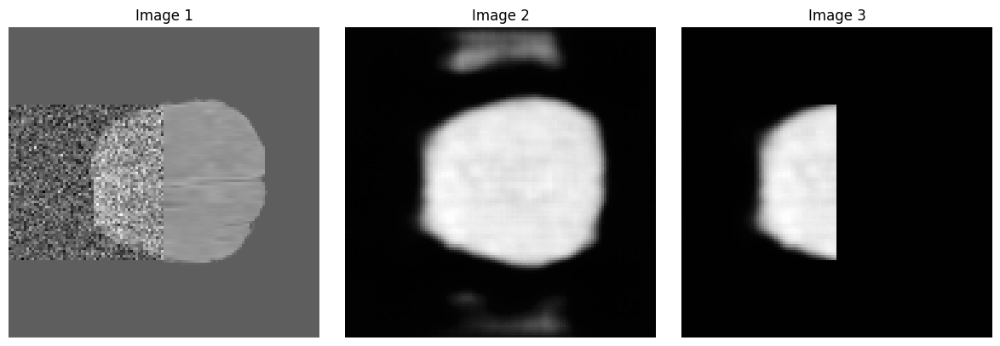

next


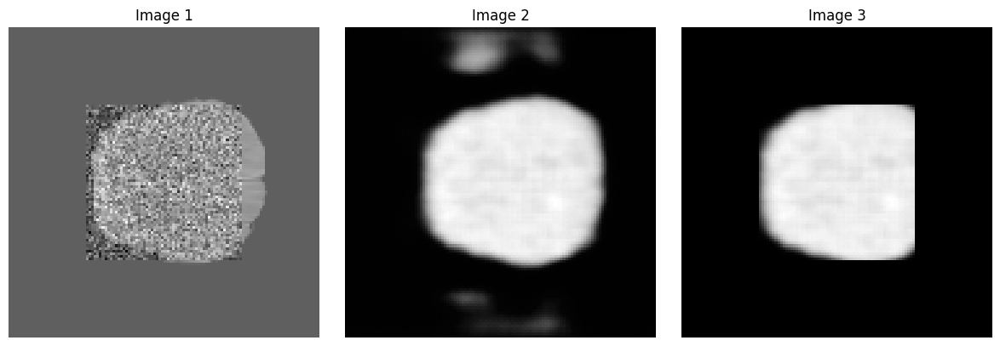

next


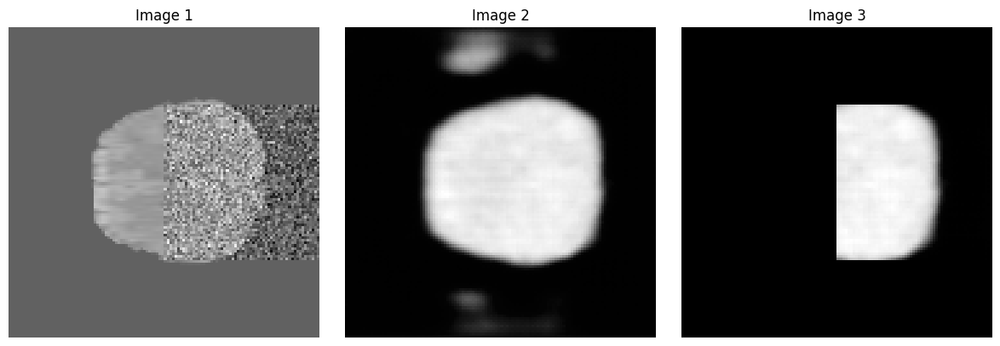

next


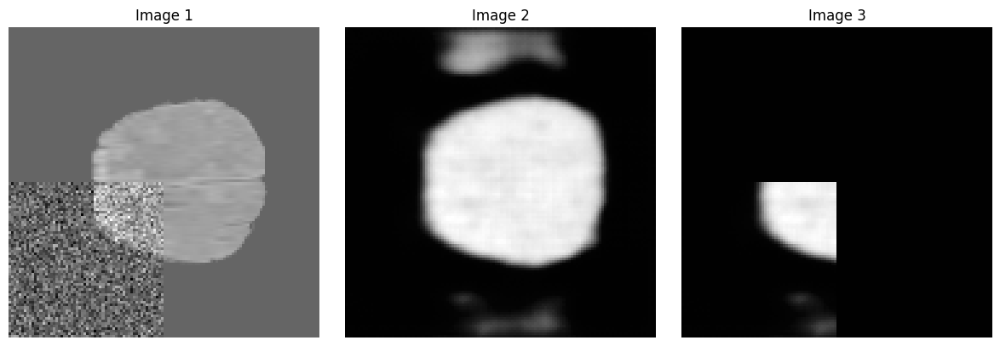

next


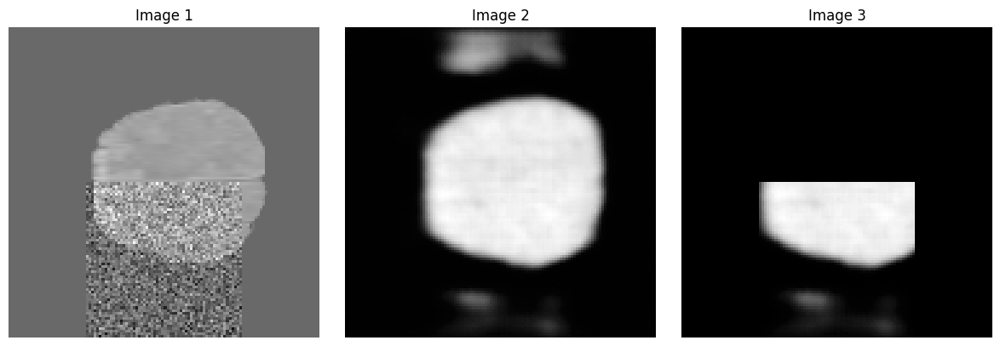

next


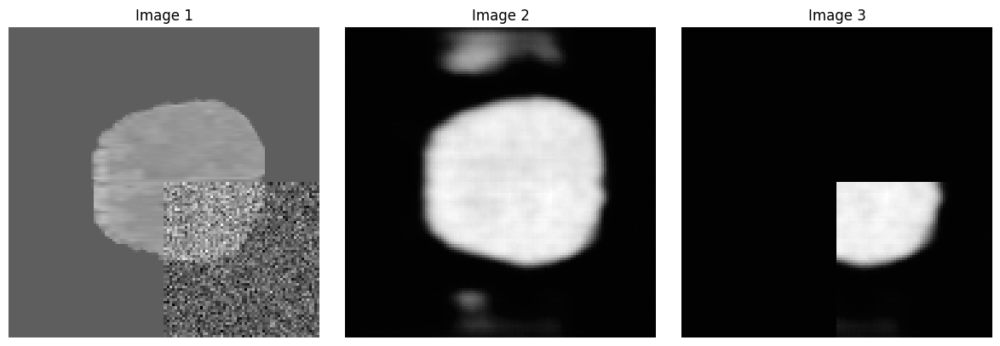

next


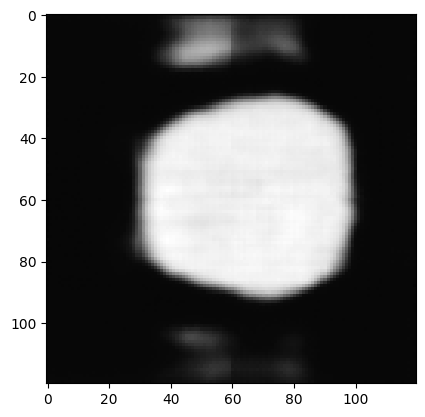

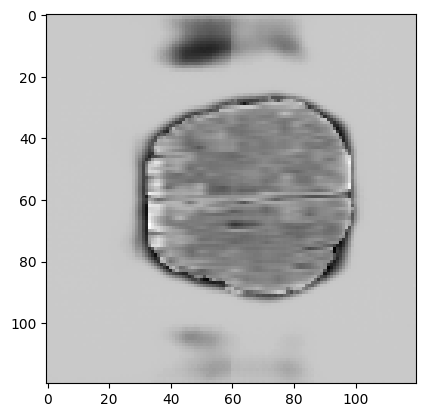

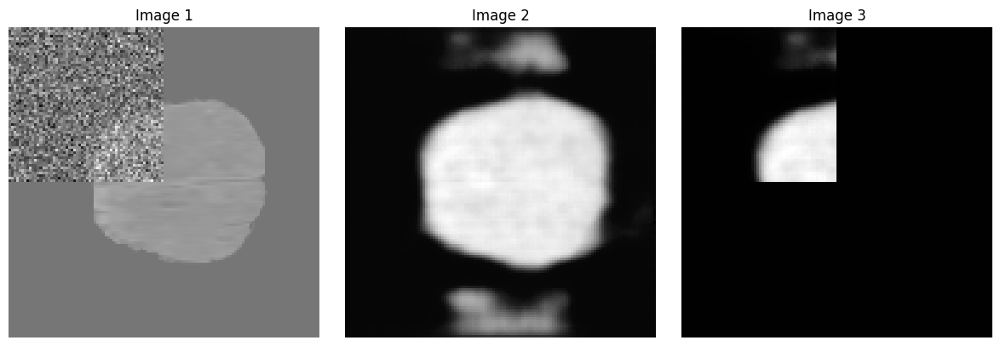

next


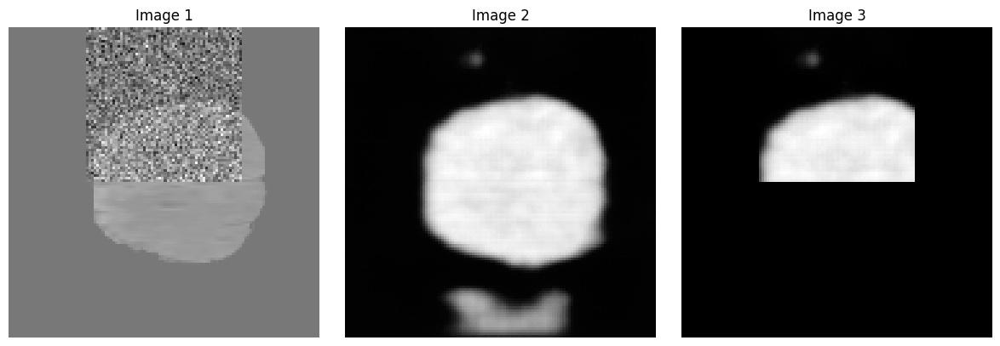

next


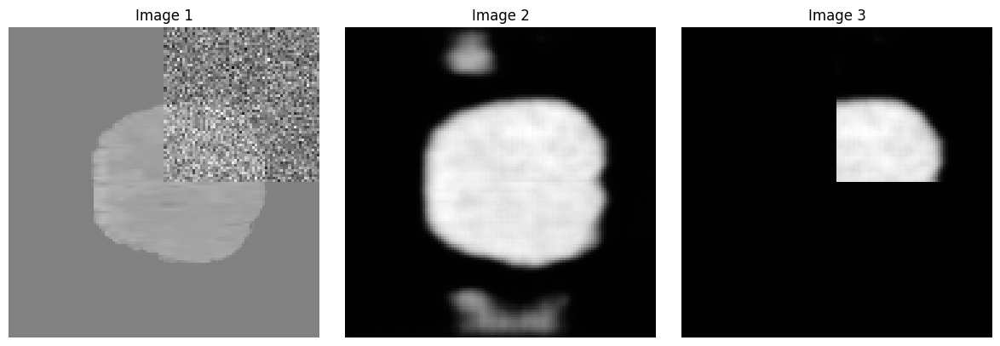

next


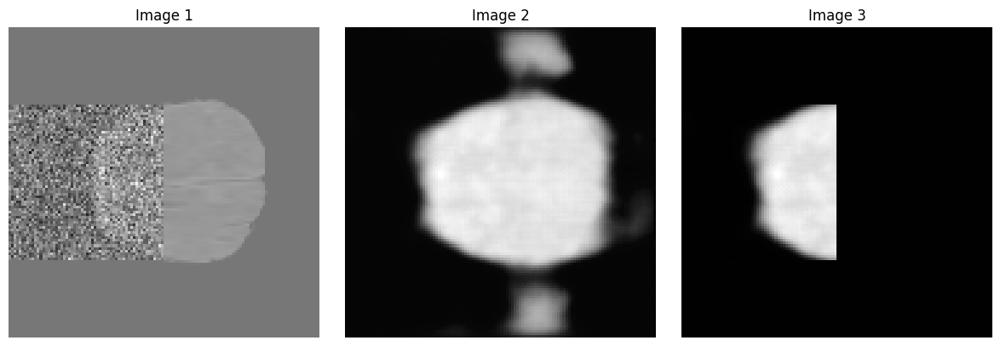

next


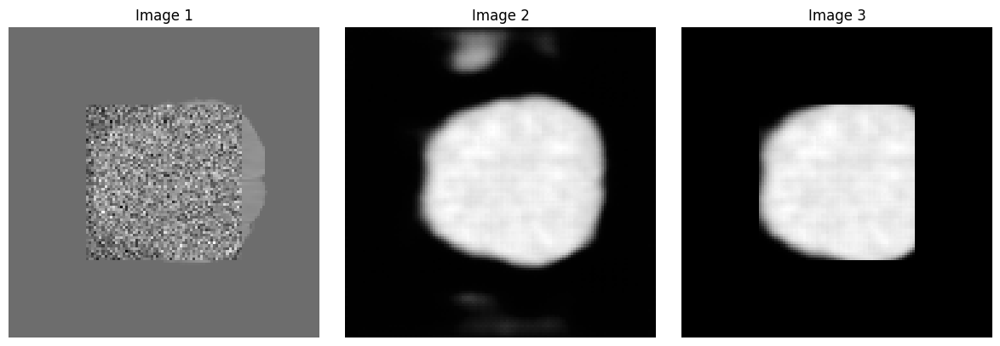

next


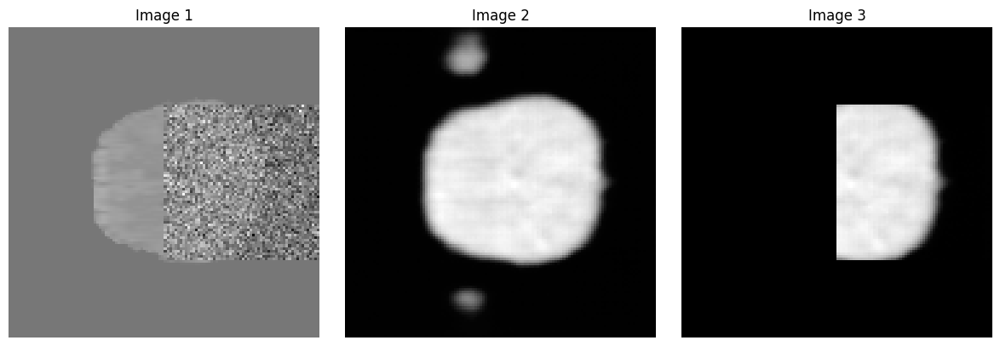

next


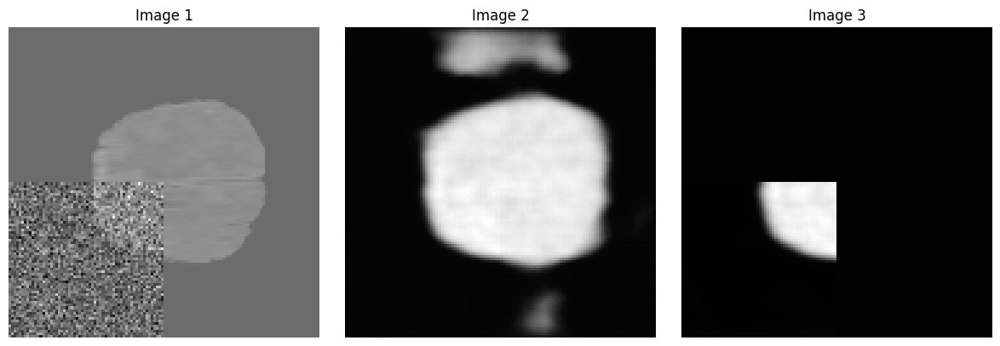

next


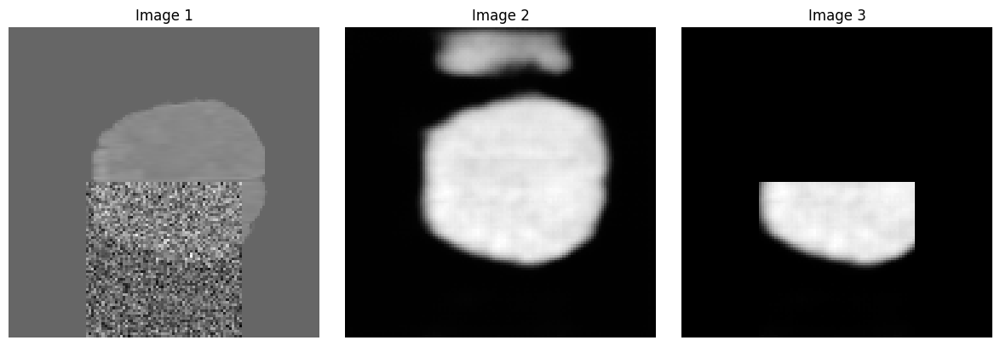

next


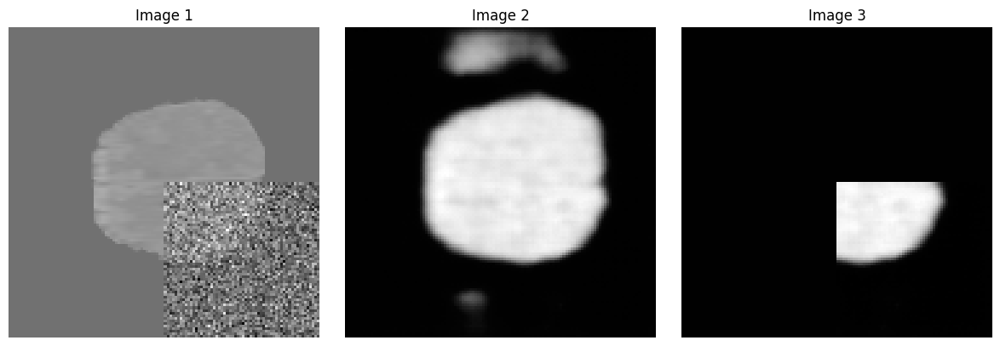

next


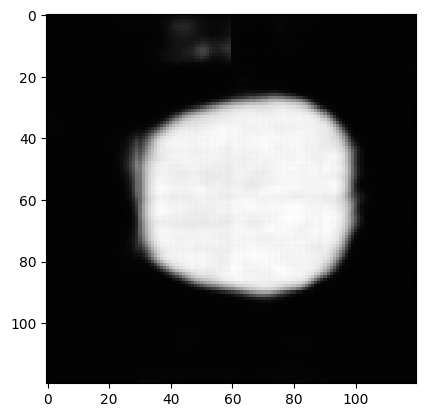

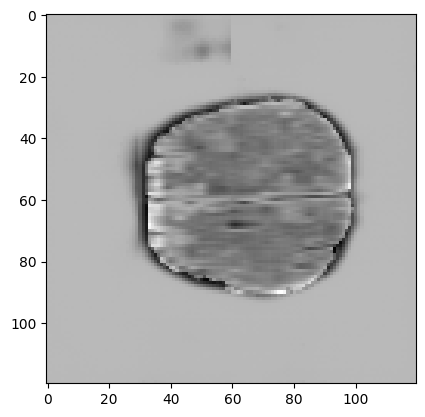

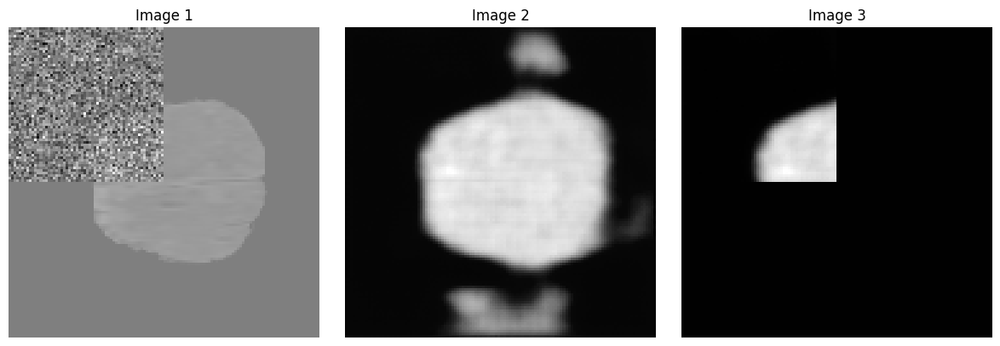

next


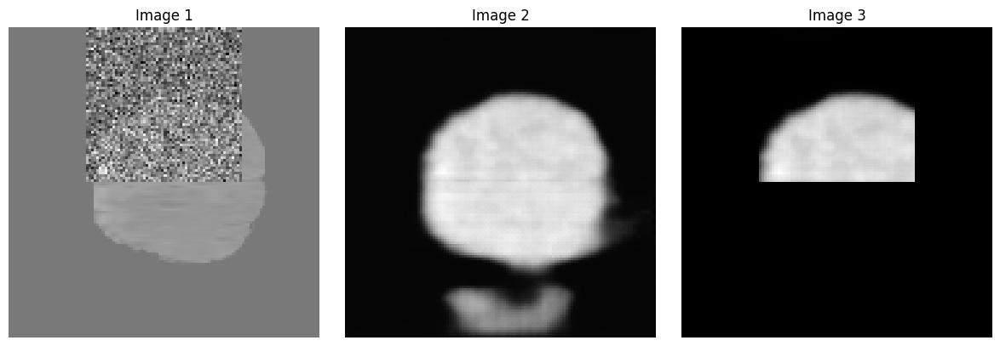

next


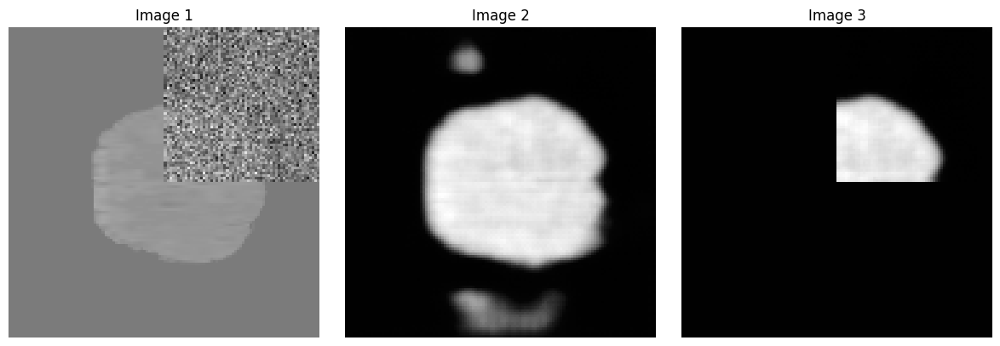

next


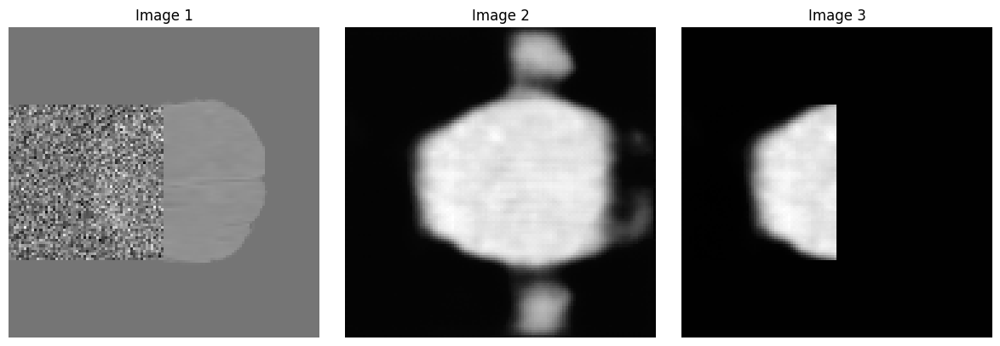

next


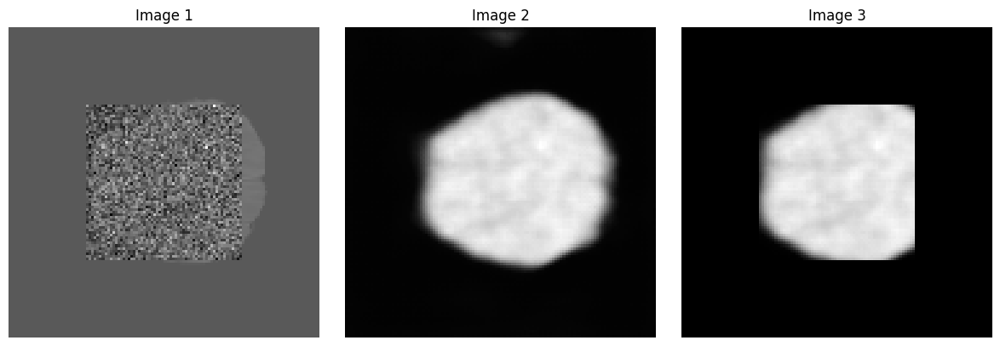

next


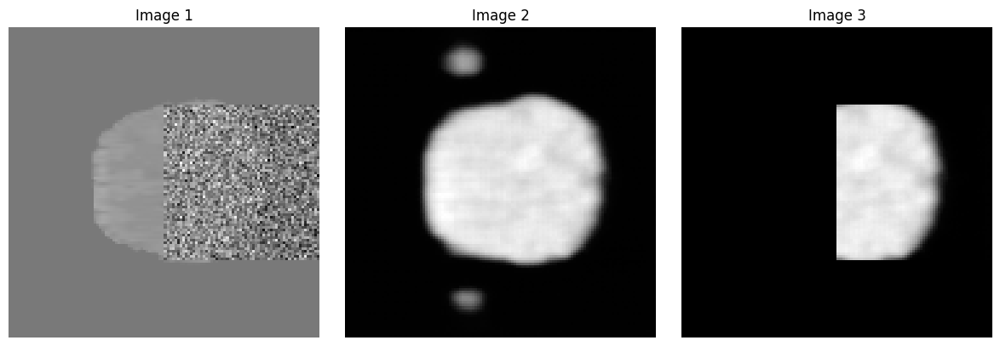

next


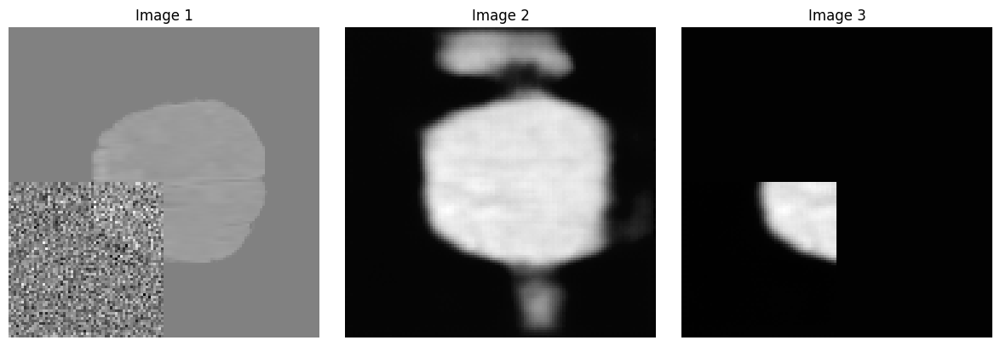

next


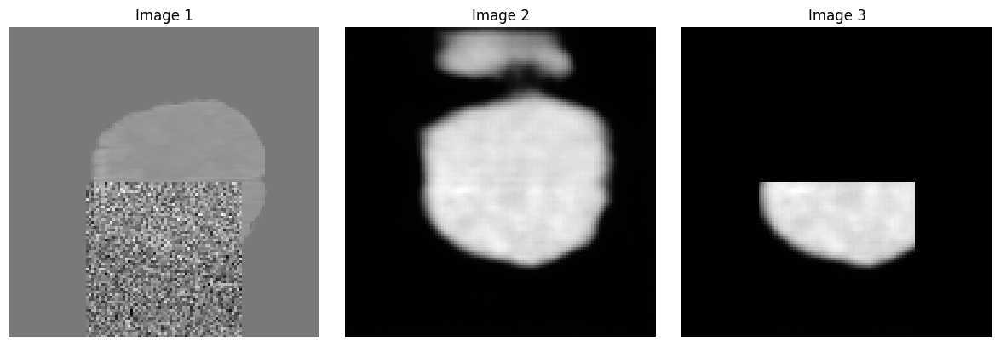

next


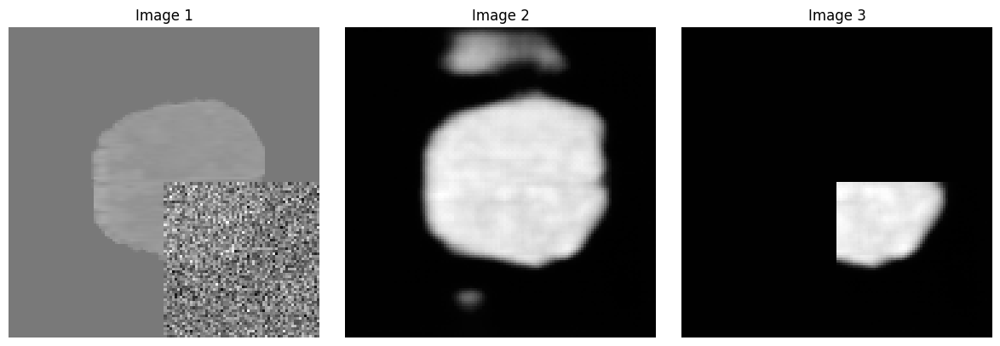

next


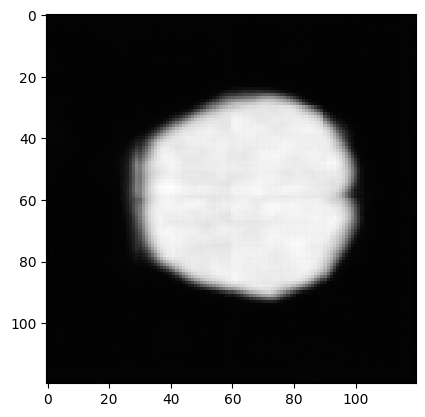

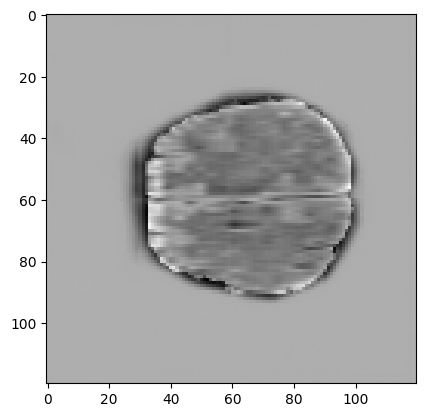

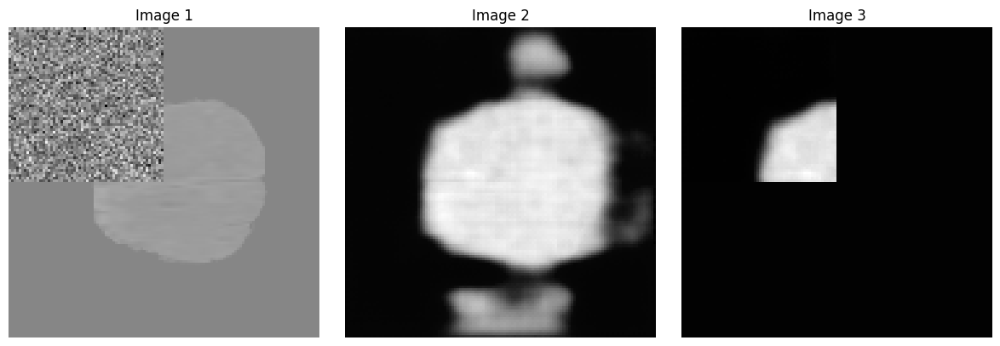

next


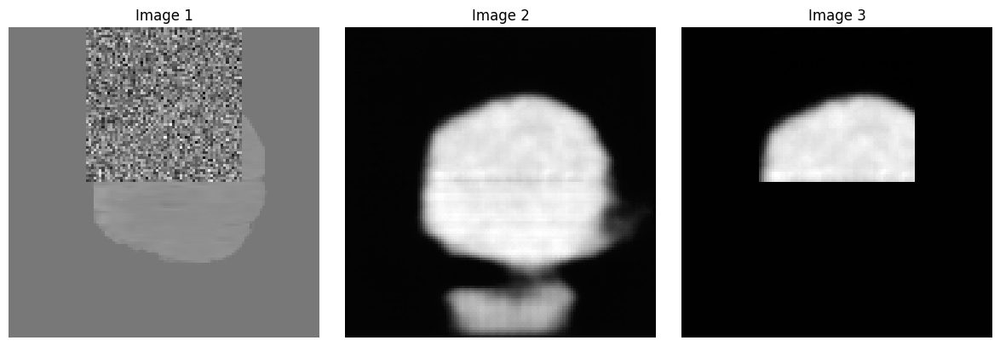

next


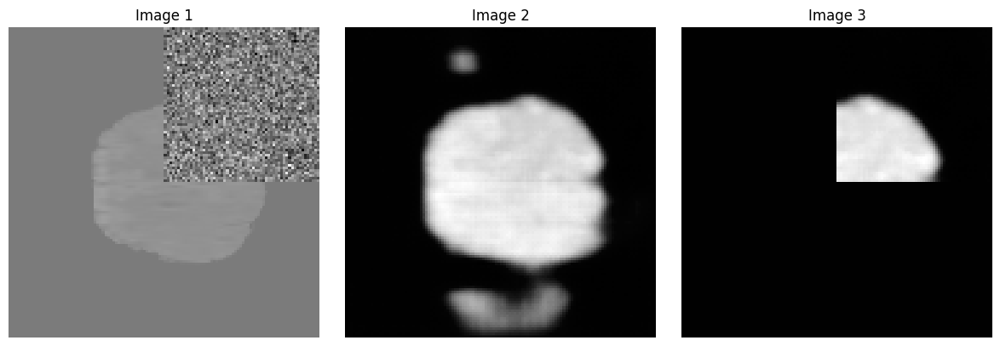

next


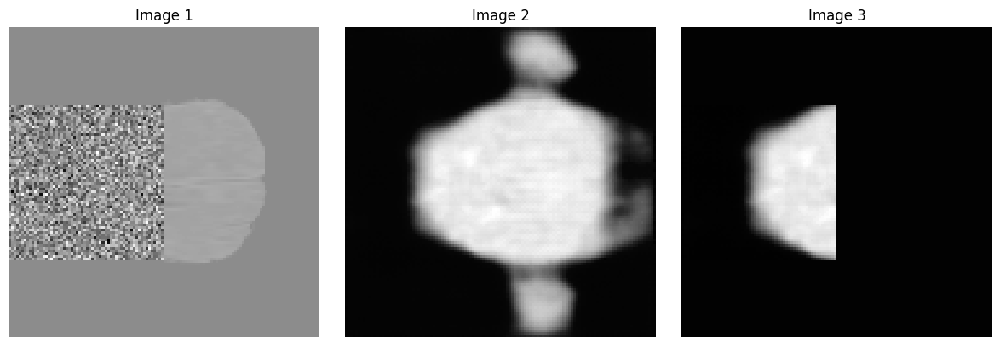

next


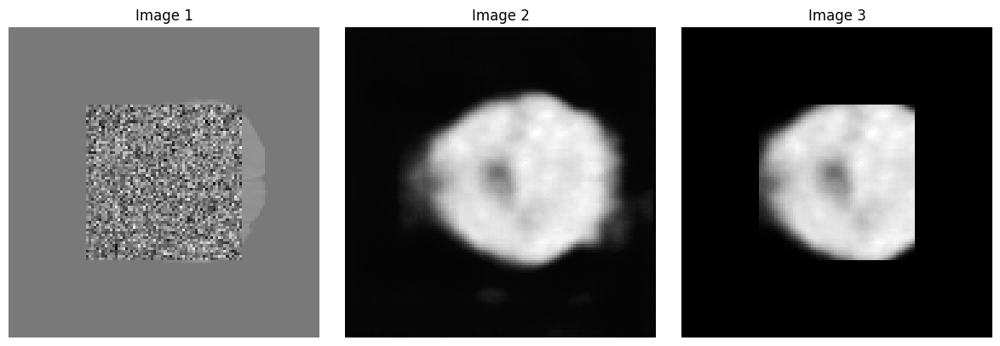

next


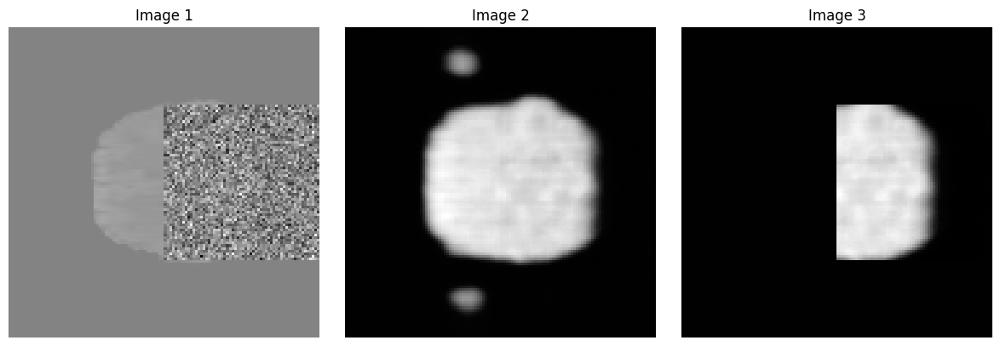

next


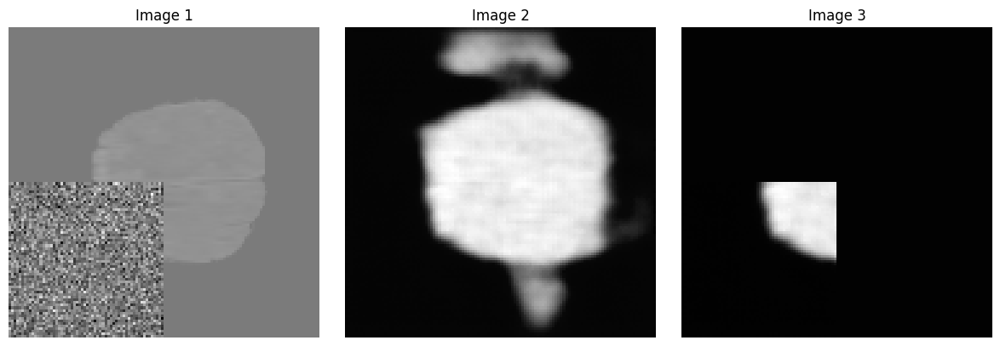

next


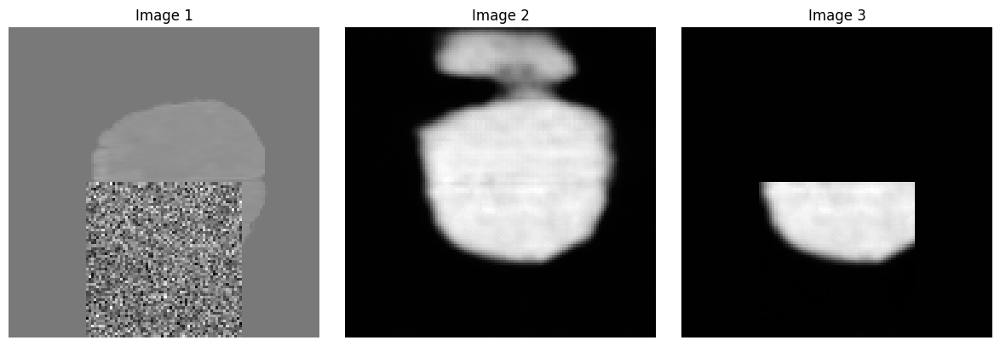

next


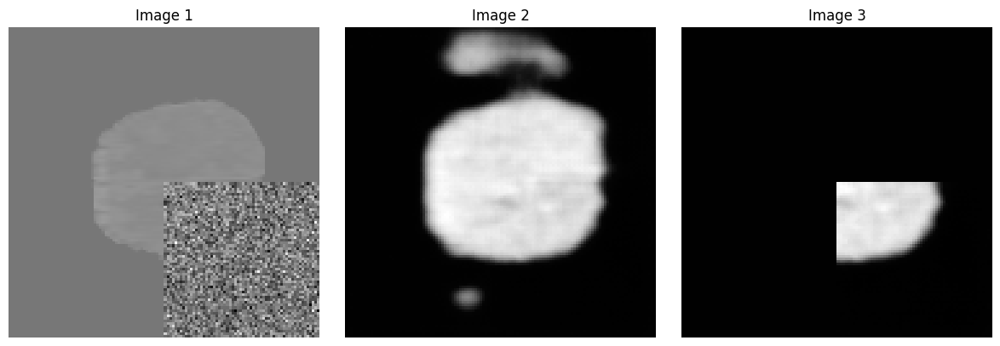

next


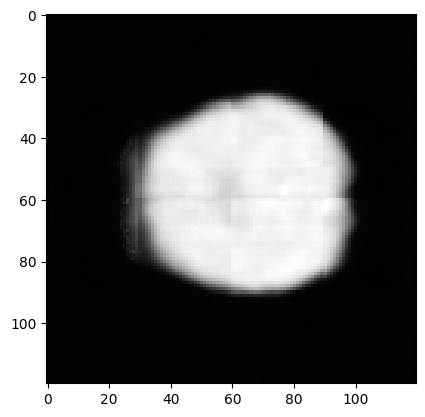

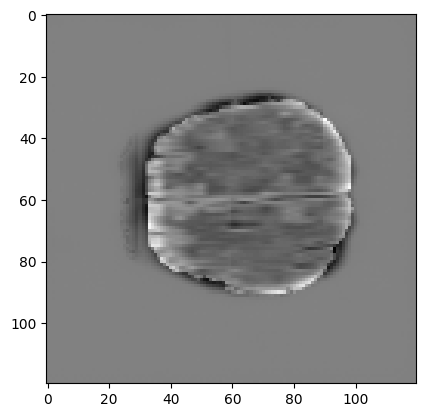

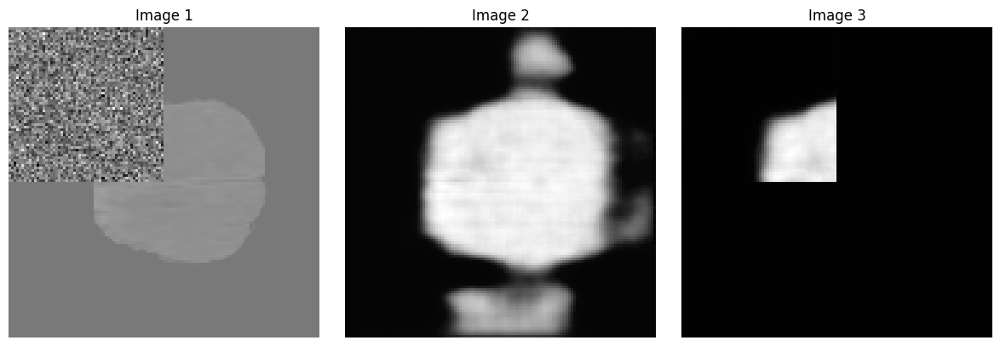

next


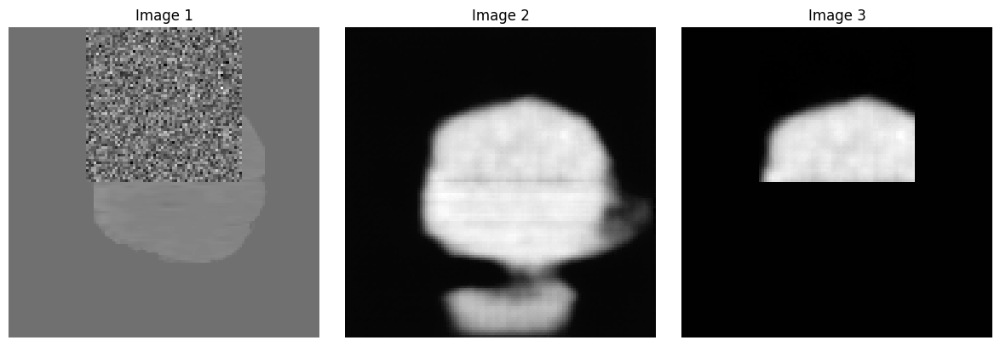

next


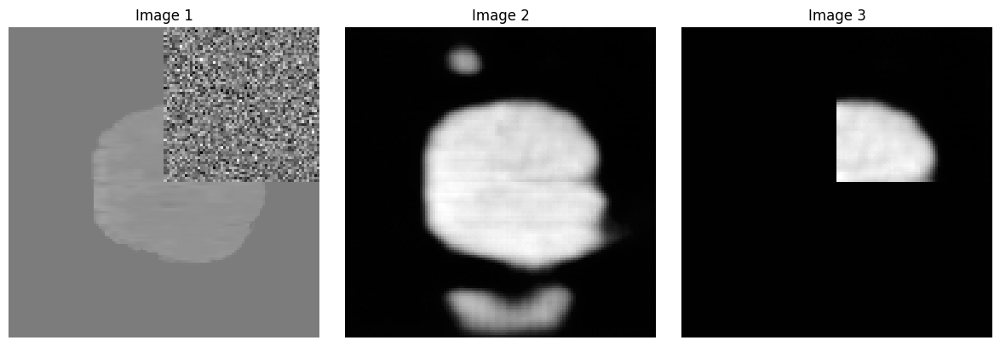

next


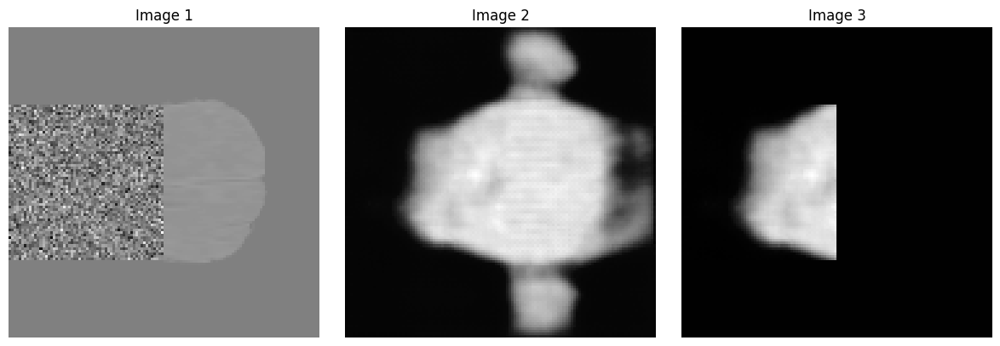

next


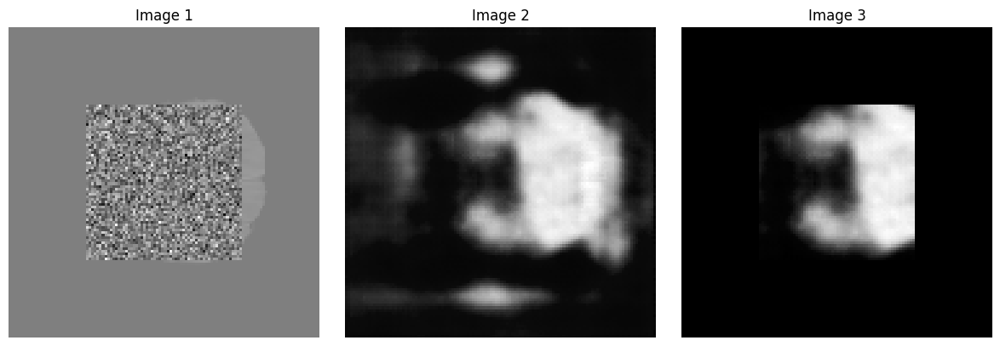

next


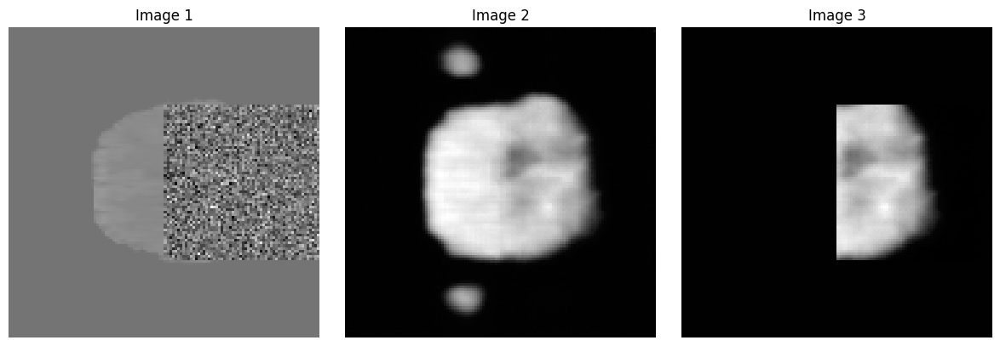

next


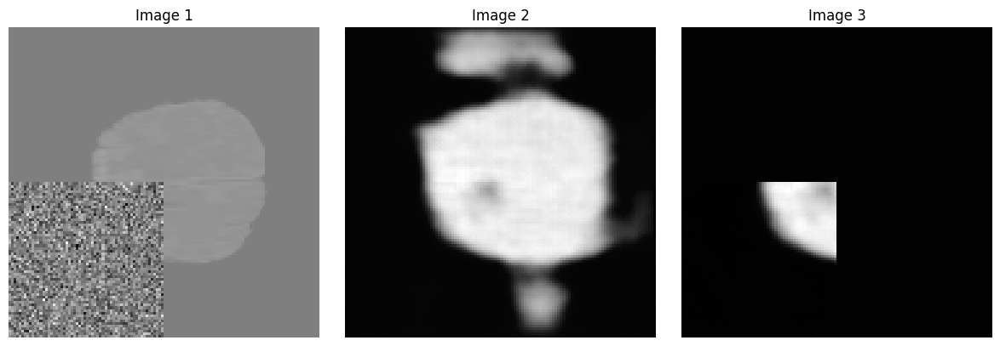

next


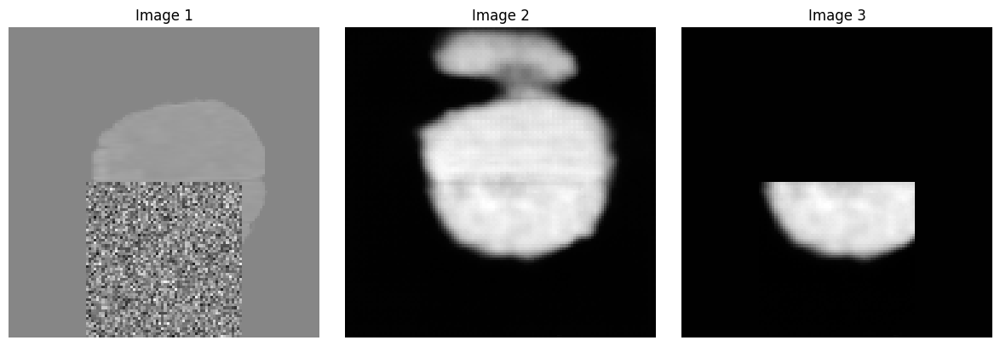

next


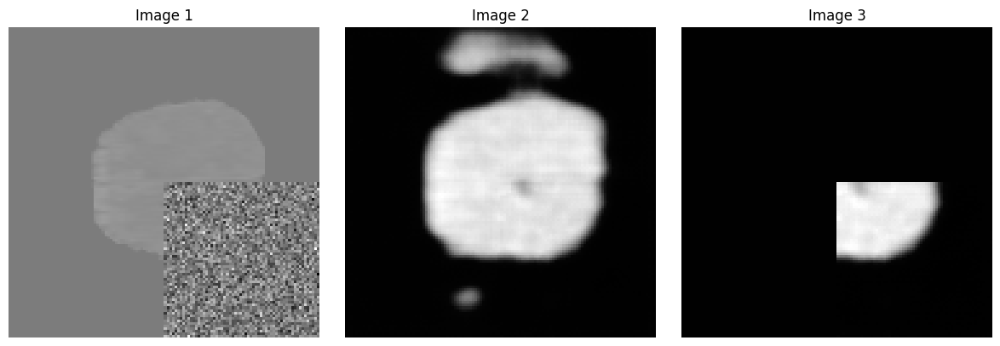

next


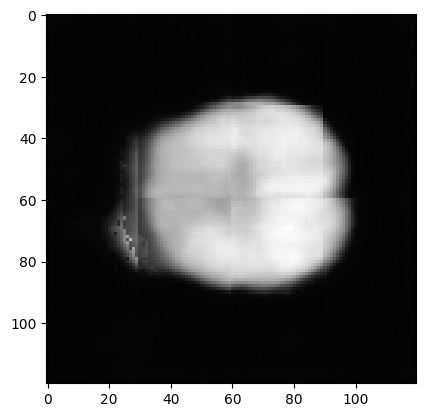

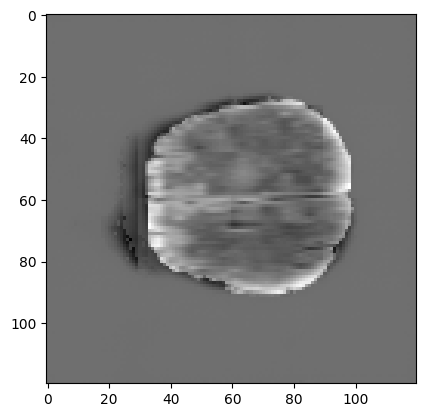

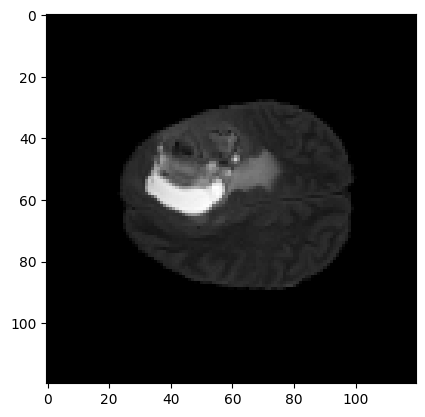

torch.Size([1, 1, 120, 120])


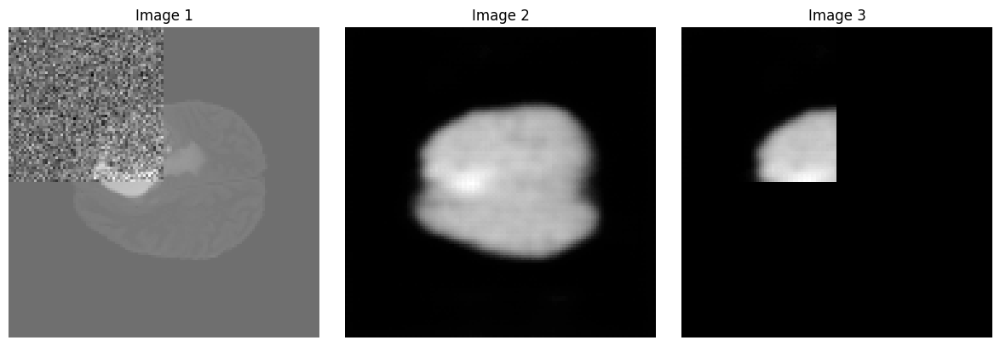

next


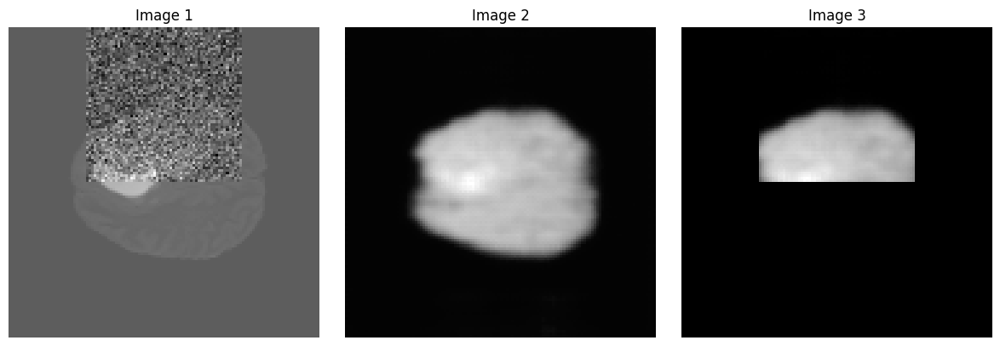

next


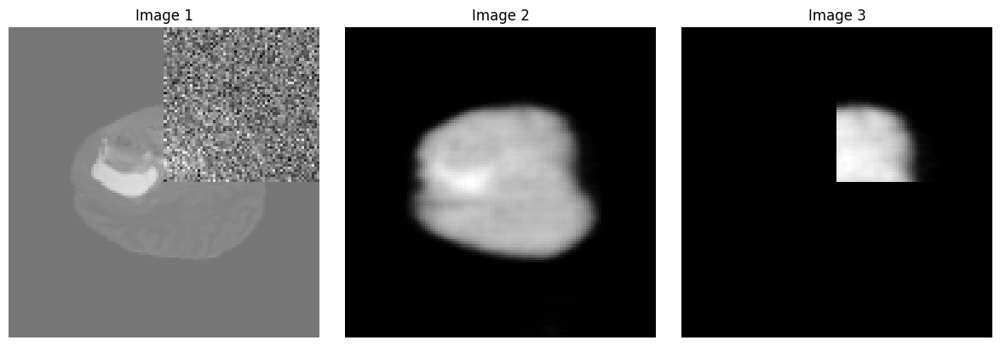

next


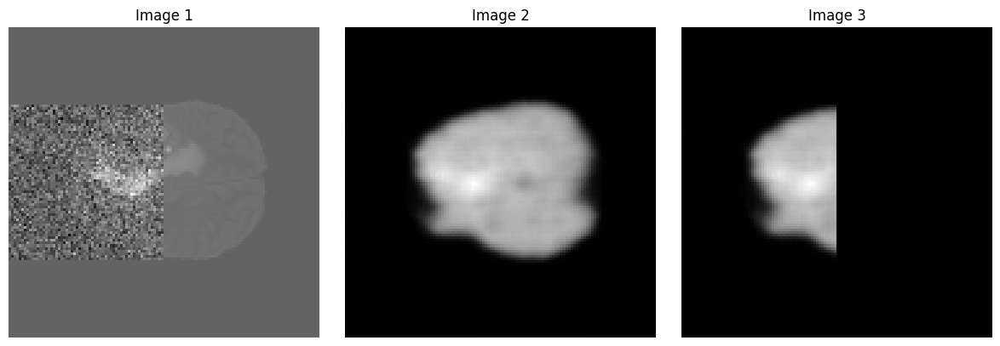

next


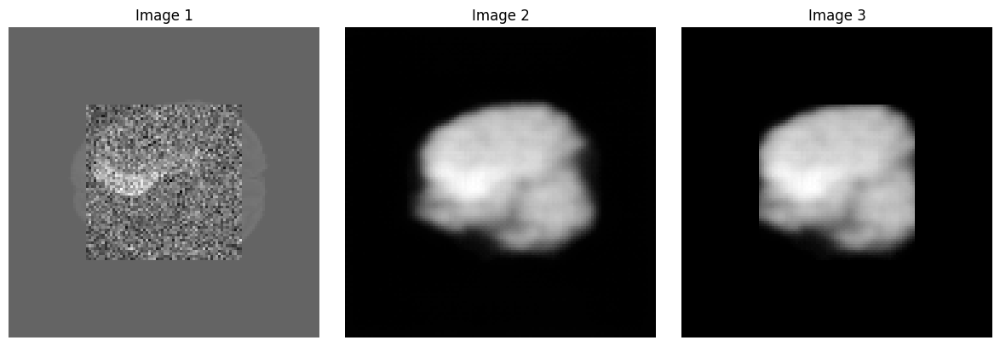

next


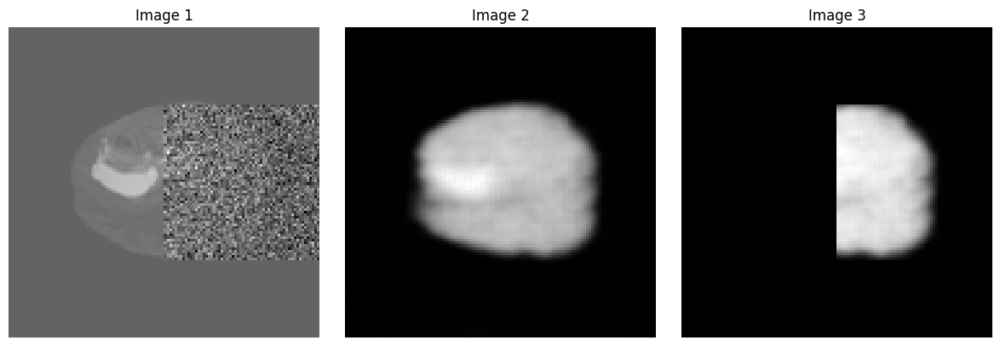

next


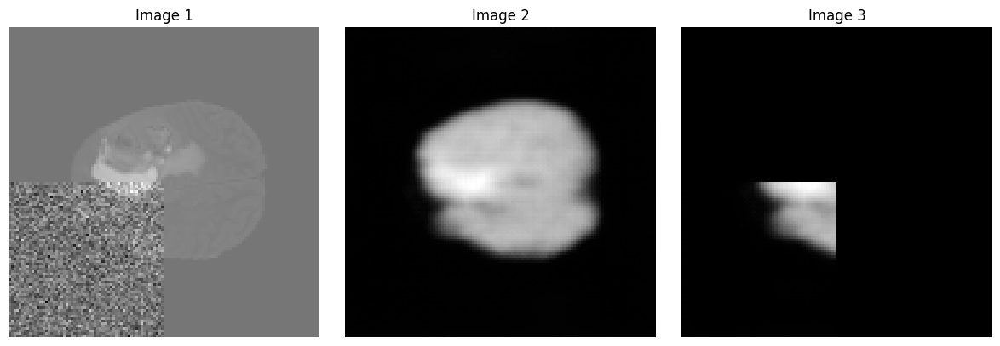

next


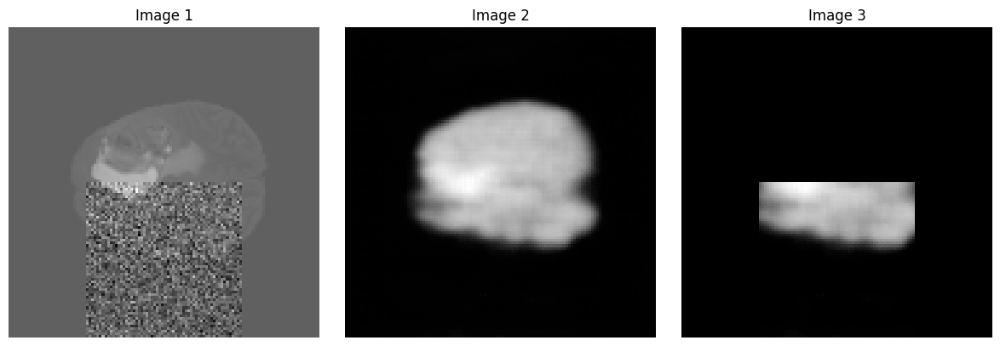

next


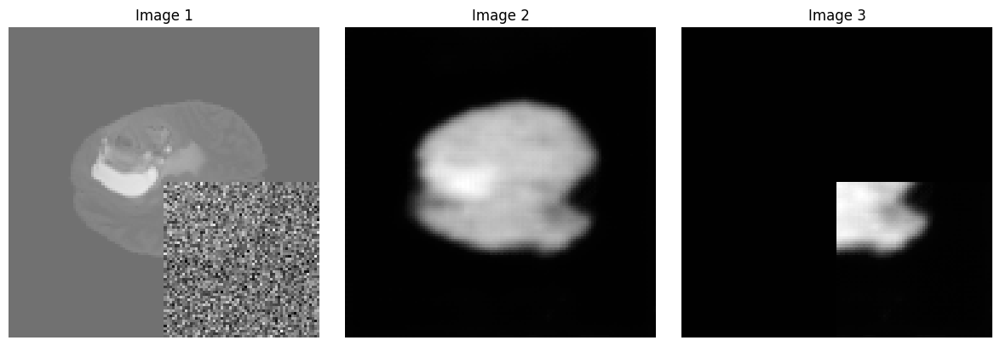

next


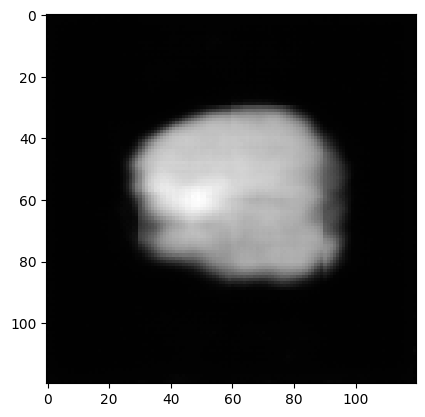

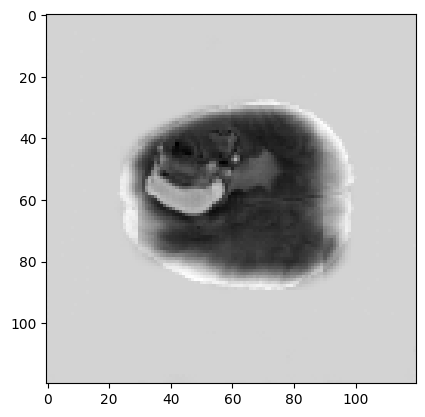

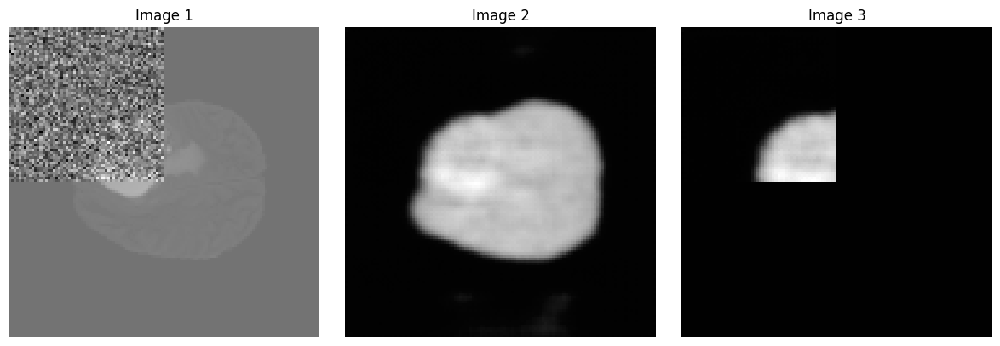

next


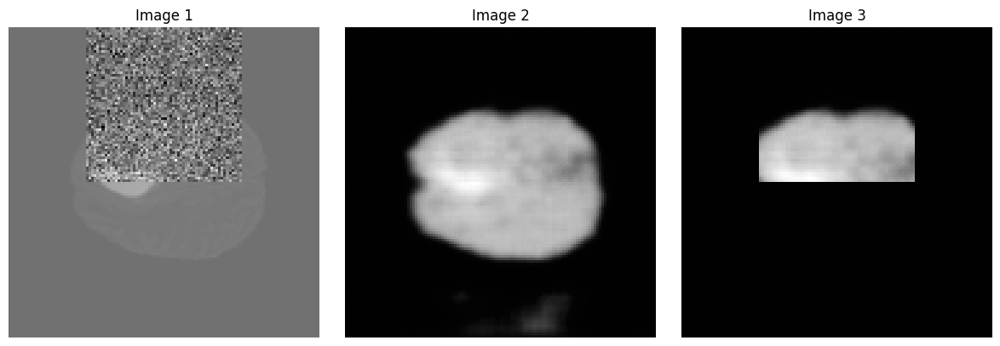

next


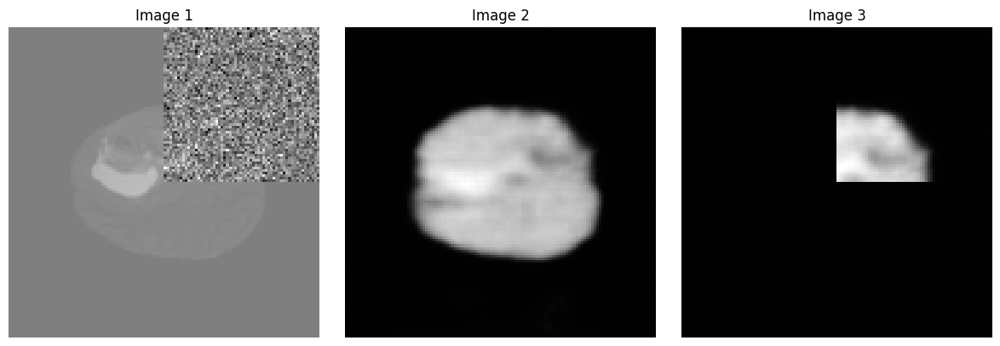

next


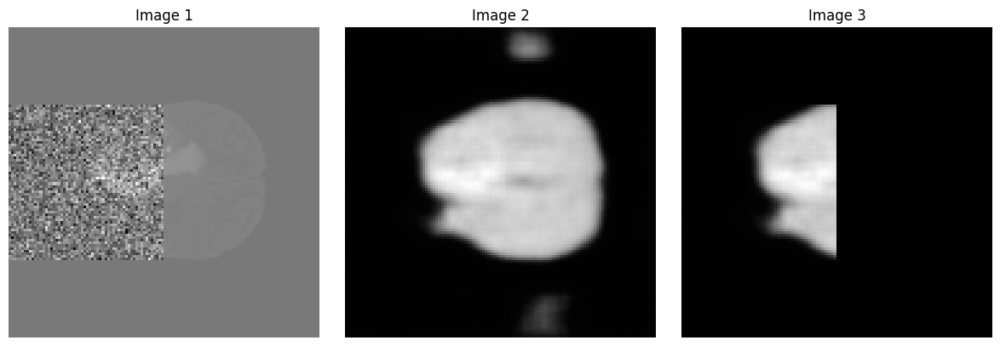

next


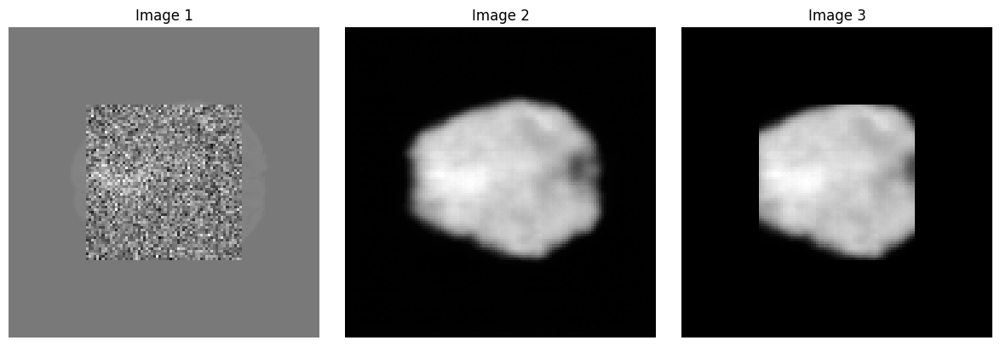

next


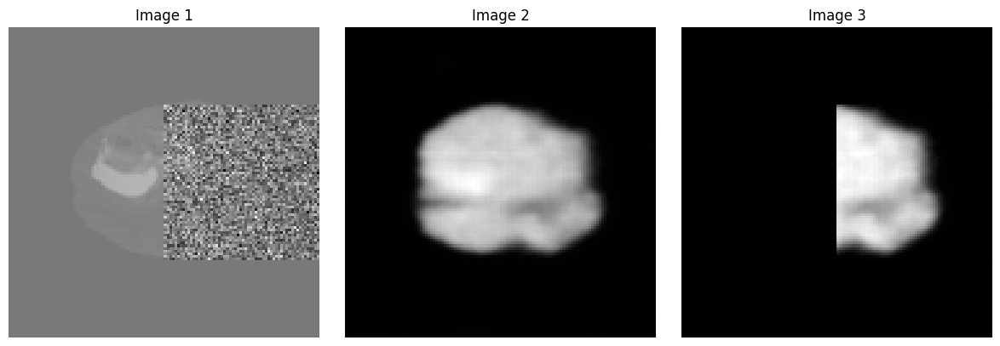

next


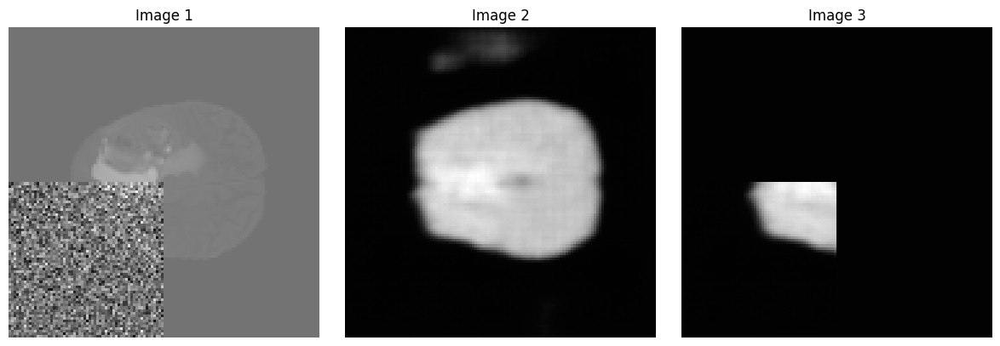

next


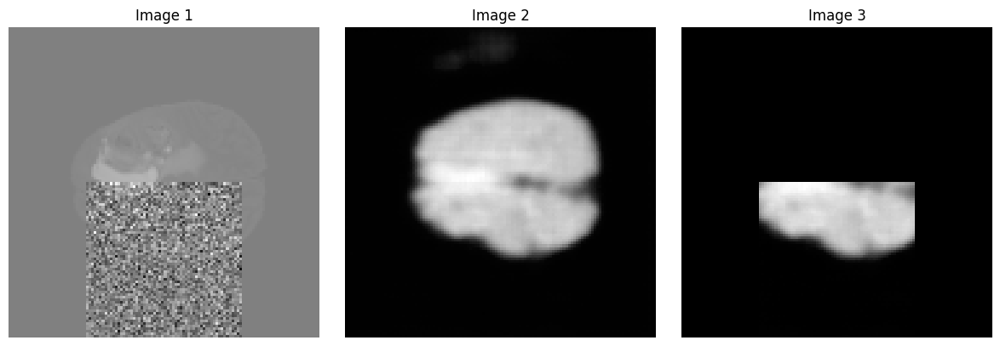

next


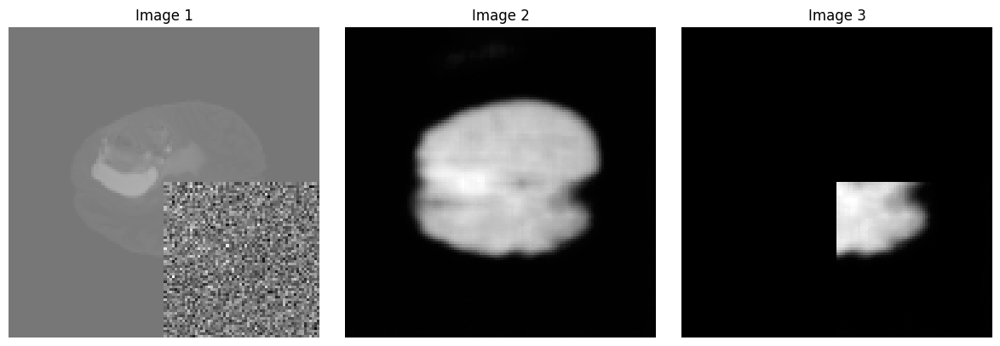

next


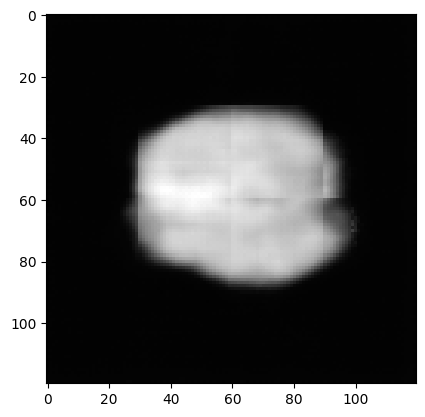

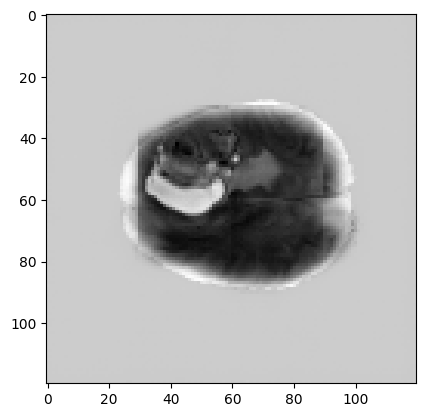

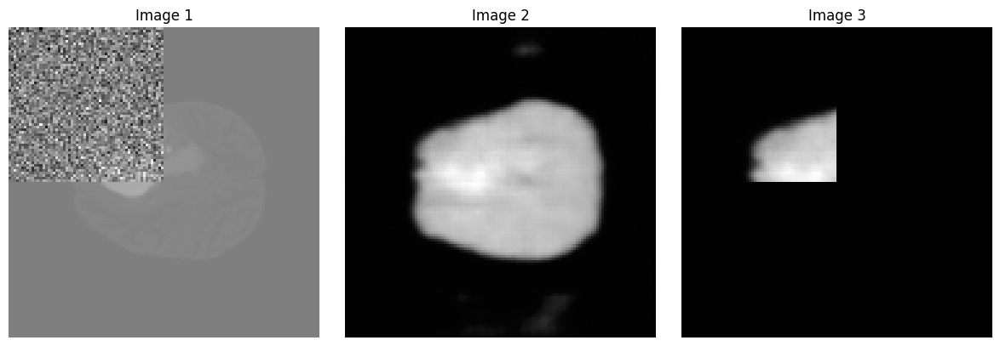

next


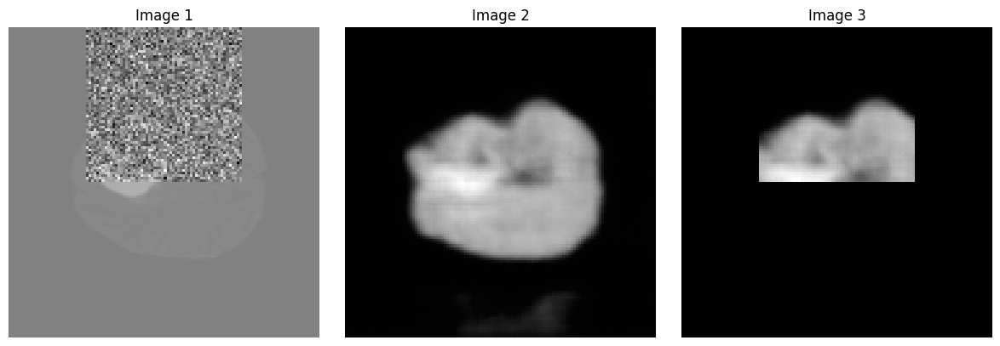

next


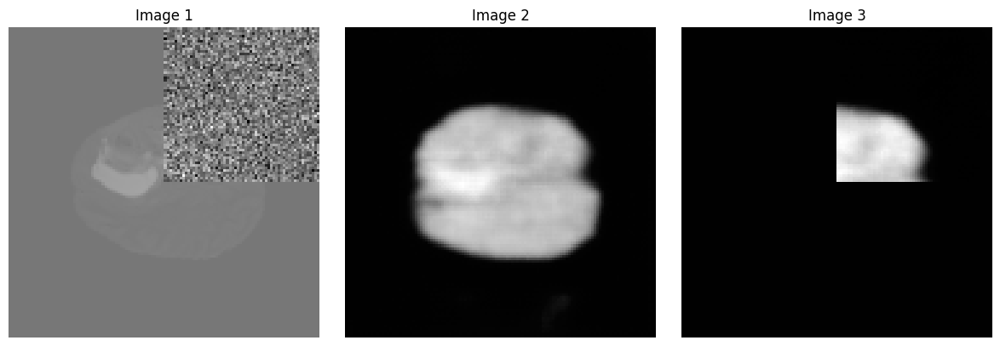

next


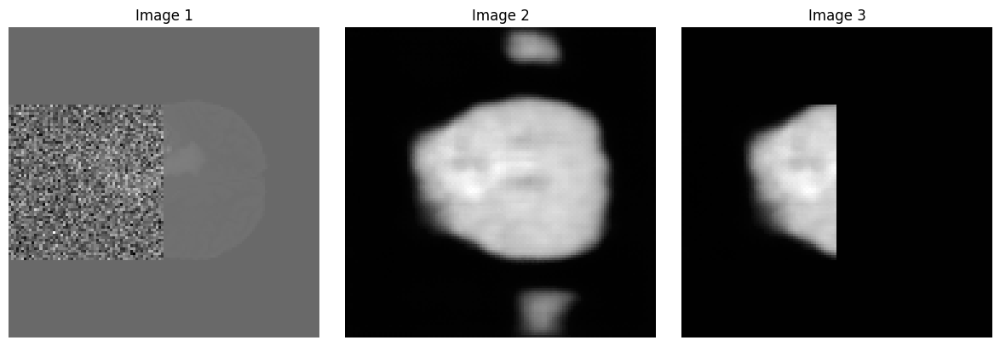

next


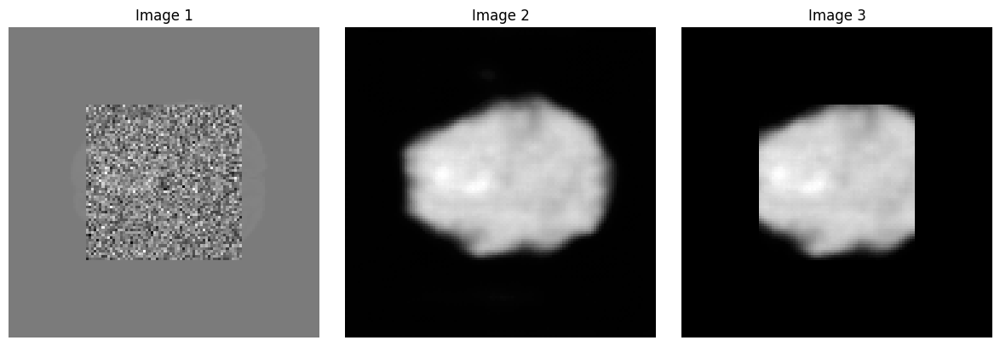

next


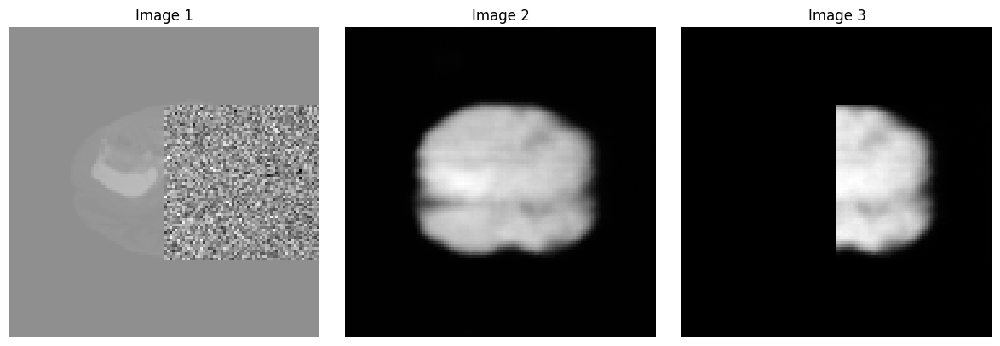

next


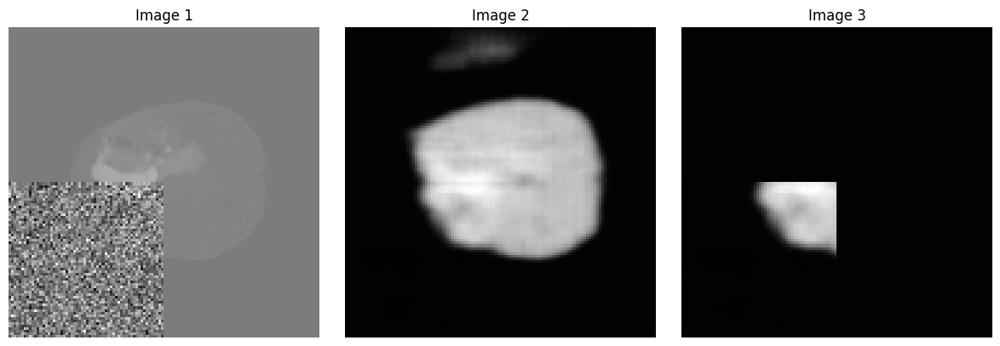

next


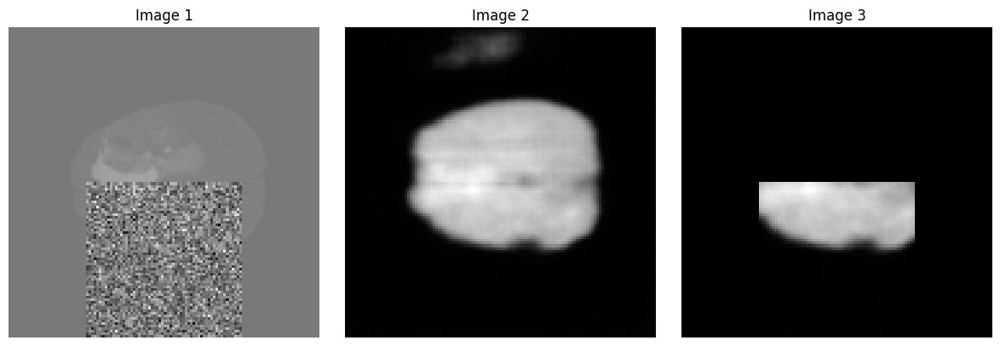

next


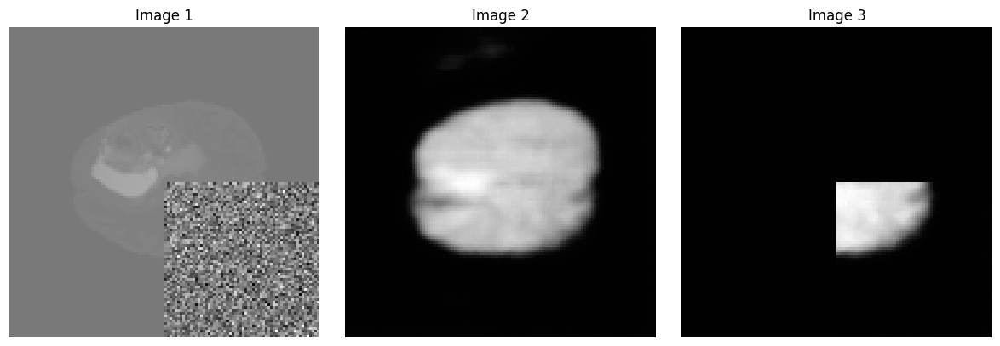

next


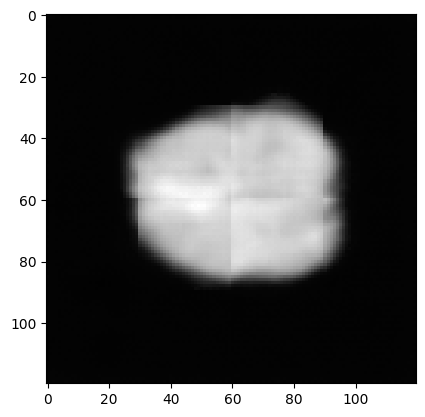

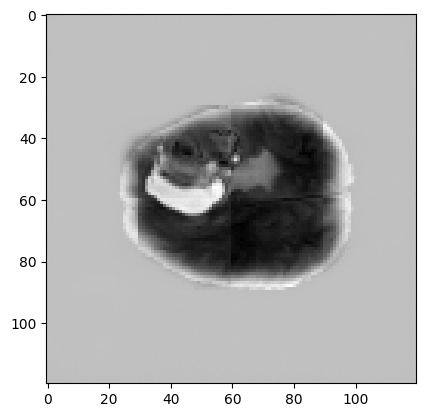

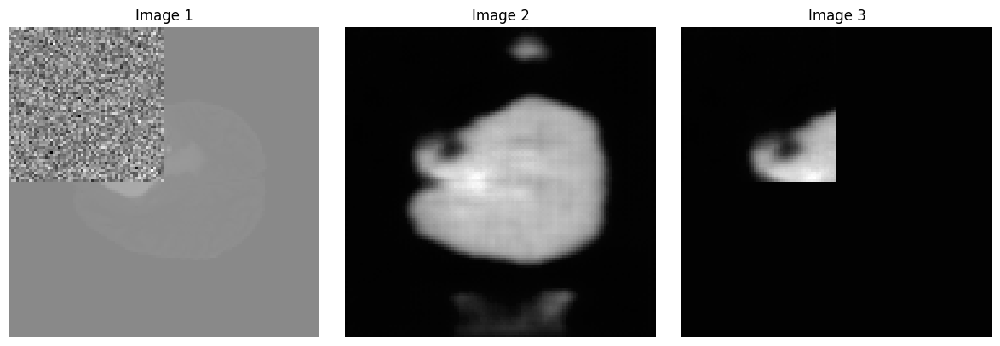

next


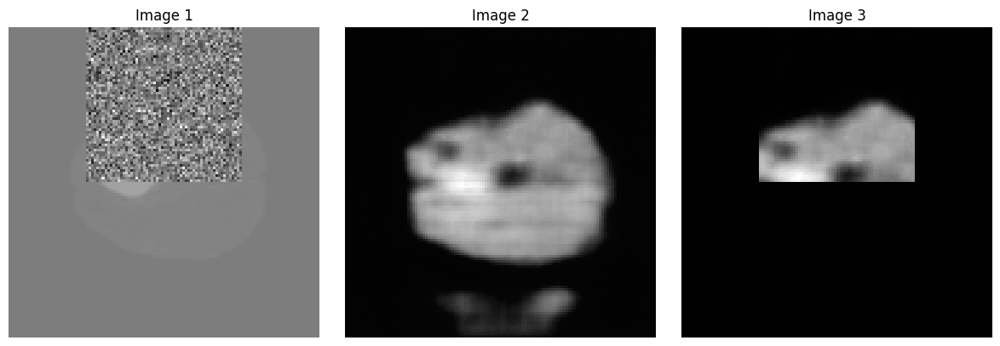

next


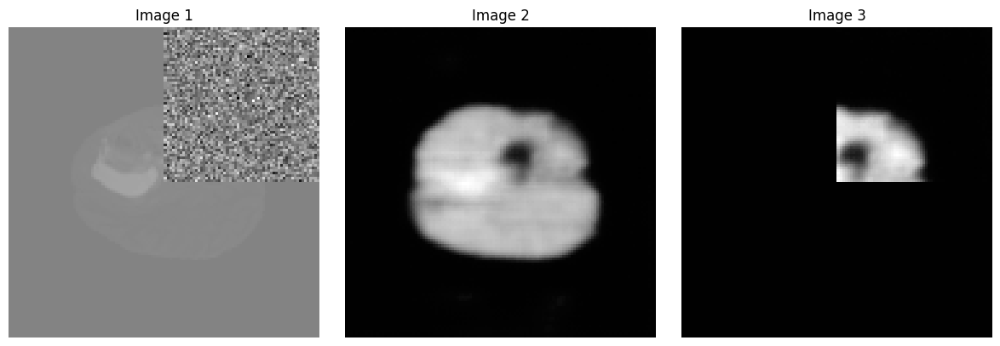

next


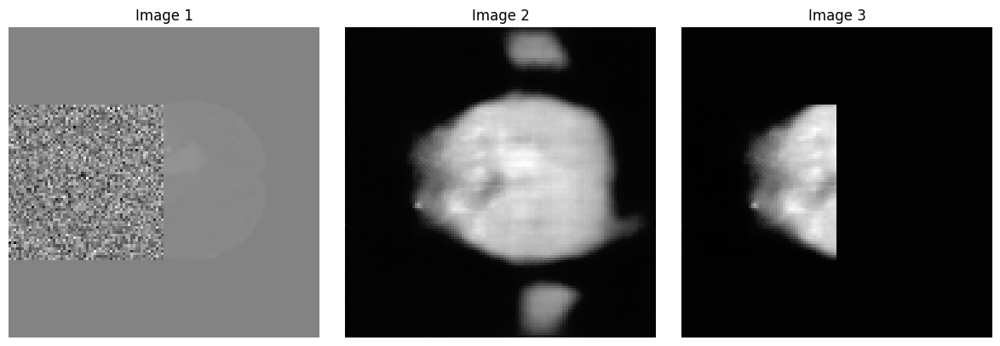

next


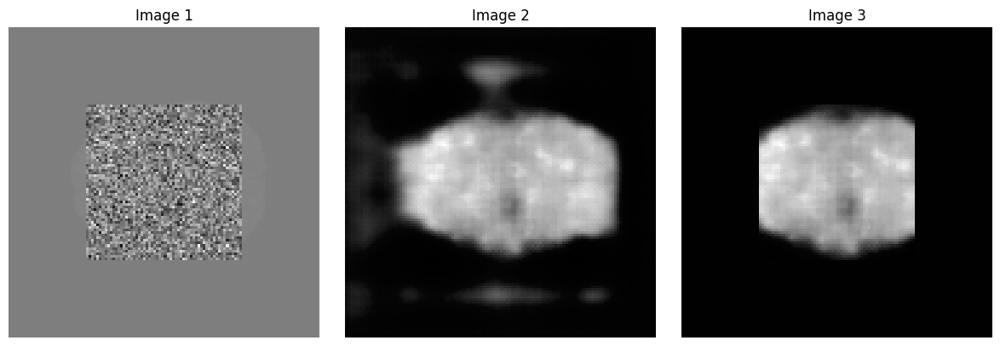

next


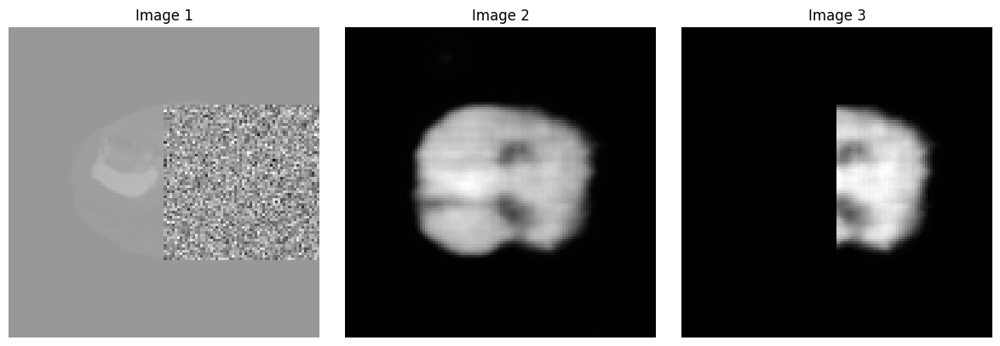

next


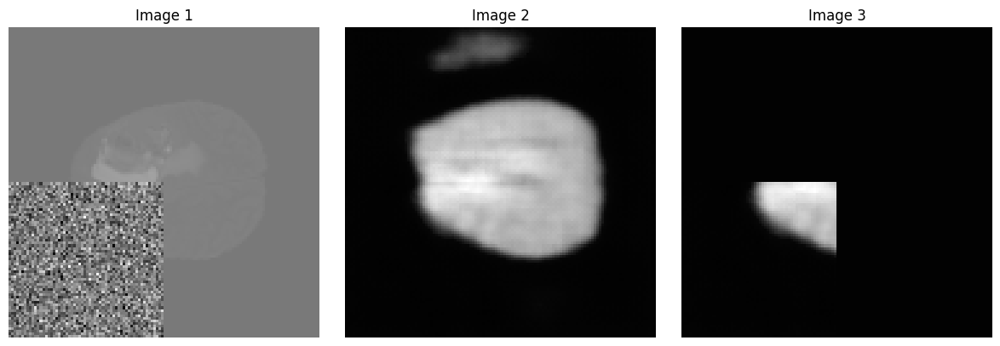

next


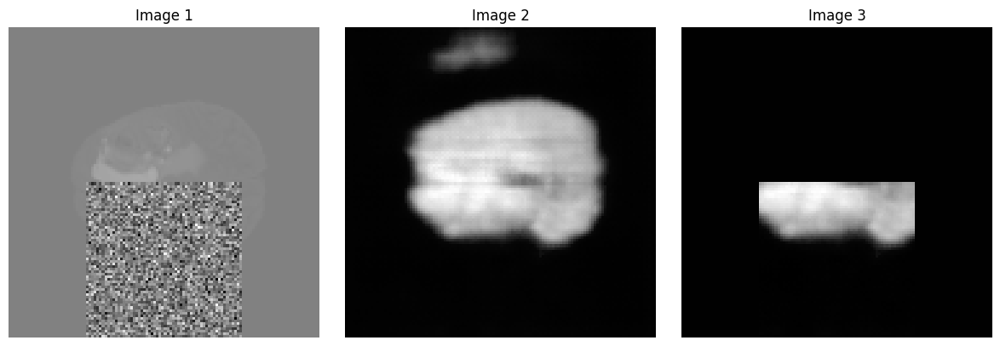

next


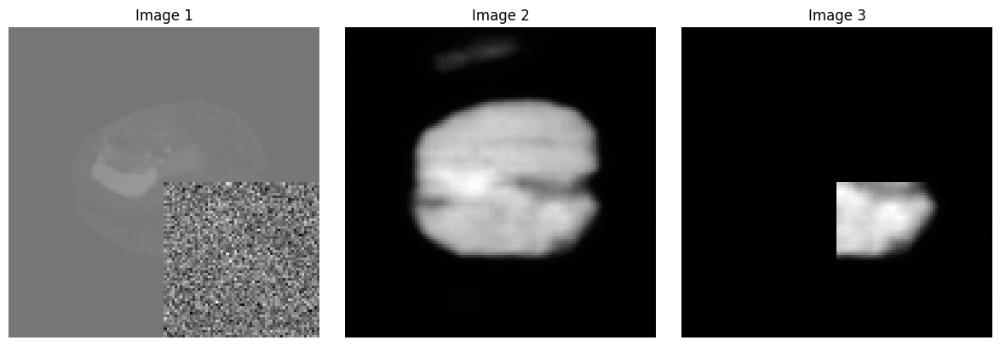

next


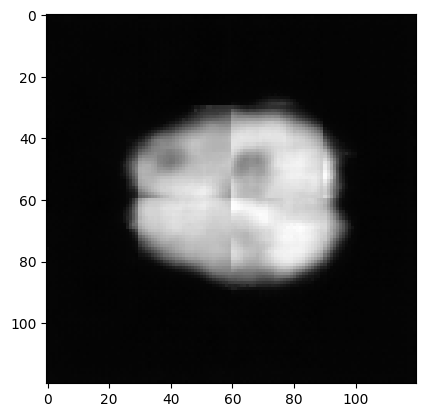

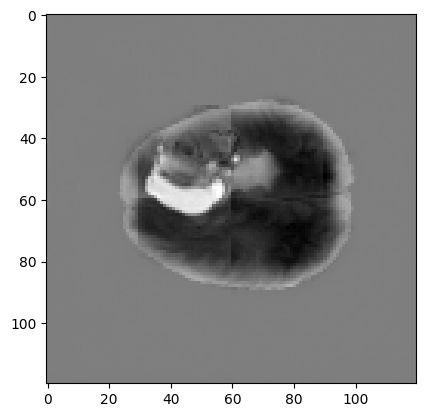

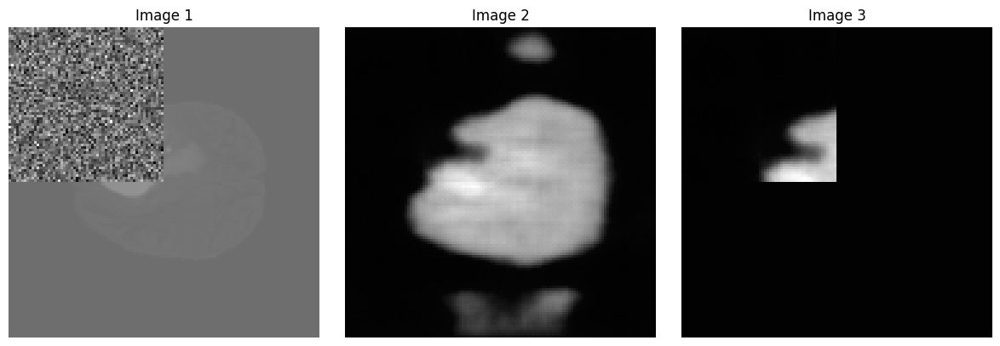

next


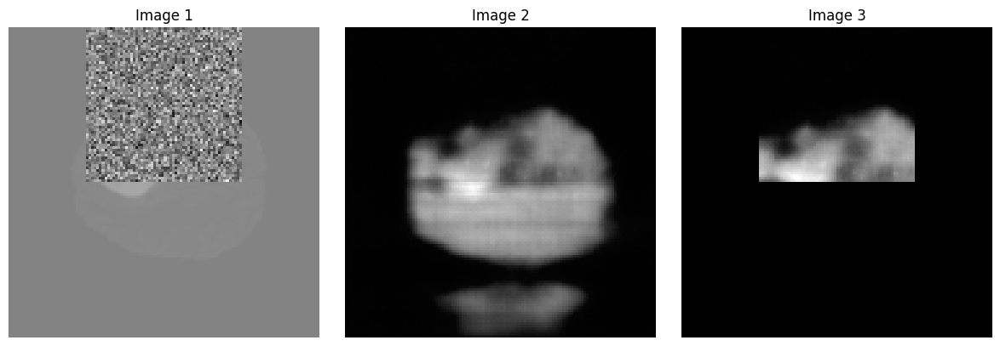

next


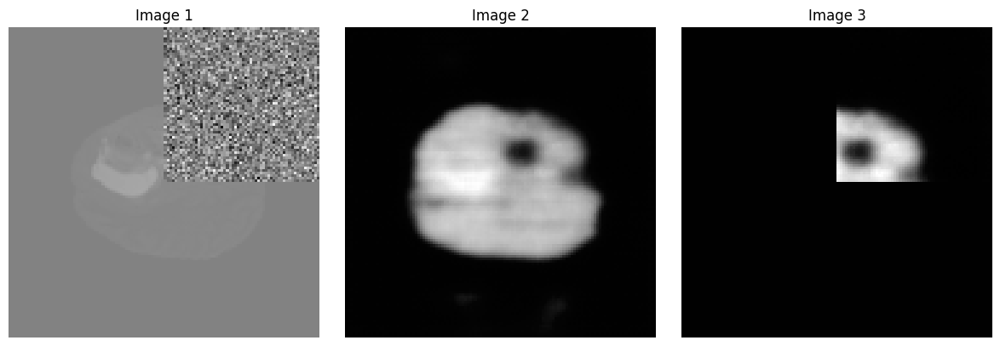

next


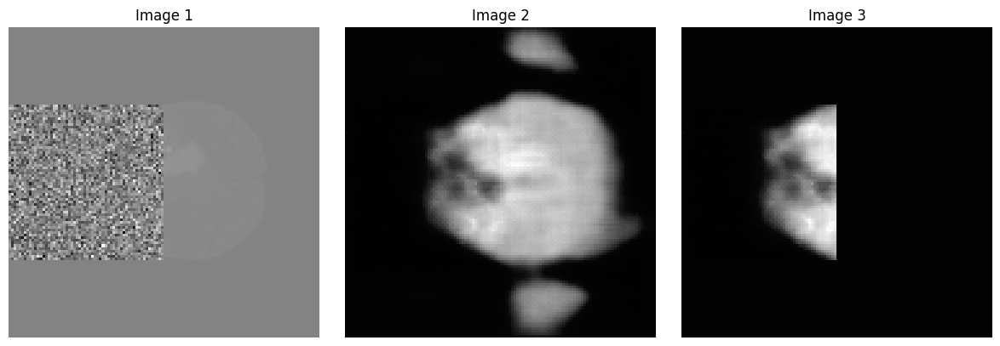

next


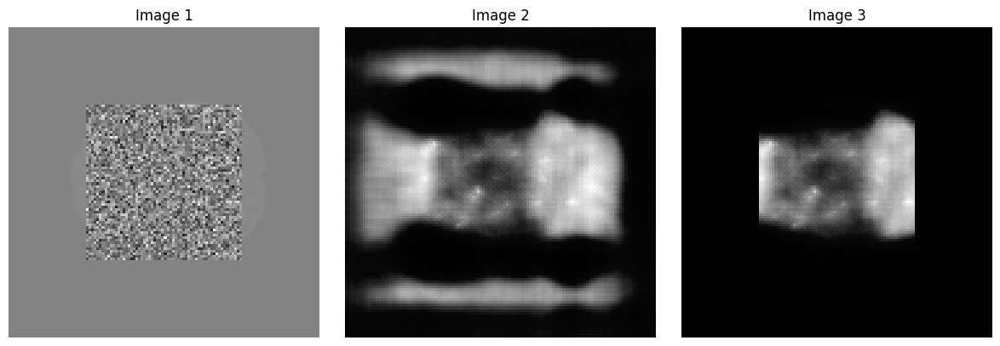

next


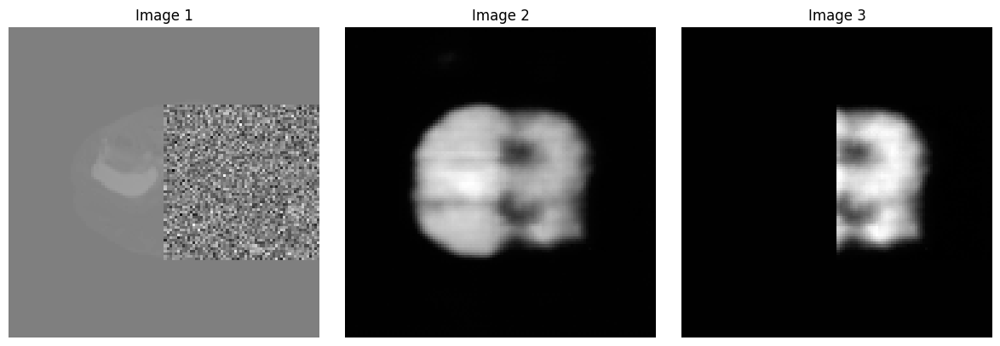

next


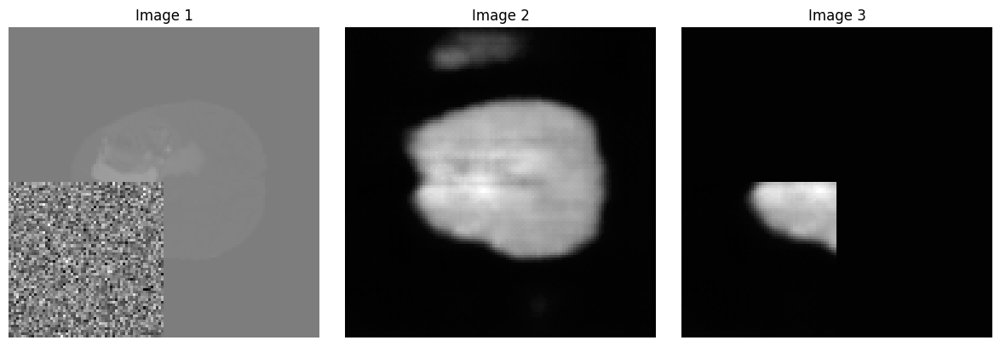

next


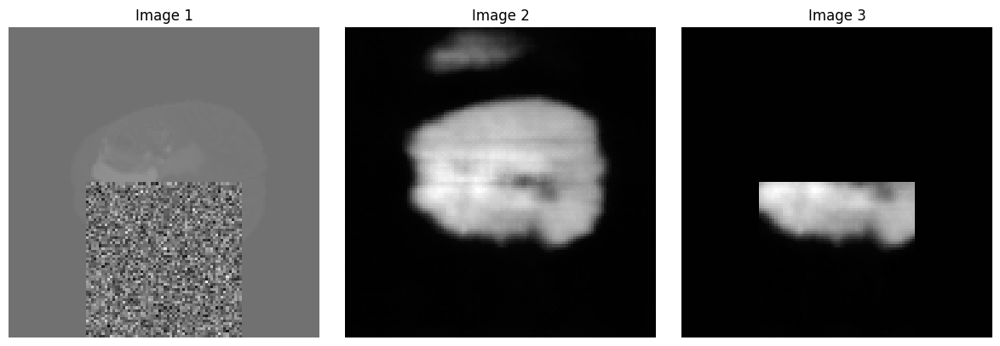

next


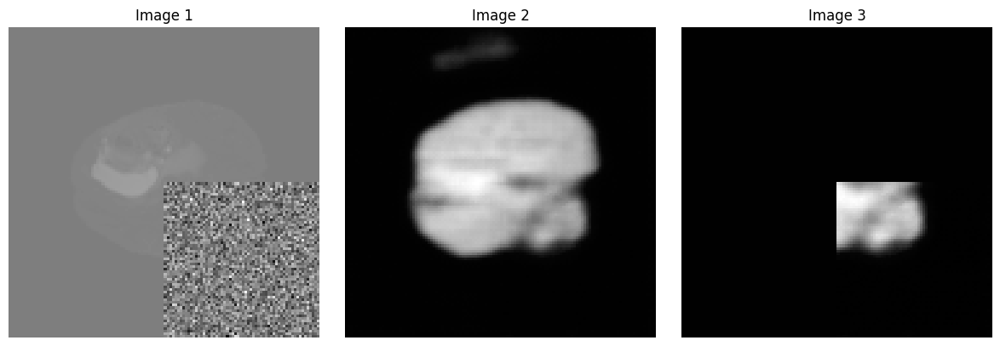

next


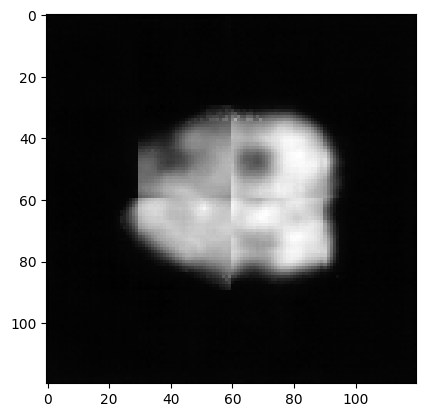

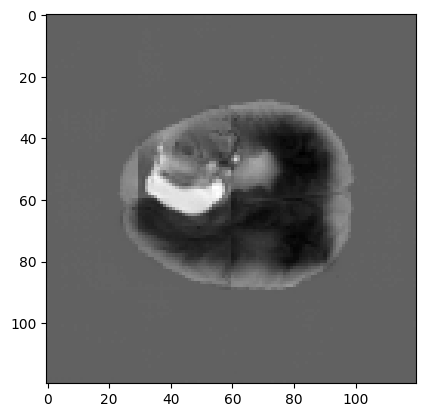

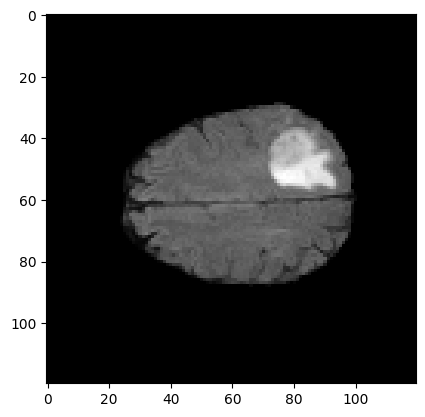

torch.Size([1, 1, 120, 120])


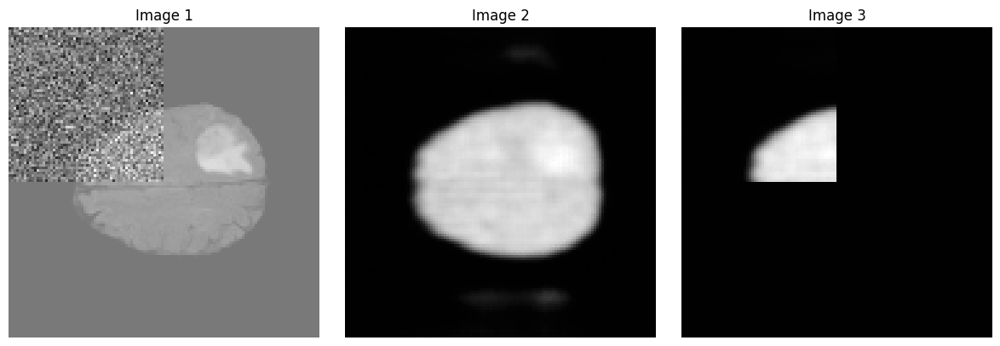

next


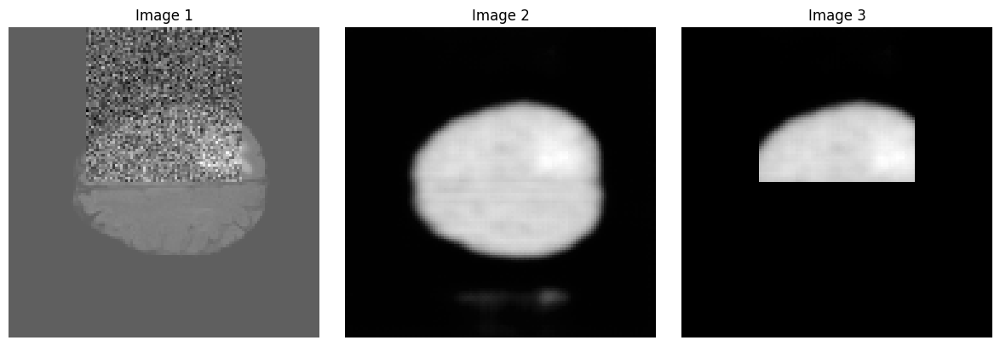

next


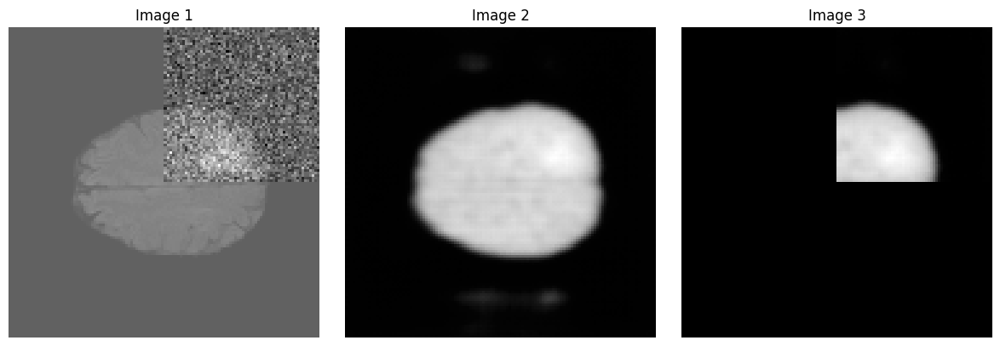

next


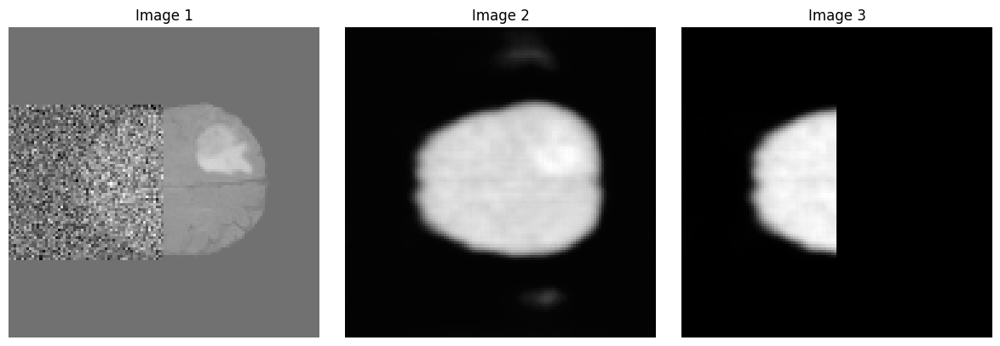

next


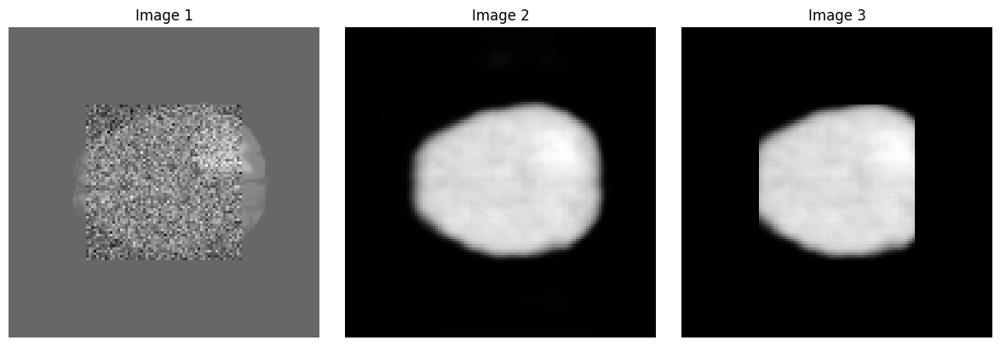

next


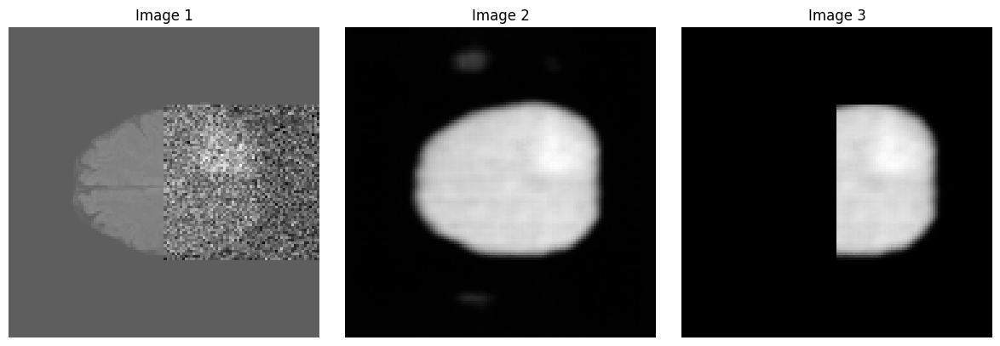

next


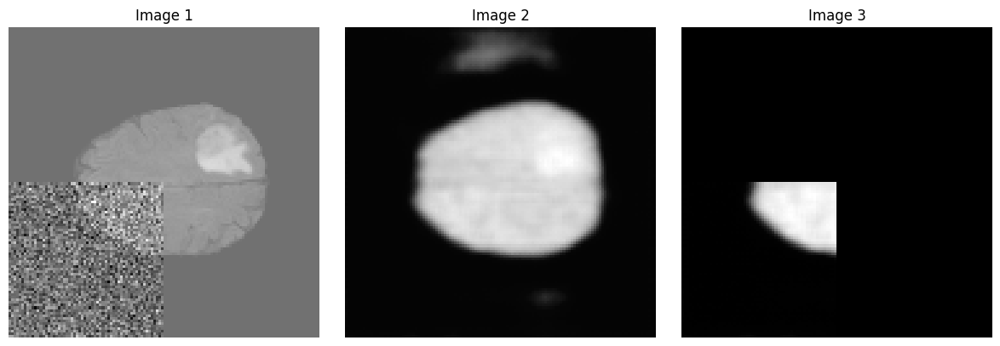

next


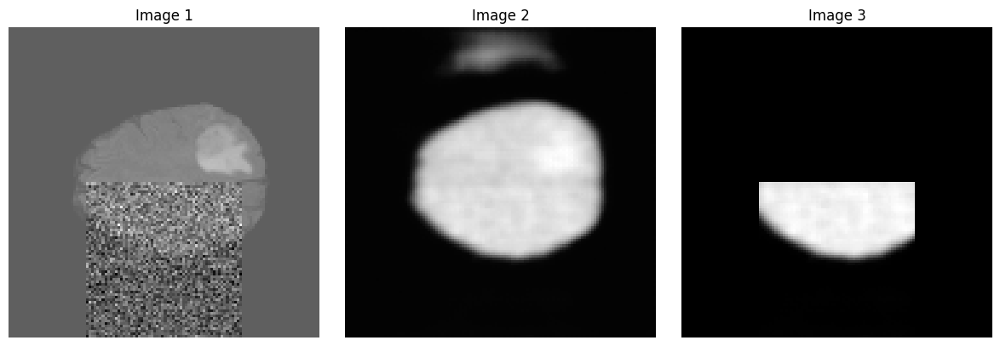

next


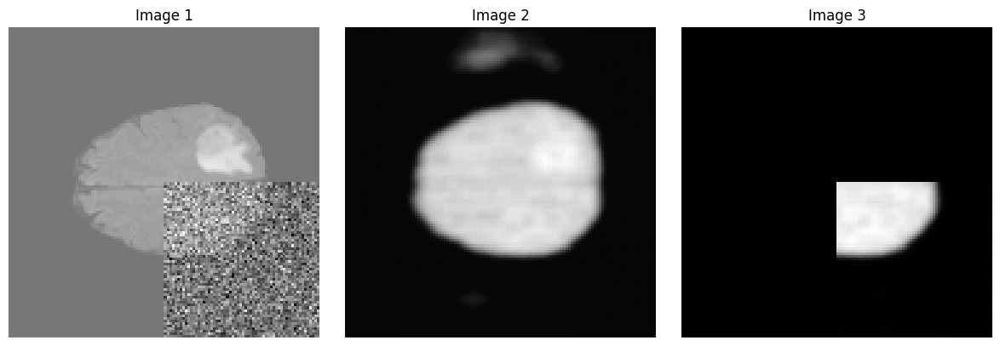

next


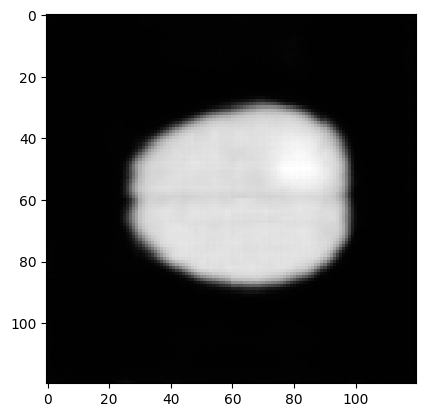

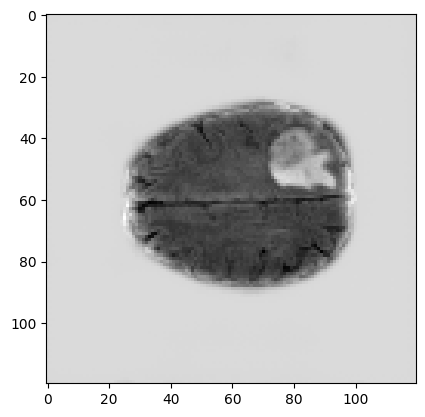

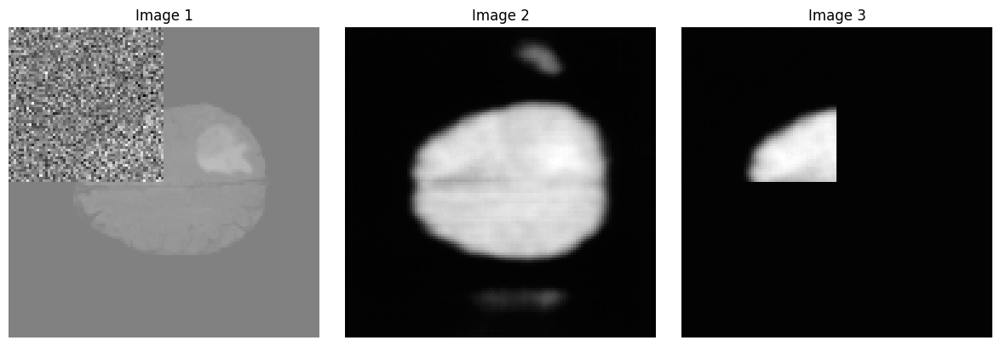

next


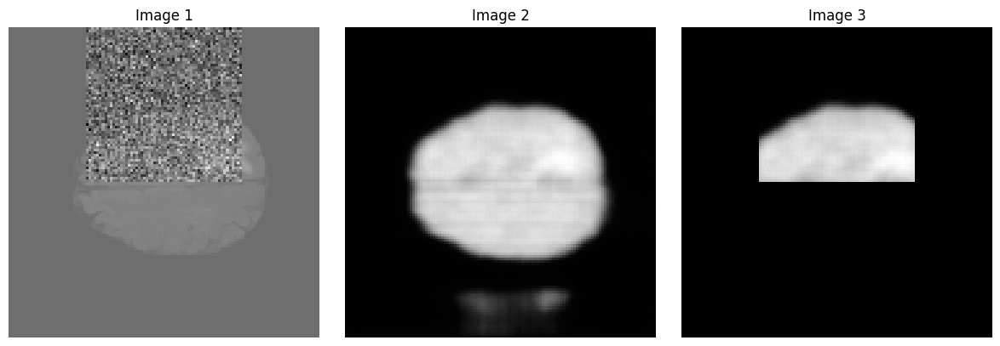

next


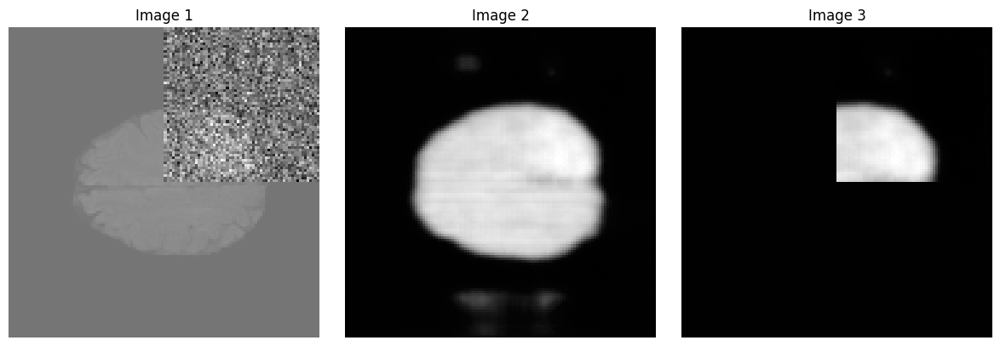

next


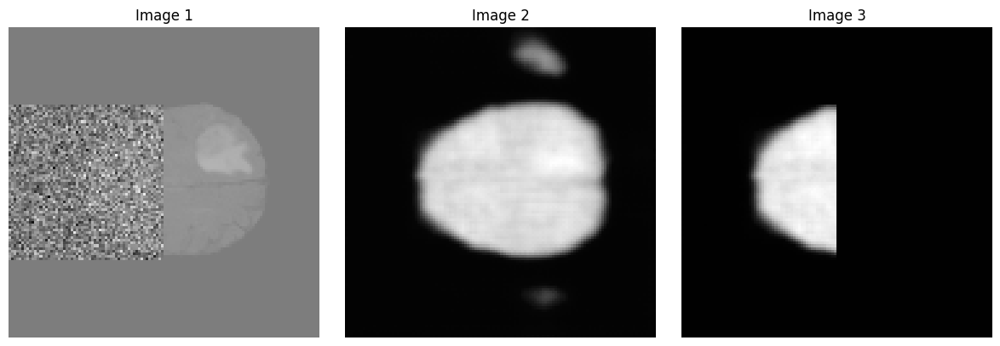

next


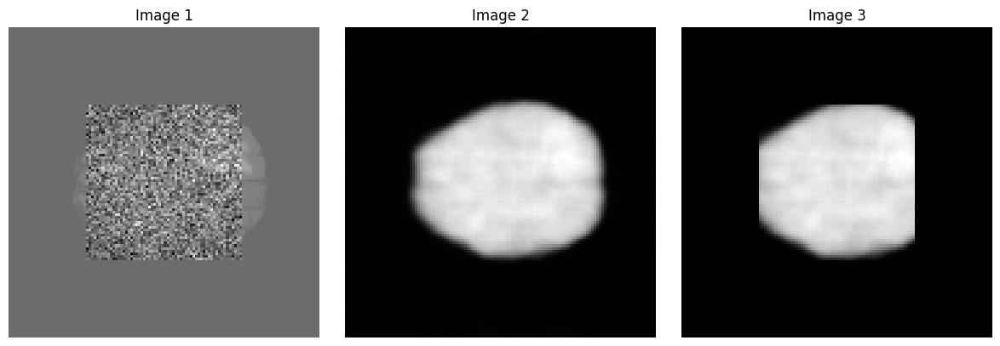

next


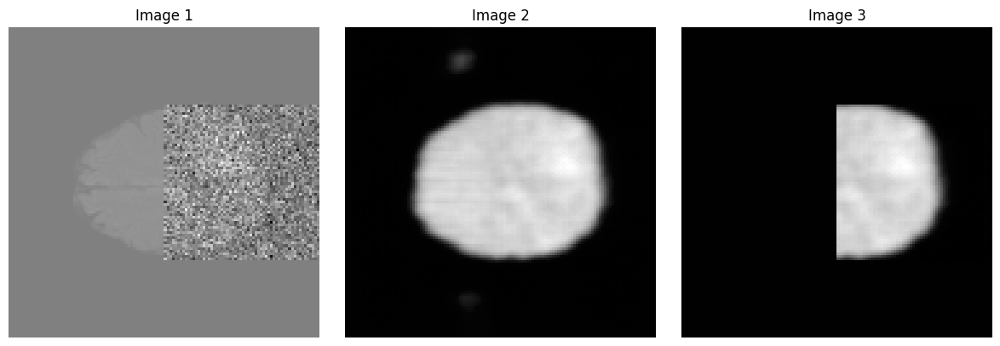

next


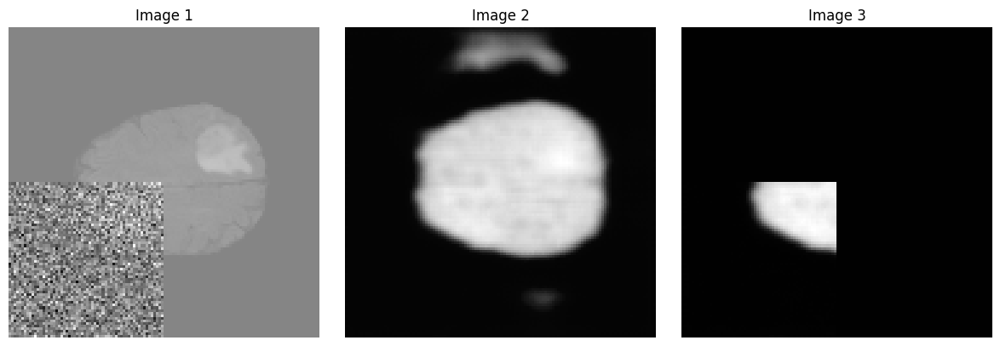

next


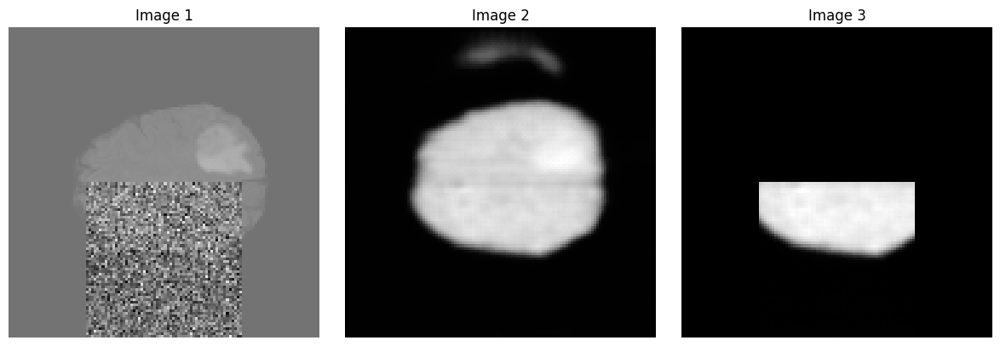

next


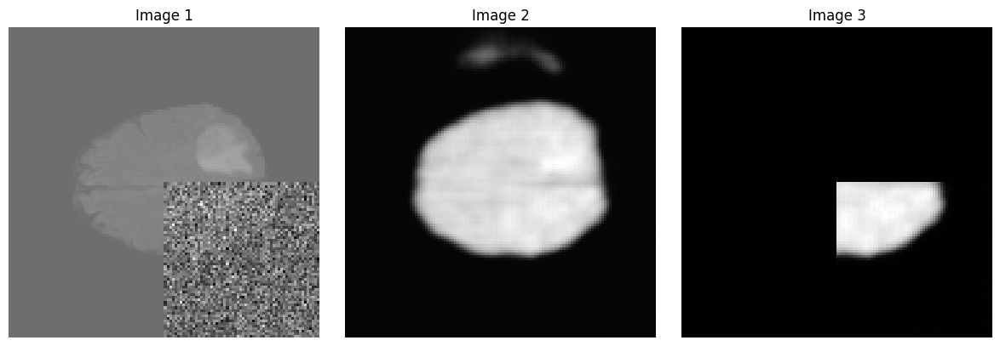

next


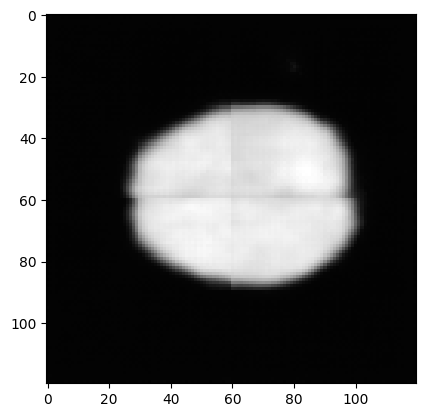

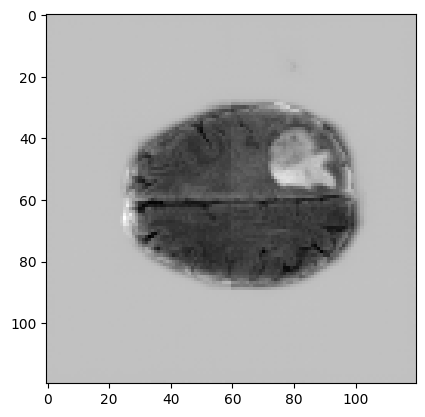

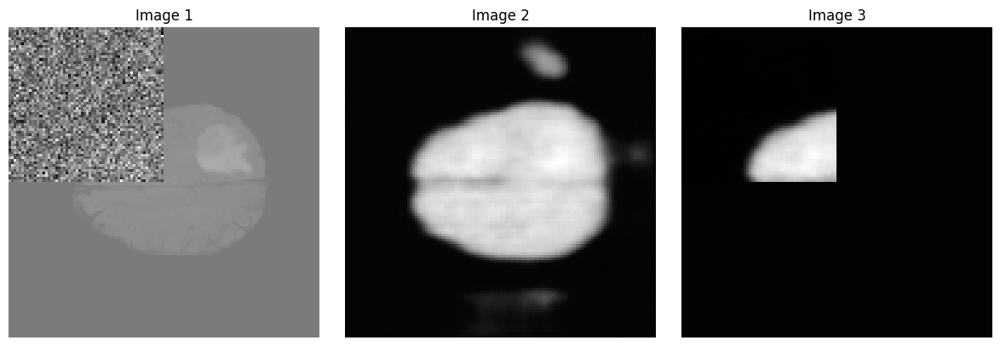

next


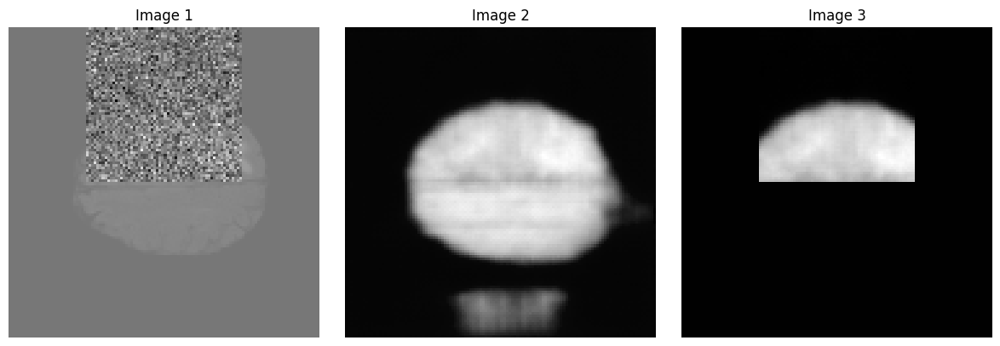

next


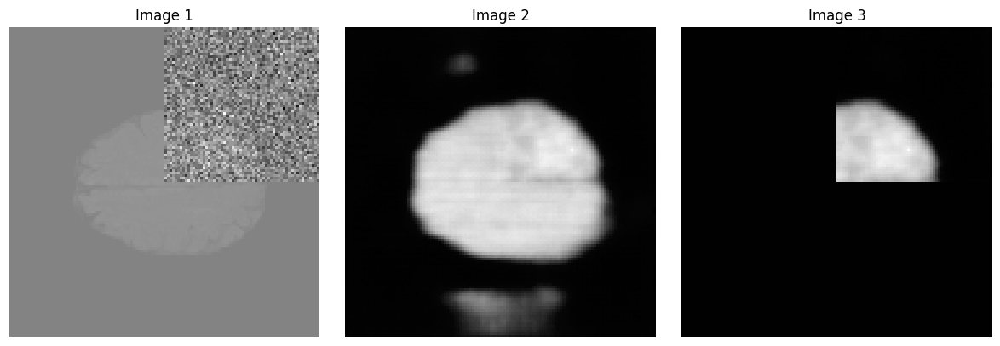

next


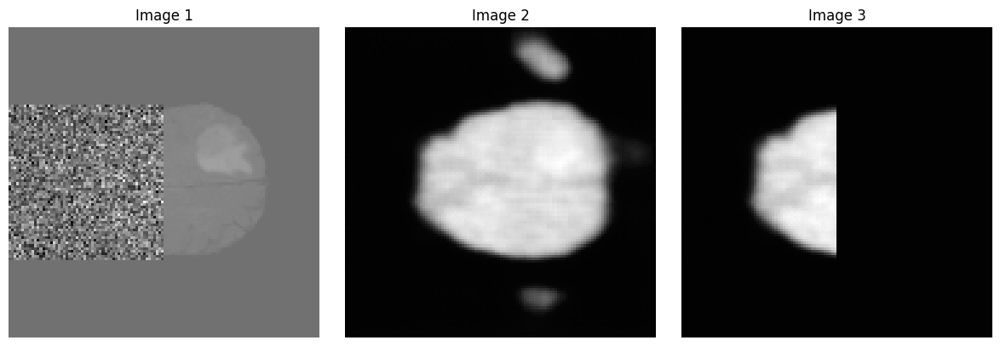

next


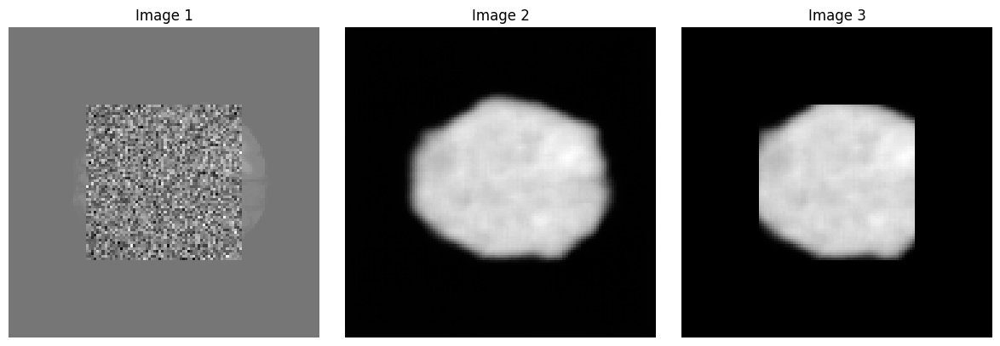

next


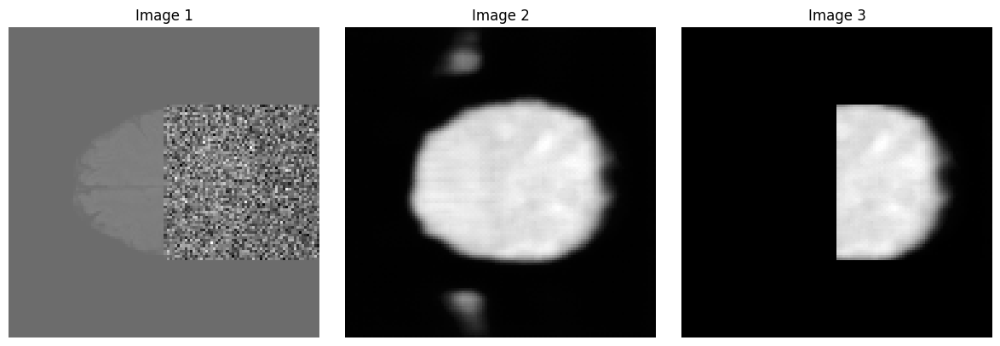

next


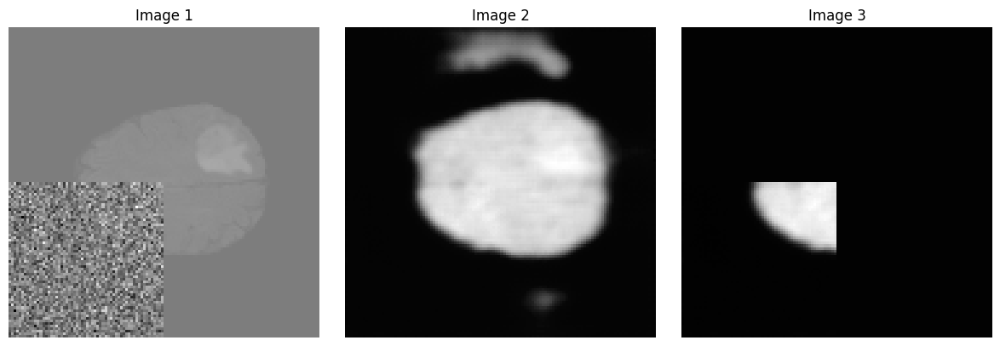

next


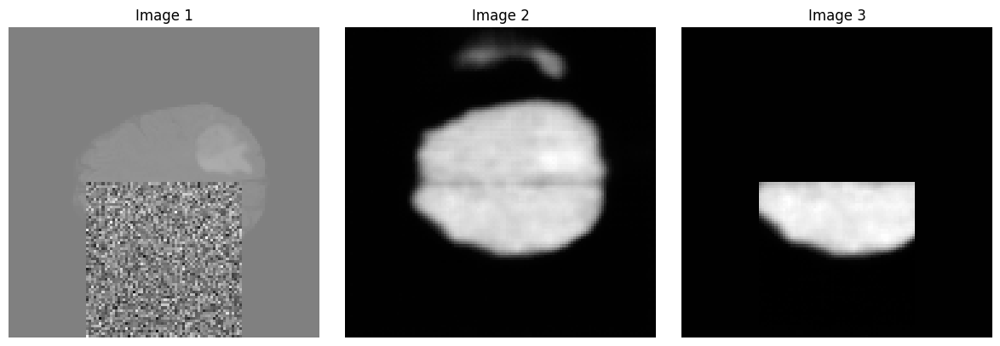

next


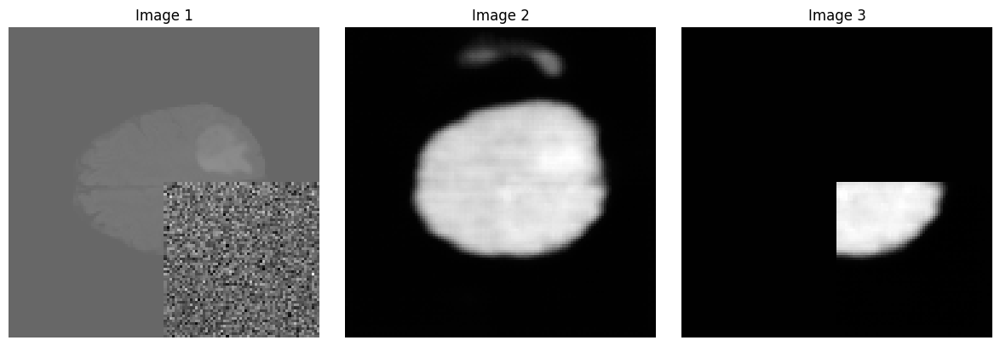

next


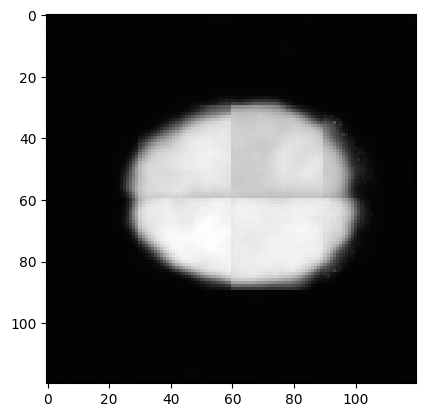

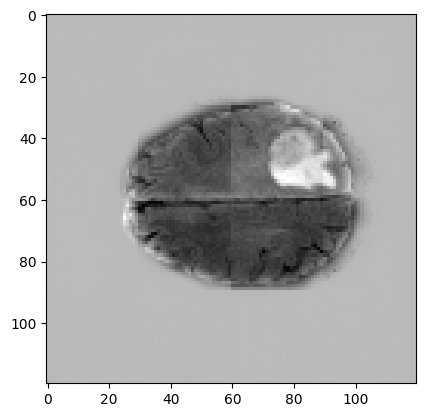

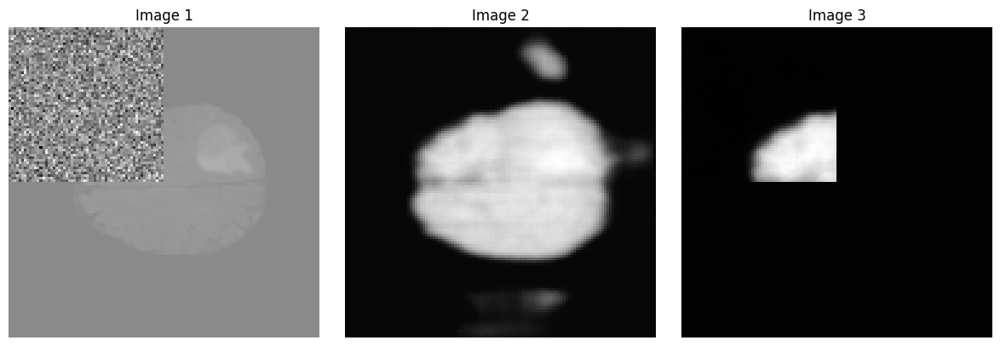

next


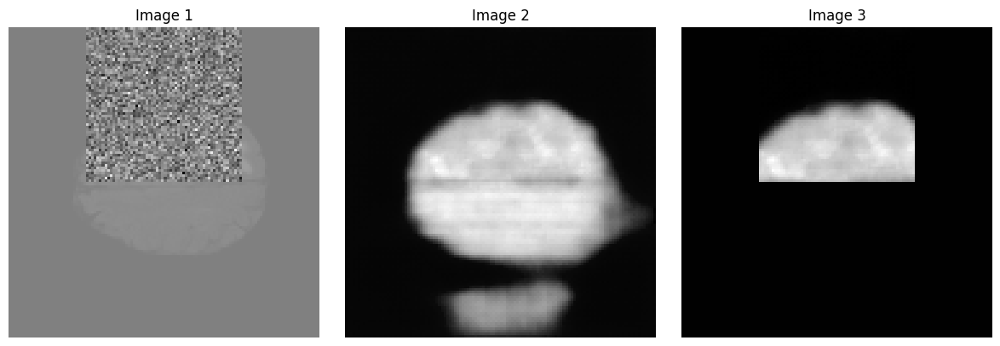

next


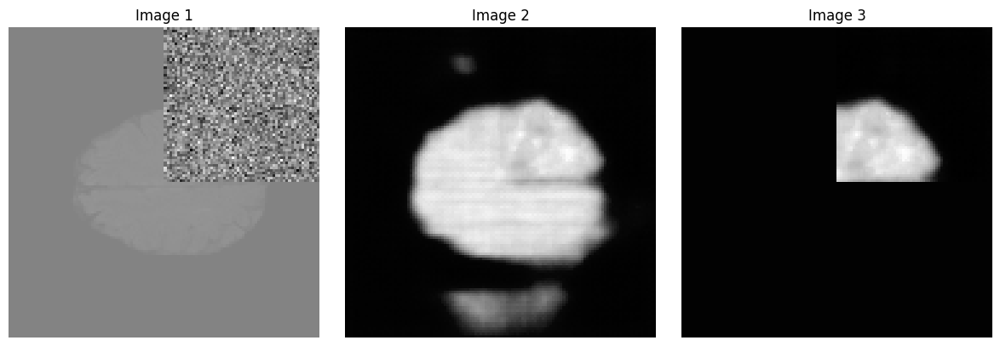

next


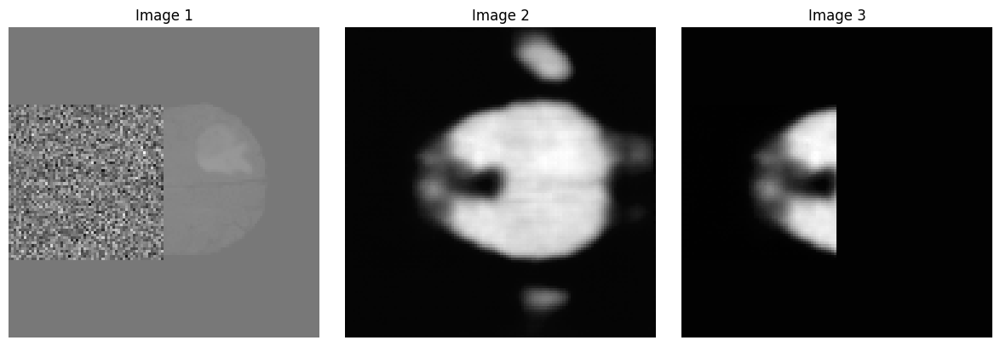

next


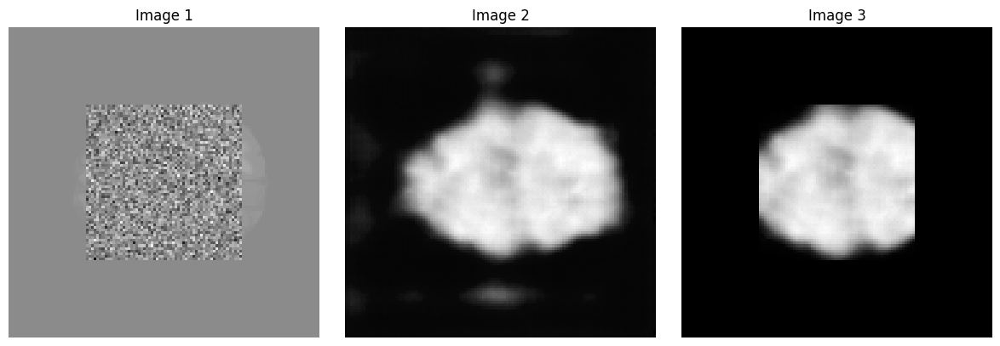

next


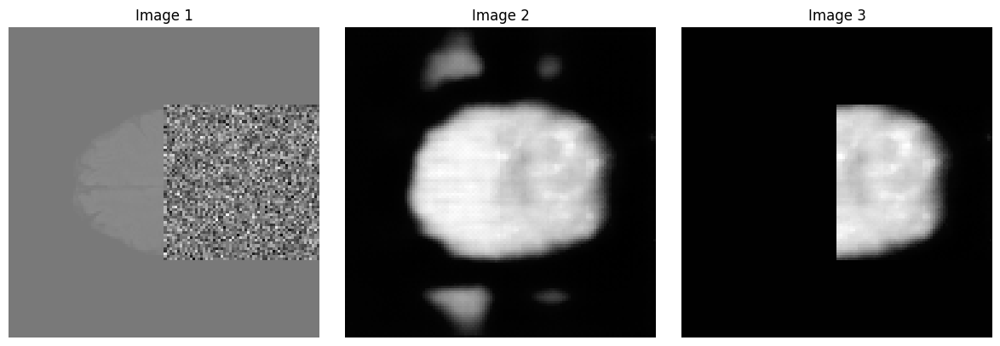

next


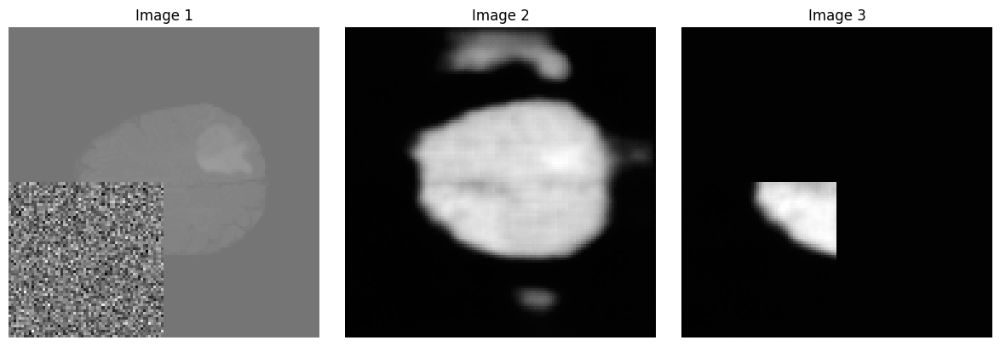

next


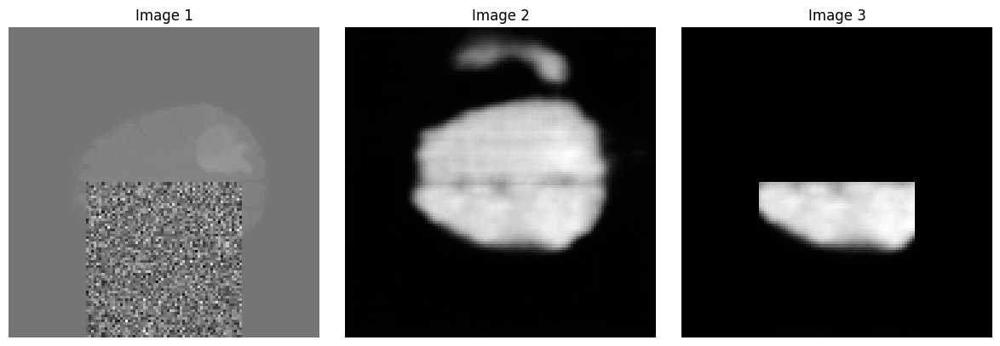

next


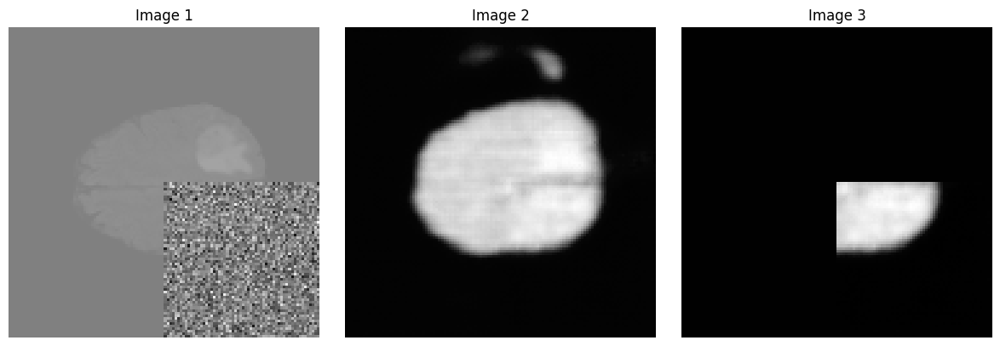

next


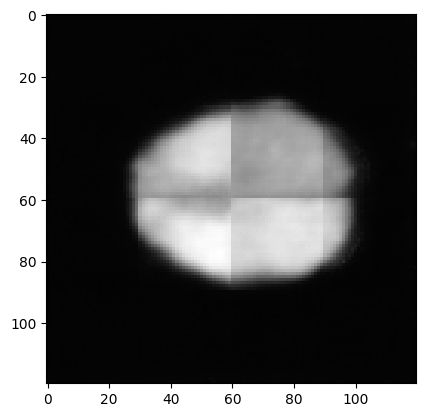

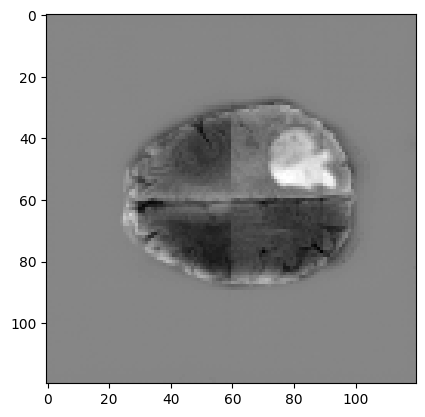

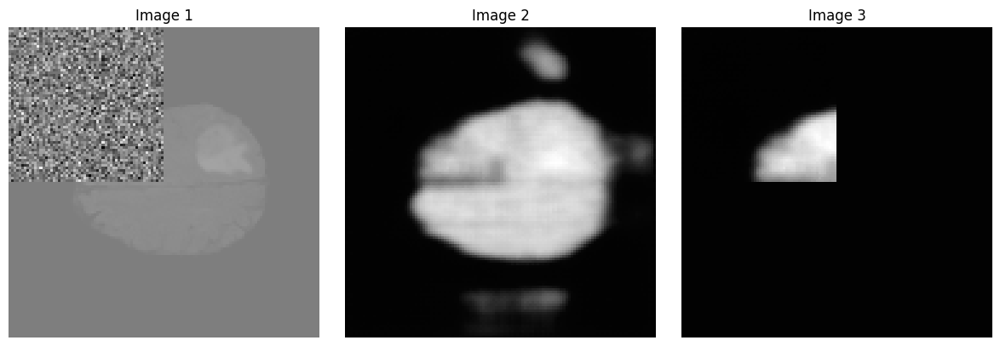

next


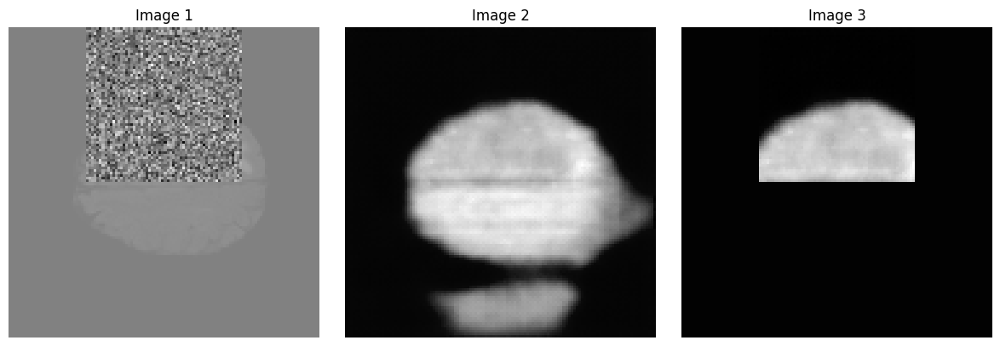

next


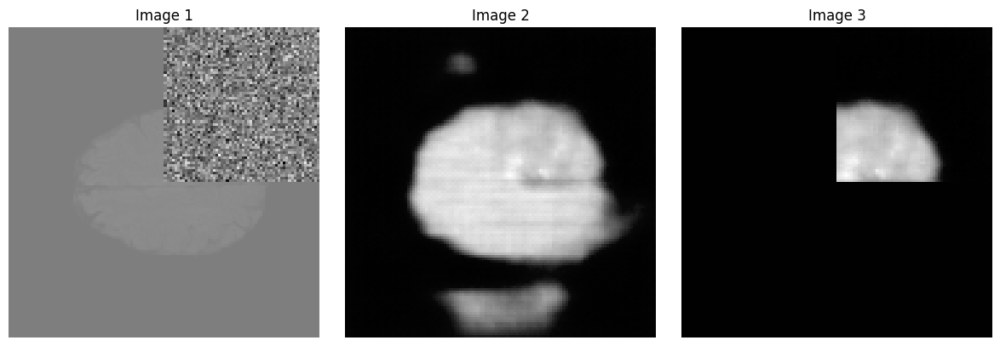

next


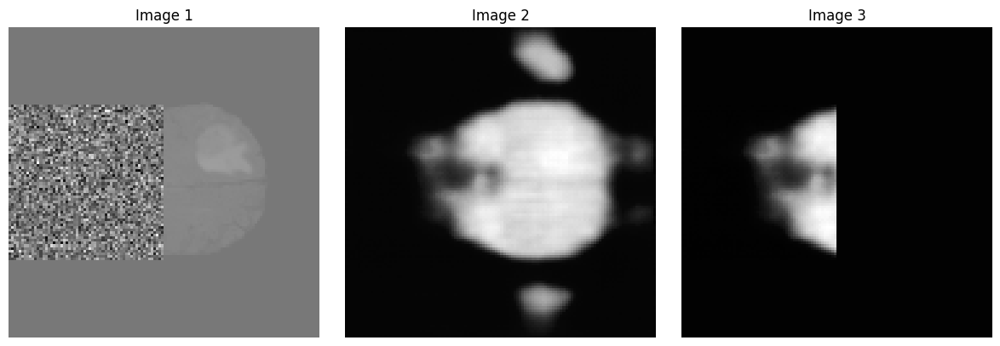

next


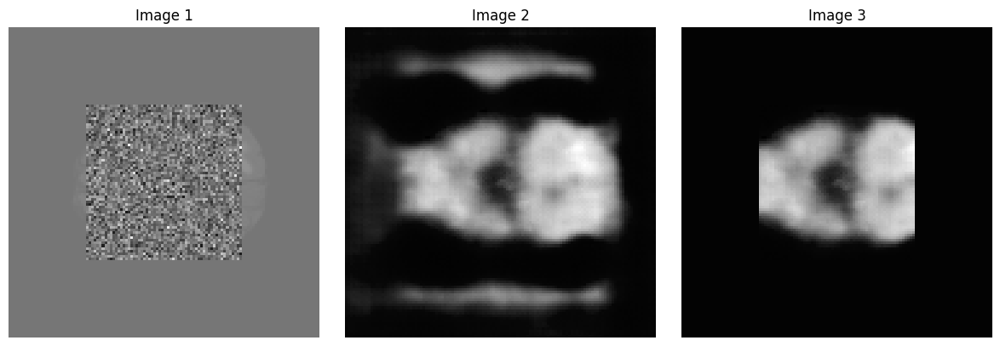

next


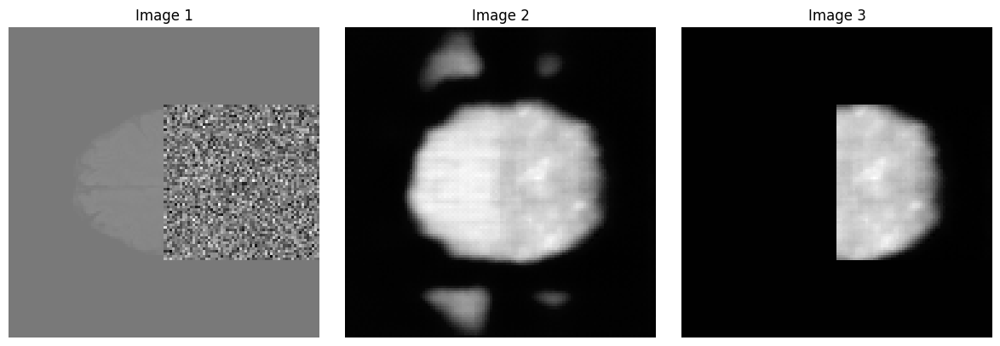

next


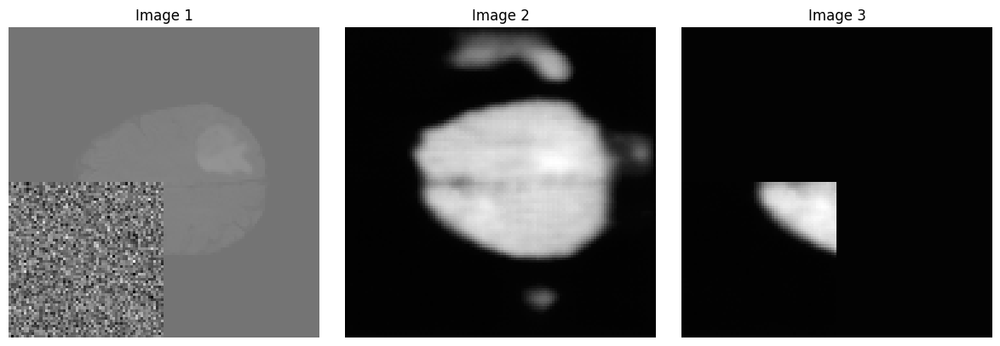

next


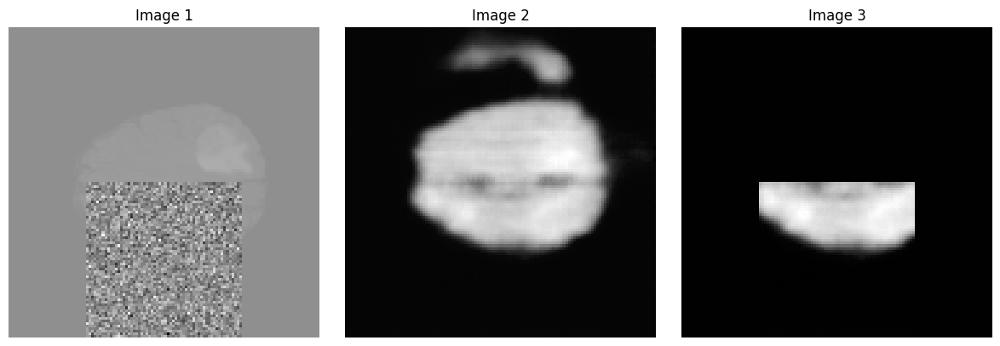

next


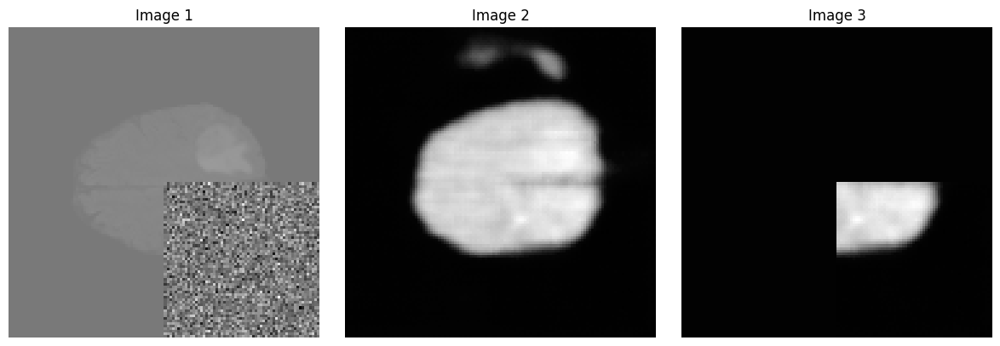

next


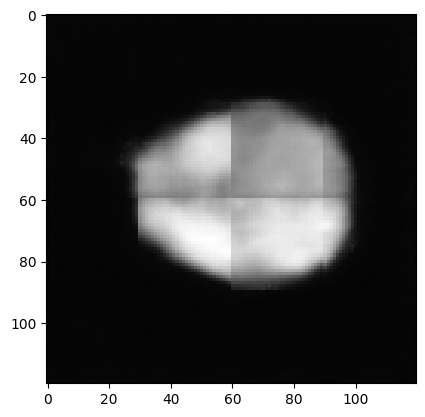

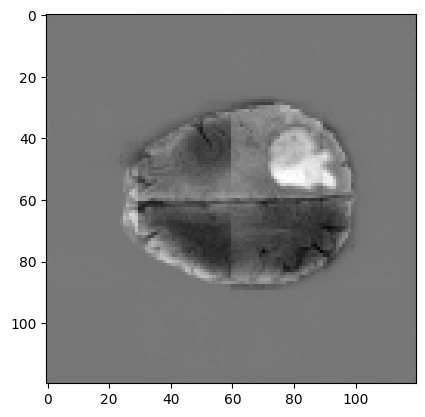

In [28]:


# def display_reverse(images):
    # fig, axes = plt.subplots(1, 1, figsize=(10,10))
    # for i, ax in enumerate(axes.flat):
    #     x = images[i].squeeze(0)
    #     print(x.shape)
    #     x = rearrange(x, 'c h w -> h w c')
    #     x = x.numpy()
    #     ax.imshow(x,cmap= 'gray')
    #     ax.axis('off')
    # plt.show()

def inference(checkpoint_path: str=None,
              num_time_steps: int=1000,
              ema_decay: float=0.9999, ):
    checkpoint = torch.load(checkpoint_path)
    model = UNET().to(device)
    model.load_state_dict(checkpoint['weights'])
    ema = ModelEmaV3(model, decay=ema_decay)
    ema.load_state_dict(checkpoint['ema'])
    scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
    times = [0,15,50,200,500,700,999]
    images = []
    img_path = glob("/kaggle/input/brats18/dataset/Validation/BraTS18_Validation_00*/BraTS18_Validation_00*_flair.nii")
    img_path.sort(key=natural_keys)
    for n in range(1,6):
        img_3D = nib.load(img_path[n]).get_fdata()
        patch = torch.tensor(downsample_volume(img_3D), dtype=torch.float32)
        patch = (patch[:,:,50]/torch.max(patch[:,:,50]+0.000001)).unsqueeze(0).unsqueeze(0)
        plt.imshow(patch.squeeze(0).squeeze(0),cmap='gray')
        plt.show()
        print(patch.shape)
        
        with torch.no_grad():
            model = ema.module.eval()
            
            time_ex=[100,200,300,500,999]
            for t in time_ex:
                x_final = []
                # print(x_final.shape)
                for i in range(len(mask)):
                  
                    e = torch.randn_like( patch, requires_grad=False)
                    a = scheduler.alpha[t].view(1,1,1,1)
                    x_out = (torch.sqrt(a)* patch) + (torch.sqrt(1-a)*e)
                    z = x_out*mask[i] +(1-mask[i])*patch
                    x_l = model(z.to(device),[500]).cpu()
                    x = x_l*mask[i]
                    # for t in reversed(range(1, num_time_steps)):
                    #     t = [t]
                    #     temp = (scheduler.beta[t]/( (torch.sqrt(1-scheduler.alpha[t]))*(torch.sqrt(1-scheduler.beta[t])) ))
                    #     z = (1/(torch.sqrt(1-scheduler.beta[t])))*z - (temp*model(z.to(device),t).cpu())
                    #     print(t)
                    #     print(model(z.to(device),t).shape)
                    #     break
                    #     if t[0] in times:
                    #         images.append(z)
                    #     e = torch.randn(1, 1, 240, 240)
                    #     z = z + (e*torch.sqrt(scheduler.beta[t]))
                    # temp = scheduler.beta[0]/( (torch.sqrt(1-scheduler.alpha[0]))*(torch.sqrt(1-scheduler.beta[0])) )
                    # x = (1/(torch.sqrt(1-scheduler.beta[0])))*z - (temp*model(z.to(device),[0]).cpu())
                    x_final.append(x)
                    images.append(x)
                    z = rearrange(z.squeeze(0), 'c h w -> h w c').detach().cpu()
                    z = z.numpy()
                    x_l = rearrange(x_l.squeeze(0), 'c h w -> h w c').detach().cpu()
                    x_l = x_l.numpy()
                    x = rearrange(x.squeeze(0), 'c h w -> h w c').detach().cpu()
                    x = x.numpy()
                    fig, axes = plt.subplots(1, 3, figsize=(12, 4))  # 1 row, 3 columns
                    axes[0].imshow(z, cmap='gray')
                    axes[0].set_title('Image 1')  # Optional: Add title
                    axes[0].axis('off')           # Optional: Remove axes
                    
                    axes[1].imshow(x_l, cmap='gray')
                    axes[1].set_title('Image 2')  # Optional
                    axes[1].axis('off')
                    
                    axes[2].imshow(x, cmap='gray')
                    axes[2].set_title('Image 3')  # Optional
                    axes[2].axis('off')
                    
                    plt.tight_layout()  # Adjust spacing between subplots
                    plt.show()
                    print("next")
                final = maskk(patch,x_final)
                plt.imshow(final,cmap='gray')
                plt.show()
                # print(x_final.shape,patch.shape)
                diff = patch.squeeze(0).squeeze(0)-final
                # diff[diff<0]=0
                plt.imshow(diff,cmap='gray')
                plt.show()
                # plt.imshow(z-x,cmap='gray')
            # plt.show()
            # display_reverse(images)
device='cuda'
inference('/kaggle/working/ddpm')
# inference("/kaggle/input/brain-dff-2/ddpm")



In [29]:

# def inference_2(checkpoint_path: str=None,
#               num_time_steps: int=1000,
#               ema_decay: float=0.9999, ):
#     checkpoint = torch.load(checkpoint_path)
#     model = UNET().to(device)
#     model.load_state_dict(checkpoint['weights'])
#     ema = ModelEmaV3(model, decay=ema_decay)
#     ema.load_state_dict(checkpoint['ema'])
#     scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
#     times = [0,15,50,100,200,300,400,550,700,999]
#     images = []

#     with torch.no_grad():
#         model = ema.module.eval()
#         for i in range(5):
#             z = torch.randn(1,1,120, 120)
#             # x = model(z.to(device),[999]).cpu()
#             for t in reversed(range(1, num_time_steps)):
#                 t = [t]
#                 temp = (scheduler.beta[t]/( (torch.sqrt(1-scheduler.alpha[t]))*(torch.sqrt(1-scheduler.beta[t])) ))
#                 z = (1/(torch.sqrt(1-scheduler.beta[t])))*z - (temp*model(z.to(device),t).cpu())
#                 if t[0] in times:
#                     images.append(z)
#                 e = torch.randn(1, 1, 120, 120)
#                 z = z + (e*torch.sqrt(scheduler.beta[t]))
#             temp = scheduler.beta[0]/( (torch.sqrt(1-scheduler.alpha[0]))*(torch.sqrt(1-scheduler.beta[0])) )
#             x = (1/(torch.sqrt(1-scheduler.beta[0])))*z - (temp*model(z.to(device),[0]).cpu())

#             images.append(x)
#             x = rearrange(x.squeeze(0), 'c h w -> h w c').detach()
#             x = x.numpy()
#             plt.imshow(x,cmap='gray')
#             plt.show()
#             # display_reverse(images)
            

In [30]:
# device='cuda'
# inference_2('/kaggle/working/ddpm')

In [31]:
# def display_reverse(images: List):
#     fig, axes = plt.subplots(1, 10, figsize=(10,1))
#     for i, ax in enumerate(axes.flat):
#         x = images[i].squeeze(0)
#         x = rearrange(x, 'c h w -> h w c')
#         x = x.numpy()
#         ax.imshow(x)
#         ax.axis('off')
#     plt.show()

# def inference(checkpoint_path: str=None,
#               num_time_steps: int=1000,
#               ema_decay: float=0.9999, ):
#     checkpoint = torch.load(checkpoint_path)
#     model = UNET().to(device)
#     model.load_state_dict(checkpoint['weights'])
#     ema = ModelEmaV3(model, decay=ema_decay)
#     ema.load_state_dict(checkpoint['ema'])
#     scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
#     times = [0,15,50,100,200,300,400,550,700,999]
#     images = []

#     with torch.no_grad():
#         model = ema.module.eval()
#         for i in range(20):
#             z = torch.randn(1, 1, 120, 120)
#             for t in reversed(range(1, num_time_steps)):
#                 t = [t]
#                 temp = (scheduler.beta[t]/( (torch.sqrt(1-scheduler.alpha[t]))*(torch.sqrt(1-scheduler.beta[t])) ))
#                 z = (1/(torch.sqrt(1-scheduler.beta[t])))*z - (temp*model(z.to(device),t).cpu())
#                 if t[0] in times:
#                     images.append(z)
#                 e = torch.randn(1, 1, 120, 120)
#                 z = z + (e*torch.sqrt(scheduler.beta[t]))
#             temp = scheduler.beta[0]/( (torch.sqrt(1-scheduler.alpha[0]))*(torch.sqrt(1-scheduler.beta[0])) )
#             x = (1/(torch.sqrt(1-scheduler.beta[0])))*z - (temp*model(z.to(device),[0]).cpu())

#             images.append(x)
#             x = rearrange(x.squeeze(0), 'c h w -> h w c').detach()
#             x = x.numpy()
#             plt.imshow(x)
#             plt.show()
#             display_reverse(images)
#             images = []

In [32]:
# device='cuda'
# inference('/kaggle/working/ddpm')

In [33]:
# def inference(checkpoint_path: str=None,
#                              num_time_steps: int=1000,
#                              ema_decay: float=0.9999):
#     checkpoint = torch.load(checkpoint_path)
#     model = UNET().to(device)
#     model.load_state_dict(checkpoint['weights'])
#     ema = ModelEmaV3(model, decay=ema_decay)
#     ema.load_state_dict(checkpoint['ema'])
#     scheduler = DDPM_Scheduler(num_time_steps=num_time_steps)
    
#     with torch.no_grad():
#         model = ema.module.eval()
        
#         # Initialize with random noise
#         z = torch.randn(1, 1, 32, 32).to(device)
        
#         # Directly predict the denoised image for the final step
#         final_step = 10# Final step index
#         temp = (scheduler.beta[final_step] / 
#                 ((torch.sqrt(1 - scheduler.alpha[final_step])) * 
#                  (torch.sqrt(1 - scheduler.beta[final_step]))))
        
#         x = (1 / (torch.sqrt(1 - scheduler.beta[final_step]))) * z - \
#             (temp * model(z, [final_step]).cpu())
        
#         # Convert tensor to numpy image and display
#         x = rearrange(x.squeeze(0), 'c h w -> h w c').detach()
#         x = x.numpy()
#         plt.imshow(x)
#         plt.axis('off')
#         plt.show()


In [34]:
# device='cpu'
# inference('/kaggle/working/ddpm')